In [2]:
import os
import time
import rasterio
import pickle
import numpy as np
import pandas as pd
import xarray as xr
import seaborn as sns
import datetime as dt
import rioxarray as rxr
import geopandas as gpd
import matplotlib.pyplot as plt
from scipy.stats import kendalltau
from scipy import stats, interpolate
from pandas import date_range, to_datetime
import dask
import dask.dataframe as dd
import matplotlib.dates as mdates
import logging
import dask.array as da
from joblib import Parallel, delayed
from dask import config as dask_config
from dask.diagnostics import ProgressBar
import warnings
# from helper_functions import * # Helper functions
from statsmodels.distributions.empirical_distribution import ECDF
from copulae import GaussianCopula, ClaytonCopula, FrankCopula, GumbelCopula, StudentCopula # Using Copulae Module

In [1]:
# Set dataset directory
dataset = '../../../datasets/'
output_dir = '../../../datasets/results'

In [3]:
variables = xr.open_dataset(os.path.join(dataset, 'processed_final_data/daily_dataset'), chunks={'time': 500, 'y': 175, 'x': 148})

In [9]:
tws_data = xr.open_dataset(os.path.join(dataset, 'full_gha_tws.nc'))

In [4]:
tws = xr.open_dataset(os.path.join(dataset, 'processed_final_data/full_gha_daily.nc'),  chunks={'time': 500, 'y': 175, 'x': 148})

In [51]:
spi_30 = xr.open_dataset(os.path.join(dataset, 'validation_datasets/results_spi_gamma_30.nc'))
spi_90 = xr.open_dataset(os.path.join(dataset, 'validation_datasets/results_spi_gamma_90.nc'))
spi_180 = xr.open_dataset(os.path.join(dataset, 'validation_datasets/results_spi_gamma_180.nc'))
spi_360 = xr.open_dataset(os.path.join(dataset, 'validation_datasets/results_spi_gamma_360.nc'))

In [16]:
print(tws)

<xarray.Dataset>
Dimensions:  (y: 698, x: 591, time: 7671)
Coordinates:
    lat      (y) float64 ...
    lon      (x) float64 ...
    band     int64 ...
  * y        (y) float64 23.12 23.07 23.02 22.97 ... -11.58 -11.63 -11.68 -11.73
  * x        (x) float64 21.88 21.93 21.98 22.03 ... 51.23 51.28 51.33 51.38
  * time     (time) datetime64[ns] 2004-01-01 2004-01-02 ... 2024-12-31
Data variables:
    twsddk   (time, y, x) float64 ...


In [22]:
print(variables)

<xarray.Dataset>
Dimensions:        (x: 591, y: 698, time: 7671)
Coordinates:
    band           int64 ...
  * x              (x) float64 21.88 21.93 21.98 22.03 ... 51.28 51.33 51.38
  * y              (y) float64 23.12 23.07 23.02 22.97 ... -11.63 -11.68 -11.73
  * time           (time) datetime64[ns] 2004-01-01 2004-01-02 ... 2024-12-31
    spatial_ref    int64 ...
    lat            (y) float64 dask.array<chunksize=(175,), meta=np.ndarray>
    lon            (x) float64 dask.array<chunksize=(148,), meta=np.ndarray>
Data variables:
    precipitation  (time, y, x) float32 dask.array<chunksize=(500, 175, 148), meta=np.ndarray>
    et             (time, y, x) float64 dask.array<chunksize=(500, 175, 148), meta=np.ndarray>
    sm             (time, y, x) float64 dask.array<chunksize=(500, 175, 148), meta=np.ndarray>
    tws            (time, y, x) float64 dask.array<chunksize=(500, 175, 148), meta=np.ndarray>
    landform       (y, x) float64 dask.array<chunksize=(175, 148), meta=np.ndar

In [5]:
variables['tws_ds'] = tws.twsddk

##### Smoothing function

In [525]:
# Set up logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

# Define EMA function (dask-compatible, from previous code)
def compute_ema_dask(da, span, dim='time'):
    logging.info(f"Computing EMA for span {span} along dimension {dim}")
    alpha = 2 / (span + 1)
    
    def ema_1d(arr, alpha):
        result = np.empty_like(arr)
        result[0] = arr[0]
        for t in range(1, len(arr)):
            result[t] = alpha * arr[t] + (1 - alpha) * result[t-1]
        return result
    
    return xr.apply_ufunc(
        ema_1d, da,
        input_core_dims=[[dim]], output_core_dims=[[dim]],
        vectorize=True, dask='parallelized',
        output_dtypes=[da.dtype],
        dask_gufunc_kwargs={'allow_rechunk': True},
        kwargs={'alpha': alpha}
    )

In [6]:
# Define SMA function
def compute_sma(da, window, dim='time'):
    logging.info(f"Computing SMA for window {window} along dimension {dim}")
    return da.rolling(time=window, center=False).mean()

In [6]:
# Define EMA with rolling_exp
def apply_ema(da, span):
    return da.rolling_exp(time=span, window_type="span").mean()

##### Timeseries Visualisation

In [205]:
lat = 5.34
lon = 45.34

et_poi = ds_et_dekadal.sel(y=lat, x=lon, method='nearest')
pre_poi = ds_precip_dekadal.sel(y=lat, x=lon, method='nearest')
tws_poi = ds_tws_dekadal.sel(y=lat, x=lon, method='nearest')

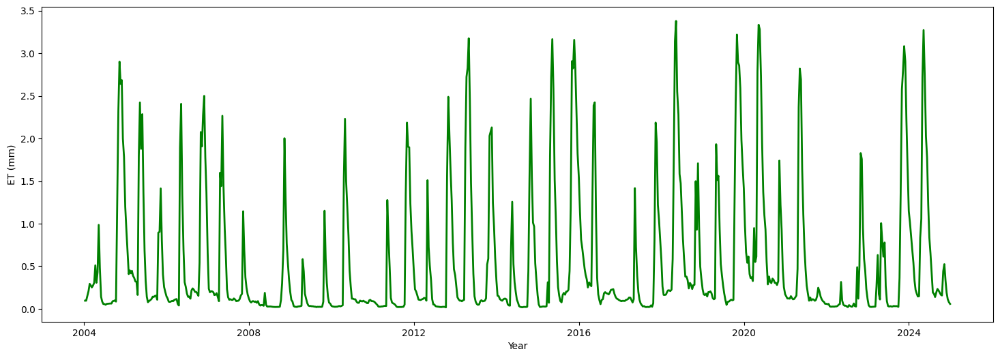

In [206]:
plt.figure(figsize=(18, 6))  # Adjust width and height as needed
plt.plot(et_poi.time, et_poi.values, color='green', linewidth=2)
plt.xlabel("Year")
plt.ylabel("ET (mm)")
# plt.title("Time Series Plot")
plt.show()

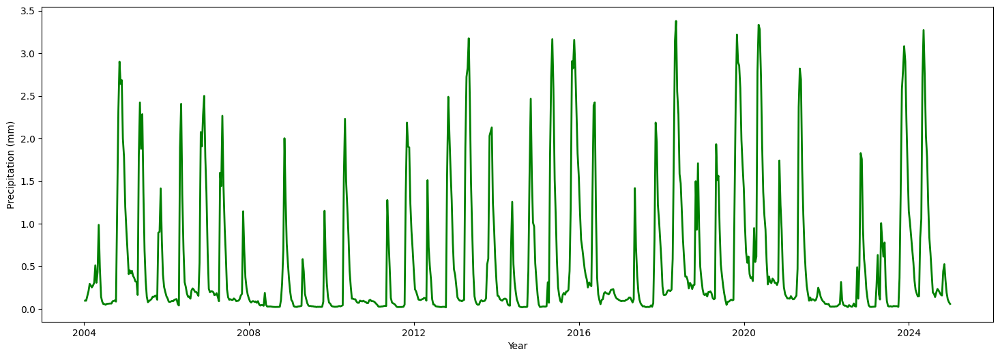

In [18]:
plt.figure(figsize=(18, 6))  # Adjust width and height as needed
plt.plot(et_poi.time, et_poi.values, color='green', linewidth=2)
plt.xlabel("Year")
plt.ylabel("Precipitation (mm)")
# plt.title("Time Series Plot")
plt.show()

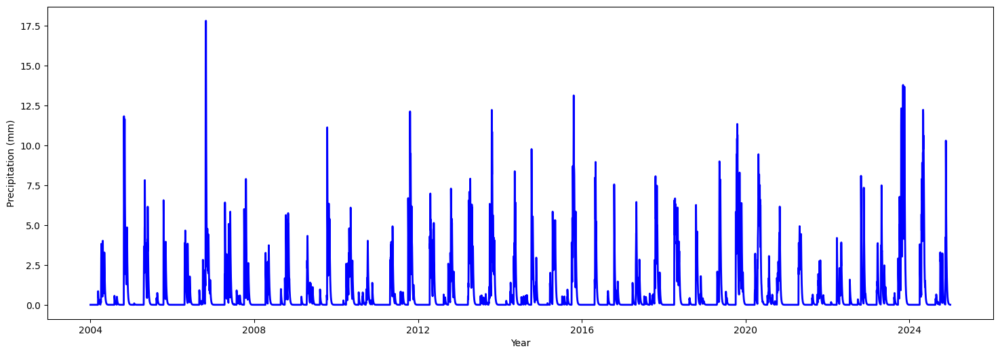

In [81]:
plt.figure(figsize=(18, 6))  # Adjust width and height as needed
plt.plot(pre_poi.time, pre_poi.values, color='blue', linewidth=2)
plt.xlabel("Year")
plt.ylabel("Precipitation (mm)")
# plt.title("Time Series Plot")
plt.show()

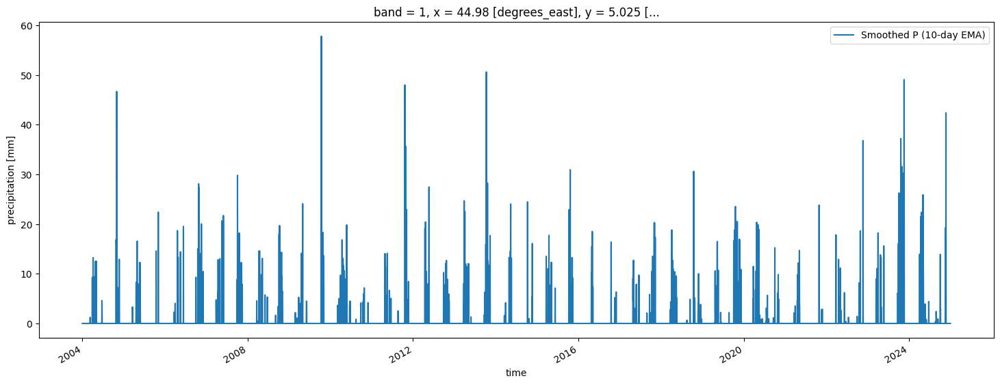

In [8]:
lat = 5
lon = 45
plt.figure(figsize=(18, 6))
precipitation_data.sel(y=lat, x=lon, method='nearest').plot(label='Smoothed P (10-day EMA)')
# et_smoothed.sel(y=lat, x=lon, method='nearest').plot(label='Smoothed ET (10-day EMA)')
# tws_daily.sel(y=5, x=45, method='nearest').plot(label='Interpolated TWS')
plt.legend()
plt.show()



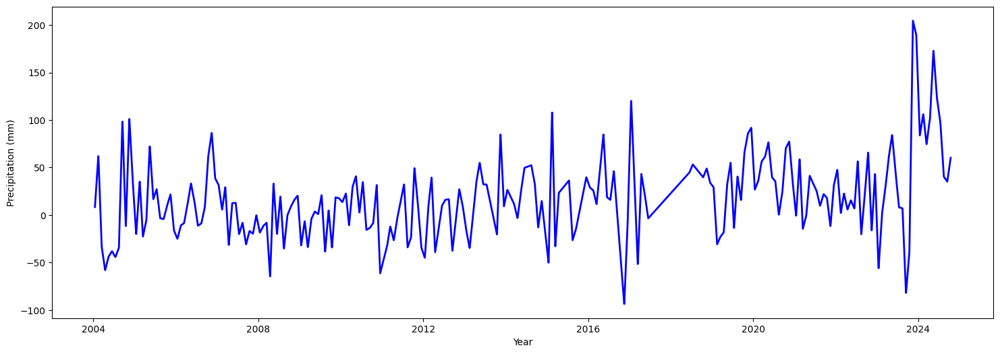

In [45]:
plt.figure(figsize=(18, 6))  # Adjust width and height as needed
plt.plot(tws_poi.time, tws_poi.values, color='blue', linewidth=2)
plt.xlabel("Year")
plt.ylabel("Precipitation (mm)")
# plt.title("Time Series Plot")
plt.show()

In [203]:
lat = 5
lon = 45
plt.figure(figsize=(18, 6))
precipitation_smoothed.sel(y=lat, x=lon, method='nearest').plot(label='Smoothed P (10-day EMA)')
et_smoothed.sel(y=lat, x=lon, method='nearest').plot(label='Smoothed ET (10-day EMA)')
tws_daily.sel(y=5, x=45, method='nearest').plot(label='Interpolated TWS').xlim=(-20, 20)
plt.legend()
plt.show()

NameError: name 'precipitation_smoothed' is not defined

<Figure size 1800x600 with 0 Axes>

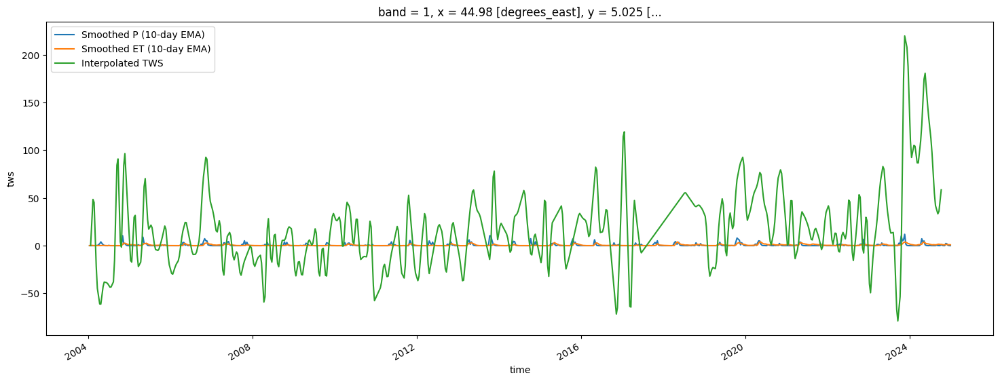

In [24]:
lat = 5
lon = 45
plt.figure(figsize=(18, 6))
ds_combined.ppt.sel(y=lat, x=lon, method='nearest').plot(label='Smoothed P (10-day EMA)')
ds_combined.et.sel(y=lat, x=lon, method='nearest').plot(label='Smoothed ET (10-day EMA)')
ds_combined.tws.sel(y=5, x=45, method='nearest').plot(label='Interpolated TWS')
plt.legend()
plt.show()

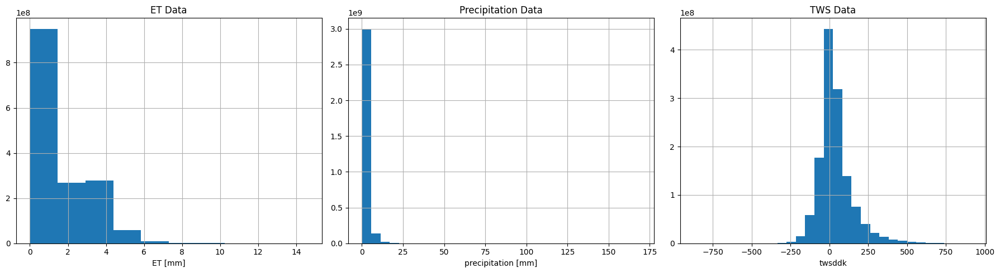

In [53]:
# Histogram distribution
fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=False)

et.plot.hist(ax=axes[0], bins=10)
axes[0].grid(True)
axes[0].set_title('ET Data')

precipitation.plot.hist(ax=axes[1], bins=30)
axes[1].grid(True)
axes[1].set_title('Precipitation Data')

tws.plot.hist(ax=axes[2], bins=30)
axes[2].grid(True)
axes[2].set_title('TWS Data')

plt.tight_layout()
plt.show()

### Subzone Processing

Some of the zones were already processed and saved to file, so I'll read them here

`The process crash because it was too large and was processed in chunks`

In [7]:
start = time.time()
landform_classes = np.unique(variables['landform'].values[~np.isnan(variables['landform'].values)])
print('Extracted Landform classes')

# Dictionary to store subregion datasets
subregion_datasets = {}

# Loop through each subregion
for subregion_id in landform_classes[:4]:
    if np.isnan(subregion_id): 
        continue
    # Mask the combined dataset where landform matches the subregion ID
    subregion_mask = variables['landform'] == subregion_id
    subregion_ds = variables.where(subregion_mask, drop=True)
    print(f"Completed subregion {int(subregion_id)} ")
    subregion_datasets[int(subregion_id)] = subregion_ds

# Example: Access subregion 1
print("Subregion 1 dataset:")
print(subregion_datasets[1])
# Inspect combined dataset

end = time.time()

Extracted Landform classes
Completed subregion 1 
Completed subregion 2 
Completed subregion 3 
Completed subregion 4 
Subregion 1 dataset:
<xarray.Dataset>
Dimensions:        (time: 7671, y: 671, x: 337)
Coordinates:
    band           int64 1
  * x              (x) float64 30.33 30.38 30.48 30.53 ... 51.28 51.33 51.38
  * y              (y) float64 23.12 23.07 23.02 22.97 ... -11.28 -11.33 -11.38
  * time           (time) datetime64[ns] 2004-01-01 2004-01-02 ... 2024-12-31
    spatial_ref    int64 0
    lat            (y) float64 dask.array<chunksize=(172,), meta=np.ndarray>
    lon            (x) float64 dask.array<chunksize=(44,), meta=np.ndarray>
Data variables:
    precipitation  (time, y, x) float32 dask.array<chunksize=(500, 172, 44), meta=np.ndarray>
    et             (time, y, x) float64 dask.array<chunksize=(500, 172, 44), meta=np.ndarray>
    sm             (time, y, x) float64 dask.array<chunksize=(500, 172, 44), meta=np.ndarray>
    tws            (time, y, x) float64 da

In [8]:
zone_1 = subregion_datasets[1]
zone_2 = subregion_datasets[2]
zone_3 = subregion_datasets[3]
zone_4 = subregion_datasets[4]

#### Testing for Zone 1 `with Chunking`

##### Calculate Simple moving average

In [41]:
pc.to_netcdf(os.path.join(dataset, 'precip_zone1.nc'))

In [18]:
print(zone_1)

<xarray.Dataset>
Dimensions:            (time: 7671, y: 671, x: 337)
Coordinates:
    band               int64 1
  * x                  (x) float64 30.33 30.38 30.48 30.53 ... 51.28 51.33 51.38
  * y                  (y) float64 23.12 23.07 23.02 ... -11.28 -11.33 -11.38
  * time               (time) datetime64[ns] 2004-01-01 ... 2024-12-31
    spatial_ref        int64 0
    lat                (y) float64 dask.array<chunksize=(172,), meta=np.ndarray>
    lon                (x) float64 dask.array<chunksize=(44,), meta=np.ndarray>
Data variables: (12/27)
    precipitation      (time, y, x) float32 dask.array<chunksize=(500, 172, 44), meta=np.ndarray>
    et                 (time, y, x) float64 dask.array<chunksize=(500, 172, 44), meta=np.ndarray>
    sm                 (time, y, x) float64 dask.array<chunksize=(500, 172, 44), meta=np.ndarray>
    tws                (time, y, x) float64 dask.array<chunksize=(500, 172, 44), meta=np.ndarray>
    landform           (y, x) float64 dask.array<

In [9]:
# agregate to montly means
timescales_var_month = {}
for timescale in [10, 30, 90, 180, 360]:
    print(f"Applying SMA with span {timescale}...")
    variables = ['precipitation', 'et', 'sm']
    if timescale == 30:
            variables.append('tws_ds')
    for var in variables:
        print(f'Applying SMA to {var} with span {timescale}...')
        zone_1[var + f'_{timescale}'] = compute_sma(zone_1[var], timescale)
    zone_1[f'pet_{timescale}'] = zone_1[f'precipitation_{timescale}'] - zone_1[f'et_{timescale}']

Applying SMA with span 10...
Applying SMA to precipitation with span 10...
Applying SMA to et with span 10...
Applying SMA to sm with span 10...
Applying SMA with span 30...
Applying SMA to precipitation with span 30...
Applying SMA to et with span 30...
Applying SMA to sm with span 30...
Applying SMA to tws_ds with span 30...
Applying SMA with span 90...
Applying SMA to precipitation with span 90...
Applying SMA to et with span 90...
Applying SMA to sm with span 90...
Applying SMA with span 180...
Applying SMA to precipitation with span 180...
Applying SMA to et with span 180...
Applying SMA to sm with span 180...
Applying SMA with span 360...
Applying SMA to precipitation with span 360...
Applying SMA to et with span 360...
Applying SMA to sm with span 360...


In [73]:
print(zone_1.data_vars)

Data variables:
    precipitation      (time, y, x) float32 dask.array<chunksize=(500, 172, 44), meta=np.ndarray>
    et                 (time, y, x) float64 dask.array<chunksize=(500, 172, 44), meta=np.ndarray>
    sm                 (time, y, x) float64 dask.array<chunksize=(500, 172, 44), meta=np.ndarray>
    tws                (time, y, x) float64 dask.array<chunksize=(500, 172, 44), meta=np.ndarray>
    landform           (y, x) float64 dask.array<chunksize=(172, 44), meta=np.ndarray>
    tws_ds             (time, y, x) float64 dask.array<chunksize=(500, 172, 44), meta=np.ndarray>
    precipitation_10   (time, y, x) float32 dask.array<chunksize=(509, 172, 44), meta=np.ndarray>
    et_10              (time, y, x) float64 dask.array<chunksize=(509, 172, 44), meta=np.ndarray>
    sm_10              (time, y, x) float64 dask.array<chunksize=(509, 172, 44), meta=np.ndarray>
    pet_10             (time, y, x) float64 dask.array<chunksize=(509, 172, 44), meta=np.ndarray>
    precipitati

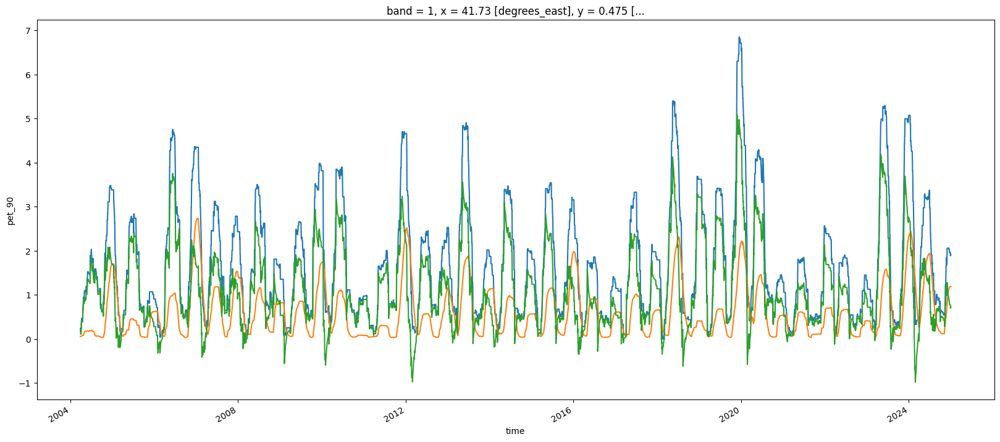

In [75]:
plt.figure(figsize=(20,8))
zone_1.precipitation_90.sel(y=0.46, x= 41.72, method='nearest').plot(label='p-et_3month')
zone_1.et_90.sel(y=0.46, x= 41.72, method='nearest').plot(label='p-et_3month')
zone_1.pet_90.sel(y=0.46, x= 41.72, method='nearest').plot(label='p-et_3month')

In [19]:
#TODO: ZONE 4
stats_dict_ = {}
start = time.time()

for span in [90, 180]:
    # Variables to standardize: P_minus_ET and soil_moisture at each span, plus tws (once)
    # f'pet_{span}' = 
    variables = [f'pet_{span}', f'sm_{span}']
    if span == 30:  # Standardize tws only once (using the shortest span as a reference)
        variables.append('tws_ds_30')
    
    for var in variables:
        print(f"Standardizing {var}...")
        mean = zone_1[var].groupby("time.month").mean('time')
        std = zone_1[var].groupby("time.month").std('time')
        mean_val = float(mean.compute())
        std_val = float(std.compute())
        std_val = max(std_val, 1e-6)
        stats_dict_[var] = {'mean': mean_val, 'std': std_val}
        print(f"Statistics for {var}: mean={mean_val:.4f}, std={std_val:.4f}")
        normalized_data = (zone_1[var] - mean_val) / std_val
        zone_1[f'{var}_standardized'] = normalized_data

end = time.time()
print(f"Completed standardization in {end - start:.2f} seconds")

Standardizing pet_90...



KeyboardInterrupt



In [115]:
print(zone_1[['pet_10', 'sm_10', 'tws_ds']])

<xarray.Dataset>
Dimensions:      (time: 7671, y: 671, x: 337)
Coordinates:
  * x            (x) float64 30.33 30.38 30.48 30.53 ... 51.18 51.28 51.33 51.38
  * y            (y) float64 23.12 23.07 23.02 22.97 ... -11.28 -11.33 -11.38
  * time         (time) datetime64[ns] 2004-01-01 2004-01-02 ... 2024-12-31
    band         int64 1
    spatial_ref  int64 0
    lat          (y) float64 dask.array<chunksize=(172,), meta=np.ndarray>
    lon          (x) float64 dask.array<chunksize=(44,), meta=np.ndarray>
Data variables:
    pet_10       (time, y, x) float64 dask.array<chunksize=(509, 172, 44), meta=np.ndarray>
    sm_10        (time, y, x) float64 dask.array<chunksize=(509, 172, 44), meta=np.ndarray>
    tws_ds       (time, y, x) float64 dask.array<chunksize=(500, 172, 44), meta=np.ndarray>


#### Remove mean over time and standardize

In [20]:
timescales = [30, 90, 180, 360]

stats_dict_ = {}
start = time.time()

variable_groups = {
    # 10: ['pet_10', 'sm_10', 'tws_ds'],
    30: ['pet_30', 'sm_30', 'tws_ds'],
    90: ['pet_90', 'sm_90', 'tws_ds'],
    180: ['pet_180', 'sm_180', 'tws_ds'],
    360: ['pet_360', 'sm_360', 'tws_ds']
}

# Ddictionary to store standardized datasets
ds_standardized = {}

# Standardizing tws once since I don't have SMA per time scale 
tws_mean = zone_1['tws_ds'].mean(dim='time', skipna=True)
tws_std = zone_1['tws_ds'].std(dim='time', skipna=True)
tws_standardized = (zone_1['tws_ds'] - tws_mean) / tws_std

# Save tws_ds statistics separately
ds_tws_stats = xr.Dataset({
    'tws_ds_mean': tws_mean,
    'tws_ds_std': tws_std
})
# ds_tws_stats.to_netcdf(os.path.join(dataset, 'results/stats_tws_ds.nc'))



end = time.time()
print(f"Completed standardization in {end - start:.2f} seconds")

Completed standardization in 0.04 seconds


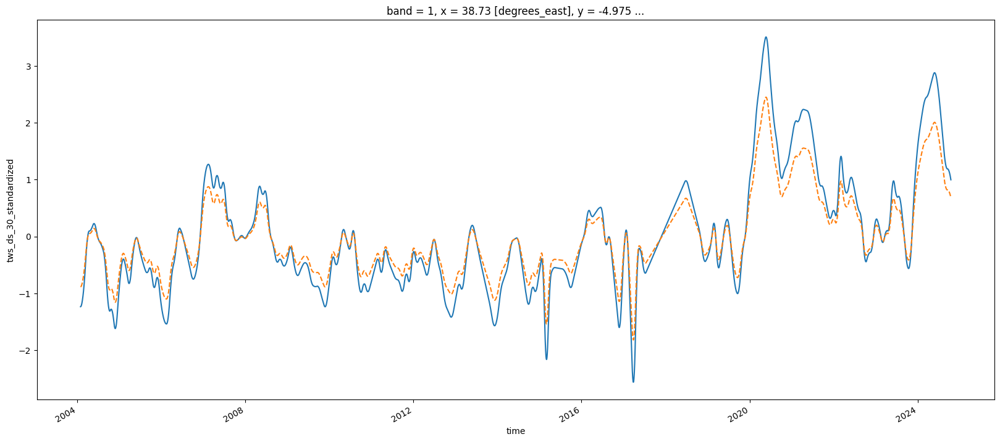

In [147]:
plt.figure(figsize=(20,8))
tws_standardized4.rolling.sel(y=-5, x= 38.72, method='nearest').plot(label='p-et_3month')
zone_4['tws_ds_30_standardized'].sel(y=-5, x= 38.72, method='nearest').plot(linestyle='--')

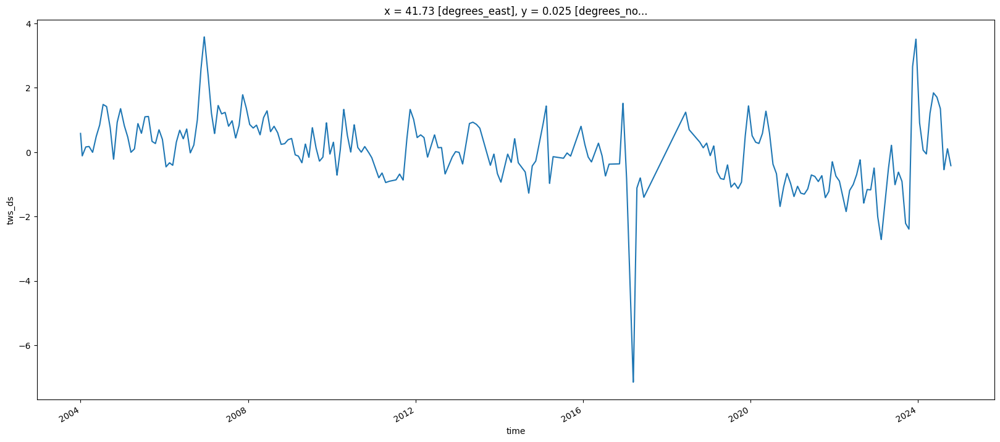

In [126]:
plt.figure(figsize=(20,8))
tws_standardized.sel(y=0, x= 41.72, method='nearest').plot(label='p-et_3month')

In [128]:
ds_tws_stats.tws_ds_mean.compute()

<xarray.DataArray 'tws_ds_mean' (y: 671, x: 337)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
  * x            (x) float64 30.33 30.38 30.48 30.53 ... 51.18 51.28 51.33 51.38
  * y            (y) float64 23.12 23.07 23.02 22.97 ... -11.28 -11.33 -11.38
    band         int64 1
    spatial_ref  int64 0
    lat          (y) float64 23.12 23.07 23.02 22.97 ... -11.28 -11.33 -11.38
    lon          (x) float64 30.33 30.38 30.48 30.53 ... 51.18 51.28 51.33 51.38

In [16]:
output_path = 'private/drought-index-thesis/datasets/results'

In [21]:
start = time.time()
# Loop through each timescale
for timescale in timescales:
    print(f"Processing timescale: {timescale} days")
    
    # Select variables for this each timescale
    vars_to_process = variable_groups[timescale]
    
    # Create a dataset for the timescale
    ds_ts = zone_1[vars_to_process].copy()
    
    # Dicts for means and standard deviations
    means = {}
    stds = {}
    
    # Standardize each variable
    for var in vars_to_process:
        if var == 'tws_ds':
            # Use the pre-standardized tws, aligned to this timescale's time dimension
            ds_ts[var] = tws_standardized
        else:
            # Compute mean and standard deviation over time
            mean_var = ds_ts[var].mean(dim='time', skipna=True)
            std_var = ds_ts[var].std(dim='time', skipna=True)
            
            # Standardize: (data - mean) / std
            ds_ts[var] = (ds_ts[var] - mean_var) / std_var
            
            # Store mean and standard deviation
            means[var] = mean_var
            stds[var] = std_var
    
    # Create a dataset for statistics (excluding tws_ds, saved separately)
    ds_stats = xr.Dataset({
        **{f'{var}_mean': means[var] for var in vars_to_process if var != 'tws_ds'},
        **{f'{var}_std': stds[var] for var in vars_to_process if var != 'tws_ds'}
    })
    
    # Save a NetCDF file
    stats_filename = f'stats_timescale_{timescale}_days.nc'
    # ds_stats.to_netcdf(stats_filename)
    
    # Store the standardized dataset
    ds_standardized[timescale] = ds_ts
    
    # Save the standardized dataset to a NetCDF file
    output_filename = f'standardized_timescale_{timescale}_days.nc'
    # ds_ts.to_netcdf(output_filename)

end = time.time()
print(f"Completed standardization in {end - start:.2f} seconds")

Processing timescale: 30 days
Processing timescale: 90 days
Processing timescale: 180 days
Processing timescale: 360 days
Completed standardization in 0.50 seconds


In [83]:
ds_ts_

<xarray.Dataset>
Dimensions:      (time: 7671, y: 671, x: 337)
Coordinates:
    band         int64 1
  * x            (x) float64 30.33 30.38 30.48 30.53 ... 51.18 51.28 51.33 51.38
  * y            (y) float64 23.12 23.07 23.02 22.97 ... -11.28 -11.33 -11.38
  * time         (time) datetime64[ns] 2004-01-01 2004-01-02 ... 2024-12-31
    spatial_ref  int64 0
    lat          (y) float64 dask.array<chunksize=(172,), meta=np.ndarray>
    lon          (x) float64 dask.array<chunksize=(44,), meta=np.ndarray>
Data variables:
    pet_360      (time, y, x) float64 dask.array<chunksize=(859, 172, 44), meta=np.ndarray>
    sm_360       (time, y, x) float64 dask.array<chunksize=(859, 172, 44), meta=np.ndarray>
    tws_ds       (time, y, x) float64 dask.array<chunksize=(500, 172, 44), meta=np.ndarray>

In [82]:
# Optional: Inspect the results for one timescale
print("Standardized Dataset for 30-day timescale:")
print(ds_standardized)
# print("\nStatistics Dataset for 30-day timescale:")
# print(xr.open_dataset(os.path.join(dataset,'results/stats_timescale_30_days.nc'))
# print("\nTWS Statistics:")
# print(xr.open_dataset(os.path.join(dataset,'results/stats_tws_ds.nc'))

# # Close all datasets to free memory
# ds.close()
# for ds_ts in ds_standardized.values():
#     ds_ts.close()
# ds_tws_stats.close()

Standardized Dataset for 30-day timescale:
{30: <xarray.Dataset>
Dimensions:      (time: 7671, y: 671, x: 337)
Coordinates:
    band         int64 1
  * x            (x) float64 30.33 30.38 30.48 30.53 ... 51.18 51.28 51.33 51.38
  * y            (y) float64 23.12 23.07 23.02 22.97 ... -11.28 -11.33 -11.38
  * time         (time) datetime64[ns] 2004-01-01 2004-01-02 ... 2024-12-31
    spatial_ref  int64 0
    lat          (y) float64 dask.array<chunksize=(172,), meta=np.ndarray>
    lon          (x) float64 dask.array<chunksize=(44,), meta=np.ndarray>
Data variables:
    pet_30       (time, y, x) float64 dask.array<chunksize=(529, 172, 44), meta=np.ndarray>
    sm_30        (time, y, x) float64 dask.array<chunksize=(529, 172, 44), meta=np.ndarray>
    tws_ds       (time, y, x) float64 dask.array<chunksize=(500, 172, 44), meta=np.ndarray>, 90: <xarray.Dataset>
Dimensions:      (time: 7671, y: 671, x: 337)
Coordinates:
    band         int64 1
  * x            (x) float64 30.33 30.38 30.

In [84]:
data_subset-p = {}
# for span in [90, 180, 360]:
variables = ['pet_90_standardized', 'tws_ds_30_standardized']
for var in variables:
    data_subset_p = zone_1[variables].resample(time='1M').mean()

SyntaxError: cannot assign to operator (3551284889.py, line 1)

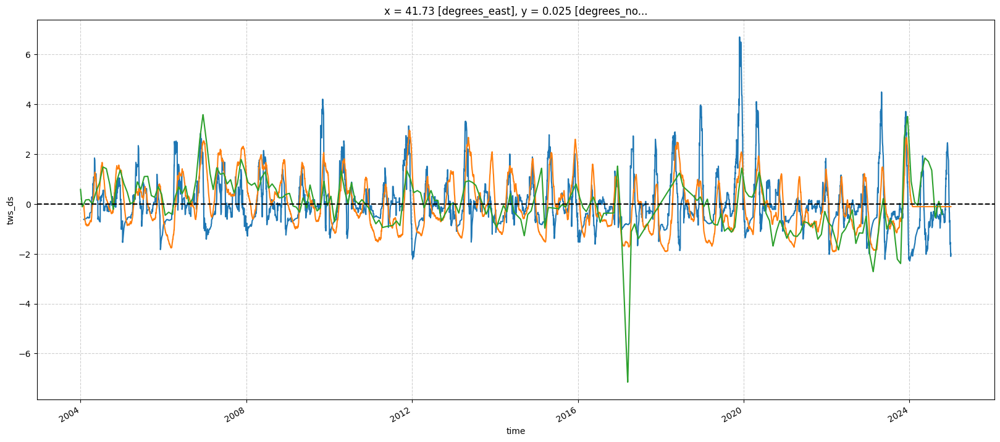

In [161]:
plt.figure(figsize=(20,8))
ds_standardized[30]['pet_30'].sel(y=0, x= 41.72, method='nearest').plot(label='p-et_3month')
ds_standardized[30]['sm_30'].sel(y=0, x= 41.72, method='nearest').plot(label='sm_3month')
ds_standardized[30]['tws_ds'].sel(y=0, x= 41.72, method='nearest').plot(label='tws_3month')
plt.axhline(0, color='k', linestyle='--')
plt.grid(True, which='both', linestyle='--', alpha=0.6)
plt.show()

/home/jovyan/.local/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/home/jovyan/.local/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/home/jovyan/.local/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)


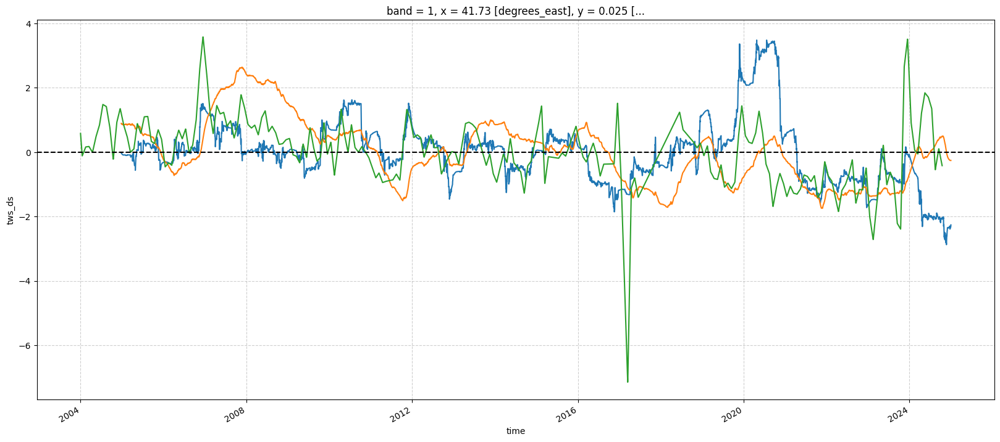

In [84]:
plt.figure(figsize=(20,8))
ds_standardized[360]['pet_360'].sel(y=0, x= 41.72, method='nearest').plot(label='p-et_3month')
ds_standardized[360]['sm_360'].sel(y=0, x= 41.72, method='nearest').plot(label='sm_3month')
ds_standardized[360]['tws_ds'].sel(y=0, x= 41.72, method='nearest').plot(label='tws_3month')
plt.axhline(0, color='k', linestyle='--')
plt.grid(True, which='both', linestyle='--', alpha=0.6)
plt.show()

In [171]:
zone_1_stacked = {}
for var in ['pet_180', 'sm_180', 'tws_ds']:
    zone_1_stacked[var] = ds_standardized[180][var].stack(points=('y', 'x'), create_index=False)

In [440]:
# Check dependence
tau_P_SM, _ = kendalltau(pet_clean, sm_clean)
tau_P_TWS, _ = kendalltau(pet_clean, tws_clean)
tau_SM_TWS, _ = kendalltau(sm_clean, tws_clean)
print(tau_P_SM, tau_P_TWS, tau_SM_TWS)

0.2898033515900245 0.30716396498804177 0.19557625309213753


In [172]:
pet_data = zone_1_stacked['pet_180'].values
sm_data = zone_1_stacked['sm_180'].values
tws_data = zone_1_stacked['tws_ds'].values

valid_mask = (~np.isnan(pet_data) & (~np.isnan(sm_data)) & (~np.isnan(tws_data)))

pet_clean = pet_data[valid_mask]
sm_clean = sm_data[valid_mask]
tws_clean = tws_data[valid_mask]

pet_ecdf = ECDF(pet_clean)
sm_ecdf = ECDF(sm_clean)
tws_ecdf = ECDF(tws_clean)

In [ ]:
data['P_minus_ET_quantile'] = pd.qcut(data['P_minus_ET_ema'], q=10, labels=False)
subset = data.groupby('P_minus_ET_quantile').apply(lambda x: x.sample(frac=0.1)).reset_index(drop=True)

In [173]:
# Full data (millions of points)
u = pet_ecdf(pet_clean)
v = sm_ecdf(sm_clean)
w = tws_ecdf(tws_clean)  # Uniform margins from ECDF


# Randomly sample 50,000 points without replacement
sample_size = 5000
np.random.seed(42)
indices = np.random.choice(len(u), size=sample_size, replace=False)
u_sub = u[indices]
v_sub = v[indices]
w_sub = w[indices]

In [174]:
copula_data = np.column_stack([u_sub, v_sub, w_sub])

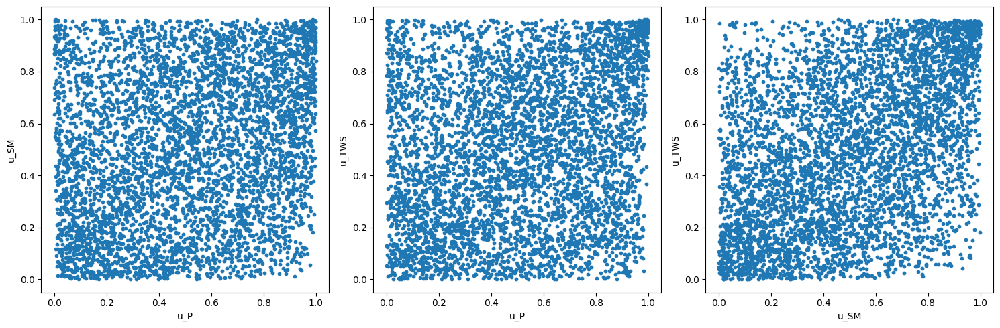

In [175]:
# Plot scatter plots of sampled data
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].scatter(copula_data[:,0], copula_data[:,1], s=10)
axes[0].set_xlabel('u_P')
axes[0].set_ylabel('u_SM')
axes[1].scatter(copula_data[:, 0], copula_data[:,2], s=10)
axes[1].set_xlabel('u_P')
axes[1].set_ylabel('u_TWS')
axes[2].scatter(copula_data[:,1], copula_data[:,2], s=10)
axes[2].set_xlabel('u_SM')
axes[2].set_ylabel('u_TWS')
plt.tight_layout()
plt.show()

In [176]:
#  Step 7: Fit Copulas
subregion_id = 1

# Define Copulas (assuming these are from a library like 'copulae')
copulas = {
    'Gaussian': GaussianCopula(dim=3),
    'Clayton': ClaytonCopula(dim=3),
    'Frank': FrankCopula(dim=3),
    'Gumbel': GumbelCopula(dim=3),
    # 'tCopula': StudentCopula(dim=3)
}

# Fit Copulas
results = {}
for name, copula in copulas.items():
    try:
        print(f'Fitting {name}...')
        start_time = time.time()
        copula.fit(copula_data)  # Assuming copula_data is defined elsewhere
        log_likelihood = copula.log_lik(copula_data)
        # Calculate AIC: -2 * log_likelihood + 2 * number_of_parameters
        num_params = copula.dim  # Adjust based on your copula library's parameter count
        aic = -2 * log_likelihood + 2 * num_params
        results[name] = {'copula': copula, 'log_likelihood': log_likelihood, 'AIC': aic}
        print(f"{name} Copula fitted for subregion {subregion_id}, log-likelihood: {log_likelihood:.2f}")
    except Exception as e:
        print(f"Failed to fit {name} Copula: {e}")

# Select best copula
if results:
    best_copula_name = max(results, key=lambda x: results[x]['log_likelihood'])  # Fixed key
    best_copula = results[best_copula_name]['copula']
    print(f"Best copula (by log_likelihood): {best_copula_name} (log_likelihood: {results[best_copula_name]['log_likelihood']:.2f})")
else:
    print("No copulas were successfully fitted to the data.")


# Total runtime
end_time = time.time()
print(f"Total runtime: {end_time - start_time:.2f} seconds.")

Fitting Gaussian...
Gaussian Copula fitted for subregion 1, log-likelihood: 692.82
Fitting Clayton...
Clayton Copula fitted for subregion 1, log-likelihood: 292.65
Fitting Frank...
Frank Copula fitted for subregion 1, log-likelihood: 510.60
Fitting Gumbel...
Gumbel Copula fitted for subregion 1, log-likelihood: 523.10
Best copula (by log_likelihood): Gaussian (log_likelihood: 692.82)
Total runtime: 0.17 seconds.


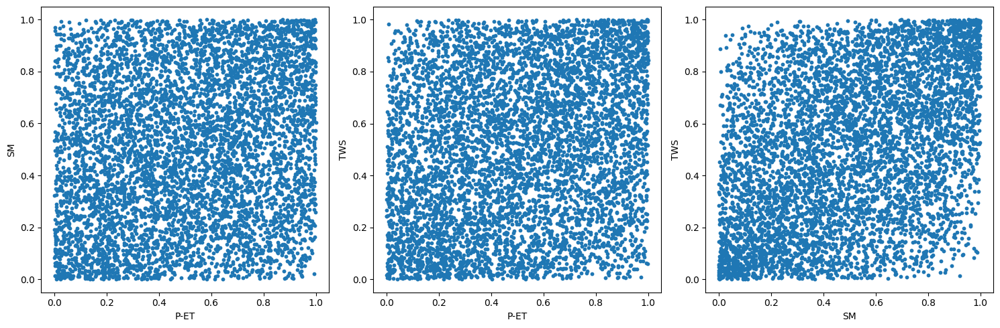

In [177]:
cop_sample = best_copula.random(6000)

# Plot scatter plots of sampled data
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].scatter(cop_sample[:,0], cop_sample[:,1], s=10)
axes[0].set_xlabel('P-ET')
axes[0].set_ylabel('SM')
axes[1].scatter(cop_sample[:, 0], cop_sample[:, 2], s=10)
axes[1].set_xlabel('P-ET')
axes[1].set_ylabel('TWS')
axes[2].scatter(cop_sample[:, 1], cop_sample[:, 2], s=10)
axes[2].set_xlabel('SM')
axes[2].set_ylabel('TWS')
plt.tight_layout()
plt.show()

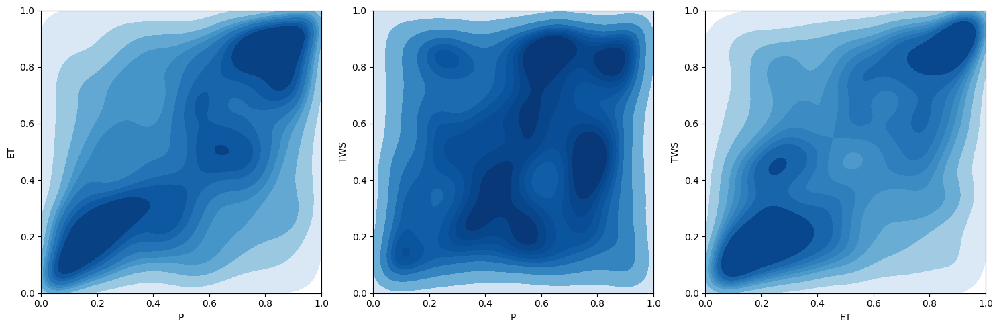

In [449]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

sns.kdeplot(x=cop_sample[:,0], y=cop_sample[:,1], cmap='Blues', fill=True, ax=axes[0])
# axes[0].scatter(cop_sample[:,0], cop_sample[:,1], s=10, alpha=0.3, color='gray')  # Optional: Add scatter points
axes[0].set_xlabel('P')
axes[0].set_ylabel('ET')
axes[0].set_xlim(0, 1)  # Uniform samples should be in [0,1]
axes[0].set_ylim(0, 1)

# Plot 2: P vs SM (assuming the third column is SM, not TWS, based on your project context)
sns.kdeplot(x=cop_sample[:,0], y=cop_sample[:,2], cmap='Blues', fill=True, ax=axes[1])
# axes[1].scatter(cop_sample[:,0], cop_sample[:,2], s=10, alpha=0.3, color='gray')
axes[1].set_xlabel('P')
axes[1].set_ylabel('TWS')  # Changed to SM (was TWS in your code)
axes[1].set_xlim(0, 1)
axes[1].set_ylim(0, 1)

# Plot 3: ET vs SM
sns.kdeplot(x=cop_sample[:,1], y=cop_sample[:,2], cmap='Blues', fill=True, ax=axes[2])
# axes[2].scatter(cop_sample[:,1], cop_sample[:,2], s=10, alpha=0.3, color='gray')
axes[2].set_xlabel('ET')
axes[2].set_ylabel('TWS')  # Changed to SM
axes[2].set_xlim(0, 1)
axes[2].set_ylim(0, 1)

# Adjust layout and display
plt.tight_layout()
plt.show()

In [41]:
# Load and subsample dataset
ds = ds_standardized[90]
y_subset = ds['y'].values[::10]
x_subset = ds['x'].values[::10]
ds = ds.sel(y=y_subset, x=x_subset)

# Subsample time (every 28th day)
time_subset = ds['time'].values[::28]
ds = ds.sel(time=time_subset)

In [42]:
print(ds)

<xarray.Dataset>
Dimensions:      (time: 274, y: 68, x: 34)
Coordinates:
    band         int64 1
  * x            (x) float64 30.33 31.08 35.48 35.98 ... 49.48 50.03 50.53 51.03
  * y            (y) float64 23.12 22.62 22.12 21.62 ... -10.38 -10.88 -11.38
  * time         (time) datetime64[ns] 2004-01-01 2004-01-29 ... 2024-12-05
    spatial_ref  int64 0
    lat          (y) float64 dask.array<chunksize=(18,), meta=np.ndarray>
    lon          (x) float64 dask.array<chunksize=(5,), meta=np.ndarray>
Data variables:
    pet_90       (time, y, x) float64 dask.array<chunksize=(22, 18, 5), meta=np.ndarray>
    sm_90        (time, y, x) float64 dask.array<chunksize=(22, 18, 5), meta=np.ndarray>
    tws_ds       (time, y, x) float64 dask.array<chunksize=(18, 18, 5), meta=np.ndarray>


/home/jovyan/.local/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)


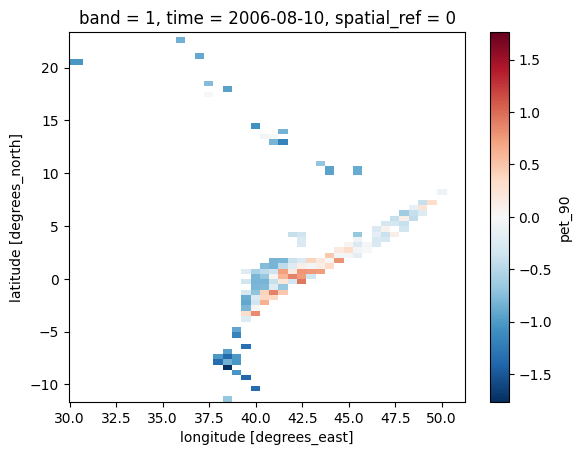

In [44]:
ds.pet_90.isel(time=34).plot()

In [47]:
start_time = time.time()

timescale = 90

# Load the standardized dataset with chunks for efficient processing
# ds = ds_standardized[90]

# Define the variables to work with
variables = [f'pet_{timescale}', f'sm_{timescale}', 'tws_ds']

# Select the training period (e.g., 2004 to 2017)
ds_train = ds.sel(time=slice('2004-01-01', '2017-12-31'))

# Function to compute ECDF transformation per grid point
def ecdf_transform(data):
    valid_data = data[~np.isnan(data)]
    if len(valid_data) == 0:
        return np.full_like(data, np.nan)
    ecdf = ECDF(valid_data)
    transformed = ecdf(data)
    transformed[np.isnan(data)] = np.nan
    return transformed

# Rechunk to have the entire 'time' dimension in one chunk
ds_train = ds_train.chunk({'time': -1})

# Apply ECDF transformation to each variable per grid point
uniform_ds = xr.Dataset()
for var in variables:
    uniform_data = xr.apply_ufunc(
        ecdf_transform,
        ds_train[var],
        input_core_dims=[['time']],
        output_core_dims=[['time']],
        vectorize=True,
        dask='parallelized',
        output_dtypes=[float]
    )
    uniform_ds[var] = uniform_data

# # Stack the uniform data across time, y, x dimensions
# stacked_data = uniform_ds.to_array(dim='variable').transpose('time', 'y', 'x', 'variable').stack(sample=('time', 'y', 'x'))

# # Convert to Dask array
# dask_array = stacked_data.data

# # Create a Dask DataFrame for easier manipulation
# df = dd.from_dask_array(dask_array, columns=variables)

# # Remove rows with any NaN values
# df = df.dropna()

# Total runtime
end_time = time.time()
print(f"Total runtime: {end_time - start_time:.2f} seconds.")

Total runtime: 0.06 seconds.


In [45]:
# Check NaN prevalence
print("NaN percentages:", uniform_ds[variables].isnull().mean().compute())

/home/jovyan/.local/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)


NaN percentages: <xarray.Dataset>
Dimensions:      ()
Coordinates:
    band         int64 1
    spatial_ref  int64 0
Data variables:
    pet_90       float64 0.9471
    sm_90        float64 0.9592
    tws_ds       float64 0.9718


In [49]:
# Stack each variable separately along time, y, x
stacked_pet = uniform_ds['pet_90'].stack(sample=('time', 'y', 'x'))
stacked_sm = uniform_ds['sm_90'].stack(sample=('time', 'y', 'x'))
stacked_tws = uniform_ds['tws_ds'].stack(sample=('time', 'y', 'x'))

# Combine into a Dask array with shape (n_samples, 3)
dask_array = da.stack([stacked_pet.data, stacked_sm.data, stacked_tws.data], axis=1)

# Create a Dask DataFrame with 3 columns
df = dd.from_dask_array(dask_array, columns=variables)

# Remove rows with any NaN values
df = df.dropna()

In [50]:
len(stacked_pet)

423096

In [52]:
# Sample a subset of the data (e.g., 10,000 rows) to manage memory
n_samples = 5000
n_rows = df.shape[0].compute()
if n_rows > n_samples:
    df_sample = df.sample(frac=n_samples / n_rows)
else:
    df_sample = df

# Compute the sample to get a Pandas DataFrame
df_sample = df_sample.compute()

/home/jovyan/.local/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)


In [53]:
uniform_sample = df_sample.to_numpy()

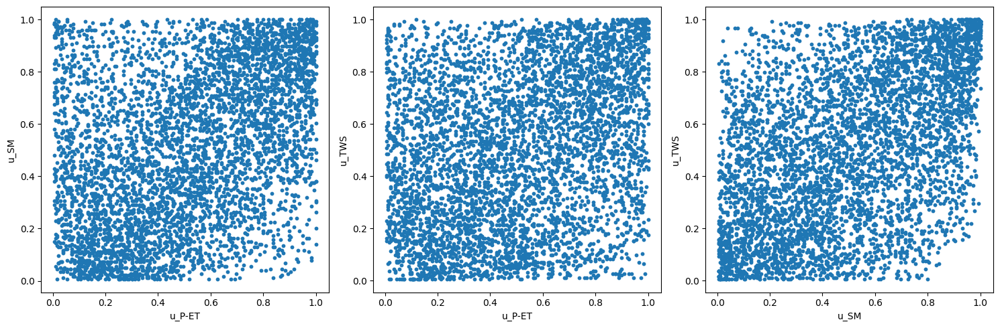

In [54]:
# Plot scatter plots of sampled data
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].scatter(uniform_sample[:,0], uniform_sample[:,1], s=10)
axes[0].set_xlabel('u_P-ET')
axes[0].set_ylabel('u_SM')
axes[1].scatter(uniform_sample[:, 0], uniform_sample[:, 2], s=10)
axes[1].set_xlabel('u_P-ET')
axes[1].set_ylabel('u_TWS')
axes[2].scatter(uniform_sample[:, 1], uniform_sample[:, 2], s=10)
axes[2].set_xlabel('u_SM')
axes[2].set_ylabel('u_TWS')
plt.tight_layout()
plt.show()

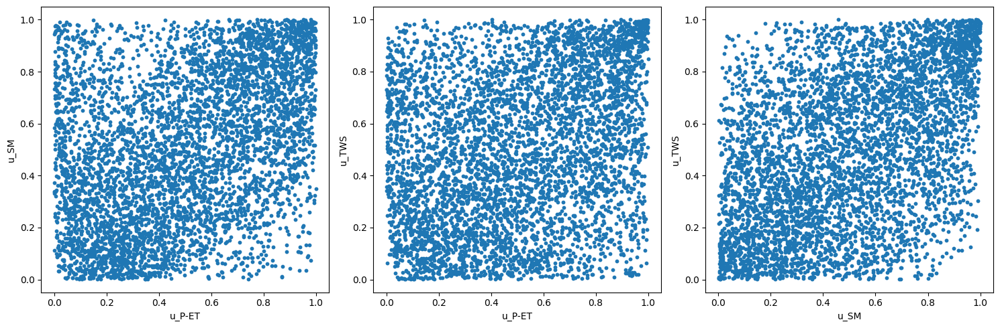

In [90]:
# Plot scatter plots of sampled data
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].scatter(uniform_sample[:,0], uniform_sample[:,1], s=10)
axes[0].set_xlabel('u_P-ET')
axes[0].set_ylabel('u_SM')
axes[1].scatter(uniform_sample[:, 0], uniform_sample[:, 2], s=10)
axes[1].set_xlabel('u_P-ET')
axes[1].set_ylabel('u_TWS')
axes[2].scatter(uniform_sample[:, 1], uniform_sample[:, 2], s=10)
axes[2].set_xlabel('u_SM')
axes[2].set_ylabel('u_TWS')
plt.tight_layout()
plt.show()

In [57]:
subregion_id = 1

copulas = {
    'Gaussian': GaussianCopula(dim=3),
    'Clayton': ClaytonCopula(dim=3),
    'Frank': FrankCopula(dim=3),
    'Gumbel': GumbelCopula(dim=3),
    # 'tCopula': StudentCopula(dim=3)
}


# Fit Copulas
results = {}
for name, copula in copulas.items():
    try:
        print(f'Fitting {name}...')
        start_time = time.time()
        copula.fit(uniform_sample)  #
        log_likelihood = copula.log_lik(uniform_sample)
        # Calculate AIC:
        if name == 't-Copula':
            num_params = copula.params[1].size
        elif name == 'Clayton' or name == 'Gumbel' or name == 'Frank':
            num_params = np.array(copula.params).size
        elif name == 'Gaussian':
            num_params = copula.params.size
        # num_params = copula.dim 
        aic = -2 * log_likelihood + 2 * num_params
        results[name] = {'copula': copula, 'log_likelihood': log_likelihood, 'AIC': aic}
        print(f"{name} Copula fitted for subregion {subregion_id}, log-likelihood: {log_likelihood:.2f}")
    except Exception as e:
        print(f"Failed to fit {name} Copula: {e}")

# Select best copula
if results:
    best_copula_name = min(results, key=lambda x: results[x]['AIC'])  # Fixed key
    best_copula = results[best_copula_name]['copula']
    print(f"Best copula (by log_likelihood): {best_copula_name} ('AIC: {results[best_copula_name]['AIC']:.2f}, 'log_likelihood: {results[best_copula_name]['log_likelihood']:.2f})")
else:
    print("No copulas were successfully fitted to the data.")
          
# Save the best copula
with open(f'../../../datasets/results/fitted_copula_subregion_{subregion_id}_timescale_{timescale}.pkl', 'wb') as f:
    pickle.dump(best_copula, f)


# Total runtime
end_time = time.time()
print(f"Total runtime: {end_time - start_time:.2f} seconds.")

Fitting Gaussian...
Gaussian Copula fitted for subregion 1, log-likelihood: 1116.53
Fitting Clayton...
Clayton Copula fitted for subregion 1, log-likelihood: 525.49
Fitting Frank...
Frank Copula fitted for subregion 1, log-likelihood: 939.52
Fitting Gumbel...
Gumbel Copula fitted for subregion 1, log-likelihood: 921.44
Best copula (by log_likelihood): Gaussian ('AIC: -2227.06, 'log_likelihood: 1116.53)
Total runtime: 0.20 seconds.


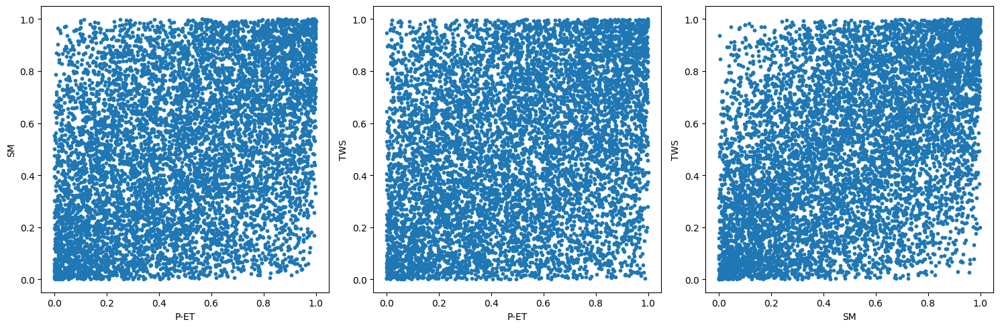

In [121]:
cop_samples = best_copula.random(8000)

# Plot scatter plots of sampled data
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].scatter(cop_samples[:,0], cop_samples[:,1], s=10)
axes[0].set_xlabel('P-ET')
axes[0].set_ylabel('SM')
axes[1].scatter(cop_samples[:, 0], cop_samples[:, 2], s=10)
axes[1].set_xlabel('P-ET')
axes[1].set_ylabel('TWS')
axes[2].scatter(cop_samples[:, 1], cop_samples[:, 2], s=10)
axes[2].set_xlabel('SM')
axes[2].set_ylabel('TWS')
plt.tight_layout()
plt.show()

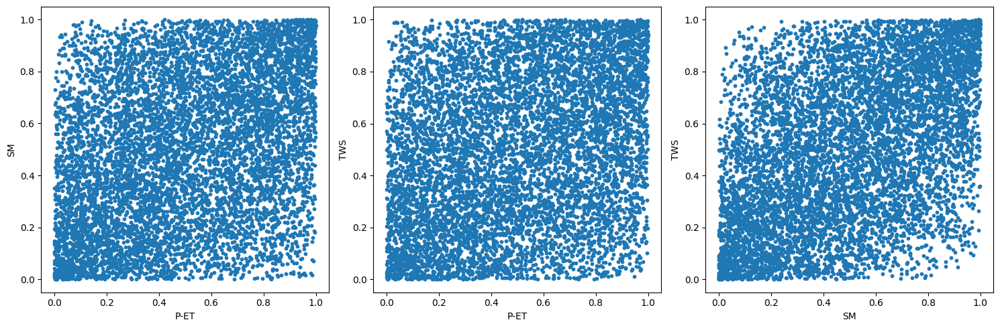

In [58]:
cop_samples = best_copula.random(8000)

# Plot scatter plots of sampled data
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].scatter(cop_samples[:,0], cop_samples[:,1], s=10)
axes[0].set_xlabel('P-ET')
axes[0].set_ylabel('SM')
axes[1].scatter(cop_samples[:, 0], cop_samples[:, 2], s=10)
axes[1].set_xlabel('P-ET')
axes[1].set_ylabel('TWS')
axes[2].scatter(cop_samples[:, 1], cop_samples[:, 2], s=10)
axes[2].set_xlabel('SM')
axes[2].set_ylabel('TWS')
plt.tight_layout()
plt.show()

In [51]:
uniform_ds

<xarray.Dataset>
Dimensions:      (x: 34, y: 68, time: 183)
Coordinates:
    band         int64 1
  * x            (x) float64 30.33 31.08 35.48 35.98 ... 49.48 50.03 50.53 51.03
  * y            (y) float64 23.12 22.62 22.12 21.62 ... -10.38 -10.88 -11.38
  * time         (time) datetime64[ns] 2004-01-01 2004-01-29 ... 2017-12-14
    spatial_ref  int64 0
    lat          (y) float64 dask.array<chunksize=(18,), meta=np.ndarray>
    lon          (x) float64 dask.array<chunksize=(5,), meta=np.ndarray>
Data variables:
    pet_90       (y, x, time) float64 dask.array<chunksize=(18, 5, 183), meta=np.ndarray>
    sm_90        (y, x, time) float64 dask.array<chunksize=(18, 5, 183), meta=np.ndarray>
    tws_ds       (y, x, time) float64 dask.array<chunksize=(18, 5, 183), meta=np.ndarray>

In [112]:
# Compute joint probabilities for training period
stacked_uniform = uniform_ds.to_array(dim='variable').stack(sample=('time', 'y', 'x')).transpose('sample', 'variable')
df_uniform = pd.DataFrame(stacked_uniform.compute(), columns=variables)
df_uniform = df_uniform.dropna()

/home/jovyan/.local/lib/python3.8/site-packages/xarray/core/variable.py:1730: PerformanceWarning: Reshaping is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array.reshape(shape)

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array.reshape(shape)Explictly passing ``limit`` to ``reshape`` will also silence this warning
    >>> array.reshape(shape, limit='128 MiB')
  result = result._stack_once(dims, new_dim)
/home/jovyan/.local/lib/python3.8/site-packages/xarray/core/variable.py:1730: PerformanceWarning: Reshaping is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array.reshape(shape)

To avoid creating the large chunks, set the opti

In [113]:
df_uniform

,pet_90,sm_90,tws_ds
20140468,0.797413,0.349055,0.525420
20140469,0.796418,0.395224,0.524443
20140470,0.795423,0.431443,0.524443
20140471,0.795821,0.455124,0.523856
20140805,0.797015,0.323980,0.514666
...,...,...,...
1156399076,0.884577,0.410149,0.723113
1156399077,0.929154,0.402786,0.727415
1156399414,0.945075,0.394030,0.723504
1156402110,0.951244,0.255323,0.694759


In [115]:
# Create the joint probability of drought
joint_probs = best_copula.cdf(df_uniform)

# Create Xarray DataArray for joint probabilities
joint_probs_da = xr.DataArray(
    joint_probs,
    dims=['sample'],
    coords={'sample': stacked_uniform['sample']}
).unstack('sample')

# Derive drought index
drought_index = norm.ppf(joint_probs_da)
# drought_index.to_netcdf(f'../../../datasets/results/drought_index_subregion_{subregion_id}_timescale_{timescale}.nc')

ValueError: conflicting sizes for dimension 'sample': length 31838338 on the data but length 1156413478 on coordinate 'sample'

In [13]:
# Load best copula
copula_file = f'../../../datasets/results/fitted_copula_subregion_1_timescale_90.pkl'
with open(copula_file, 'rb') as f:
    best_copula = pickle.load(f)
print(best_copula)

In [ ]:
# Compute joint probabilities in batches
start_time = time.time()
stacked_uniform = uniform_ds.to_array(dim='variable').stack(sample=('time', 'y', 'x')).transpose('sample', 'variable')
n_samples = len(stacked_uniform['sample'])
batch_size = 1000
joint_probs = []
valid_multi_indices = []

# Process in batches and track valid indices
for i in range(0, n_samples, batch_size):
    print(f"Processing batch {i//batch_size + 1}/{n_samples//batch_size + 1}")
    batch = stacked_uniform[i:i+batch_size]
    df_batch = pd.DataFrame(batch.compute(), columns=variables)
    valid_rows = df_batch.dropna().index
    if not valid_rows.empty:
        df_valid = df_batch.loc[valid_rows]
        probs = best_copula.cdf(df_valid)
        joint_probs.append(probs)
        # Store the sample indices for valid rows
        batch_indices = batch['sample'].values[valid_rows]
        valid_multi_indices.append(batch_indices)

if joint_probs:
    joint_probs = np.concatenate(joint_probs)
    valid_multi_indices = pd.concat(valid_multi_indices) if isinstance(valid_multi_indices[0], pd.Series) else pd.MultiIndex.from_tuples(np.concatenate(valid_multi_indices))
else:
    print("No valid samples after NaN removal.")
    ds.close()
    uniform_ds.close()
    exit()

# Total runtime
end_time = time.time()
print(f"Total runtime: {end_time - start_time:.2f} seconds.")

Processing batch 1/424
Processing batch 2/424
Processing batch 3/424
Processing batch 4/424
Processing batch 5/424
Processing batch 6/424
Processing batch 7/424
Processing batch 8/424
Processing batch 9/424
Processing batch 10/424
Processing batch 11/424
Processing batch 12/424
Processing batch 13/424
Processing batch 14/424
Processing batch 15/424
Processing batch 16/424
Processing batch 17/424
Processing batch 18/424
Processing batch 19/424
Processing batch 20/424
Processing batch 21/424
Processing batch 22/424
Processing batch 23/424
Processing batch 24/424
Processing batch 25/424
Processing batch 26/424
Processing batch 27/424
Processing batch 28/424
Processing batch 29/424
Processing batch 30/424
Processing batch 31/424
Processing batch 32/424
Processing batch 33/424
Processing batch 34/424
Processing batch 35/424
Processing batch 36/424
Processing batch 37/424
Processing batch 38/424
Processing batch 39/424
Processing batch 40/424
Processing batch 41/424
Processing batch 42/424
P

In [ ]:
if joint_probs:
    joint_probs = np.concatenate(joint_probs)
    valid_multi_indices = pd.concat(valid_multi_indices) if isinstance(valid_multi_indices[0], pd.Series) else pd.MultiIndex.from_tuples(np.concatenate(valid_multi_indices))
else:
    print("No valid samples after NaN removal.")

In [30]:
# Create Xarray DataArray with valid indices
start_time = time.time()
joint_probs_da = xr.DataArray(
    joint_probs,
    dims=['sample'],
    coords={'sample': valid_indices}
).unstack('sample')

# Derive drought index
drought_index = norm.ppf(joint_probs_da)

end_time = time.time()
print(f"Total runtime: {end_time - start_time:.2f} seconds.")

ValueError: cannot unstack dimensions that do not have exactly one multi-index: ('sample',)

In [ ]:

drought_index.to_netcdf(
    f'../../../datasets/results/drought_index_subregion_{subregion_id}_timescale_{timescale}.nc',
    encoding={'drought_index': {'zlib': True, 'complevel': 5}}
)

In [31]:
print('f')

f


#### Fit best copula to Test period

In [ ]:
# Validation: Test period (2017–2024)
ds_test = subregion_ds.sel(time=slice('2018-01-01', '2024-12-31')).chunk({'time': -1})
uniform_test = xr.Dataset()
for var in variables:
    uniform_data = xr.apply_ufunc(
        ecdf_transform,
        ds_test[var],
        input_core_dims=[['time']],
        output_core_dims=[['time']],
        vectorize=True,
        dask='parallelized',
        output_dtypes=[float]
    )
    uniform_test[var] = uniform_data

stacked_uniform_test = uniform_test.to_array(dim='variable').stack(sample=('time', 'y', 'x')).transpose('sample', 'variable')
df_uniform_test = pd.DataFrame(stacked_uniform_test.compute(), columns=variables)
df_uniform_test = df_uniform_test.dropna()

joint_probs_test = best_copula.cdf(df_uniform_test)
joint_probs_test_da = xr.DataArray(
    joint_probs_test,
    dims=['sample'],
    coords={'sample': stacked_uniform_test['sample']}
).unstack('sample')

drought_index_test = norm.ppf(joint_probs_test_da)

drought_index_test.to_netcdf(f'../../../datasets/results/drought_index_subregion_{subregion_id}_timescale_{timescale}_test.nc')



#### Visualisation

In [ ]:
# Visualization: Time series for a grid point
grid_point = (subregion_ds['y'].values[0], subregion_ds['x'].values[0])
time_series = drought_index.sel(y=grid_point[0], x=grid_point[1])
plt.figure(figsize=(10, 5))
time_series.plot()
plt.title(f'Drought Index Time Series (Subregion {subregion_id}, Timescale {timescale} days, Grid Point {grid_point})')
plt.xlabel('Time')
plt.ylabel('Drought Index')
# plt.savefig(f'../../../datasets/results/time_series_subregion_{subregion_id}_timescale_{timescale}.png')
plt.close()

In [ ]:
# Visualization: Spatial map for 2011
time_slice = '2011-06-01'
map_data = drought_index.sel(time=time_slice, method='nearest')
plt.figure(figsize=(8, 6))
map_data.plot(cmap='RdBu', vmin=-3, vmax=3)
plt.title(f'Drought Index Map (Subregion {subregion_id}, Timescale {timescale} days, {time_slice})')
# plt.savefig(f'../../../datasets/results/map_subregion_{subregion_id}_timescale_{timescale}_2011.png')
plt.close()

# Total runtime
end_time = time.time()
print(f"Total runtime: {end_time - start_time:.2f} seconds.")

In [ ]:
# Close datasets
ds.close()
subregion_ds.close()
uniform_ds.close()
ds_test.close()
uniform_test.close()

#### Testing for Zone 4 `with Chunking`

In [16]:
# agregate to montly means
timescales_var_month = {}
for timescale in [30, 90, 180, 360]:
    print(f"Applying SMA with span {timescale}...")
    variables = ['precipitation', 'et', 'sm']
    if timescale == 30:
            variables.append('tws_ds')
    for var in variables:
        print(f'Applying SMA to {var} with span {timescale}...')
        zone_4[var + f'_{timescale}'] = compute_sma(zone_4[var], timescale)

Applying SMA with span 30...
Applying SMA to precipitation with span 30...
Applying SMA to et with span 30...
Applying SMA to sm with span 30...
Applying SMA to tws_ds with span 30...
Applying SMA with span 90...
Applying SMA to precipitation with span 90...
Applying SMA to et with span 90...
Applying SMA to sm with span 90...
Applying SMA with span 180...
Applying SMA to precipitation with span 180...
Applying SMA to et with span 180...
Applying SMA to sm with span 180...
Applying SMA with span 360...
Applying SMA to precipitation with span 360...
Applying SMA to et with span 360...
Applying SMA to sm with span 360...


In [ ]:
# agregate to montly means
timescales_var_month = {}
for timescale in [30, 90, 180, 360]:
    print(f"Applying SMA with span {timescale}...")
    variables = ['precipitation', 'et', 'sm']
    if timescale == 30:
            variables.append('tws_ds')
    for var in variables:
        print(f'Applying SMA to {var} with span {timescale}...')
        zone_4[var + f'_{timescale}'] = compute_sma(zone_4[var], timescale)

In [29]:
print(zone_4)

<xarray.Dataset>
Dimensions:            (time: 7671, y: 692, x: 589)
Coordinates:
    band               int64 1
  * x                  (x) float64 21.88 21.98 22.03 22.08 ... 51.23 51.28 51.33
  * y                  (y) float64 22.92 22.87 22.82 ... -11.58 -11.63 -11.68
  * time               (time) datetime64[ns] 2004-01-01 ... 2024-12-31
    spatial_ref        int64 0
    lat                (y) float64 dask.array<chunksize=(171,), meta=np.ndarray>
    lon                (x) float64 dask.array<chunksize=(147,), meta=np.ndarray>
Data variables: (12/19)
    precipitation      (time, y, x) float32 dask.array<chunksize=(500, 171, 147), meta=np.ndarray>
    et                 (time, y, x) float64 dask.array<chunksize=(500, 171, 147), meta=np.ndarray>
    sm                 (time, y, x) float64 dask.array<chunksize=(500, 171, 147), meta=np.ndarray>
    tws                (time, y, x) float64 dask.array<chunksize=(500, 171, 147), meta=np.ndarray>
    landform           (y, x) float64 dask.a

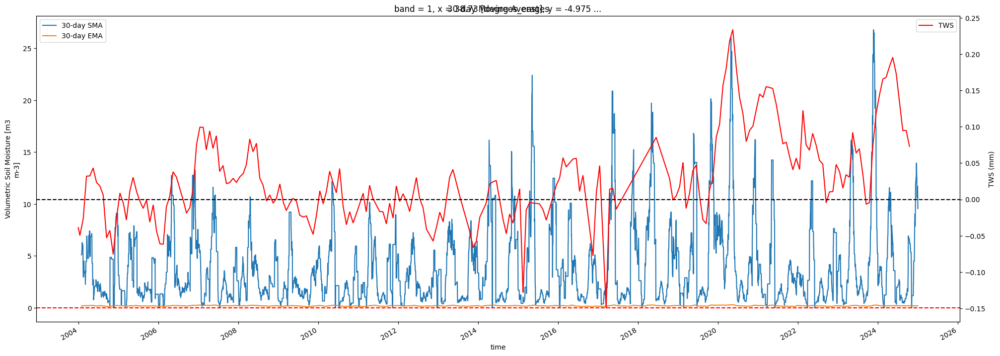

In [19]:
# Plot the time series

plt.figure(figsize=(24,8))
ax1 = plt.gca() 
zone_4['precipitation_30'].sel(y=-5, x= 38.72, method='nearest').plot(ax=ax1, label='30-day SMA')
zone_4['sm_30'].sel(y=-5, x= 38.72, method='nearest').plot(ax=ax1, label='30-day EMA')
ax1.legend(loc='upper left')
ax1.axhline(0, color='red', linestyle='--')
ax1.xaxis.set_major_locator(mdates.YearLocator(base=2))  # Ticks every 2 years
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# Create the second axis for tws
ax2 = ax1.twinx()
zone_4['tws_ds'].sel(y=-5, x= 38.72, method='nearest').plot(ax=ax2, label='TWS', color='red')

# Customize the second axis
ax2.set_ylabel('TWS (mm)')  # Replace 'unit' with the actual unit of tws
ax2.legend(loc='upper right')

plt.title('30-day Moving Averages')
ax2.axhline(0, color='k', linestyle='--')
plt.show()

In [ ]:
# Plot the time series
plt.figure(figsize=(24,8))
ax1 = plt.gca() 
zone_4['precipitation_90'].plot(ax=ax1, label='30-day SMA')
zone_4['sm_90'].plot(ax=ax1, label='30-day EMA')
ax1.legend(loc='upper left')
ax1.axhline(0, color='red', linestyle='--')

# Create the second axis for tws
ax2 = ax1.twinx()
zone_4['tws_ds'].plot(ax=ax2, label='TWS', color='red')

# Customize the second axis
ax2.set_ylabel('TWS (mm)')  # Replace 'unit' with the actual unit of tws
ax2.legend(loc='upper right')

plt.title('30-day Moving Averages')
ax2.axhline(0, color='k', linestyle='--')
plt.show()

In [527]:
    for timescale in [1, 3, 6]:
        timescales_var_month[f'p_et_{timescale}'] = timescales_var_month[f'precipitation_{timescale}'] - timescales_var_month[f'et_{timescale}']

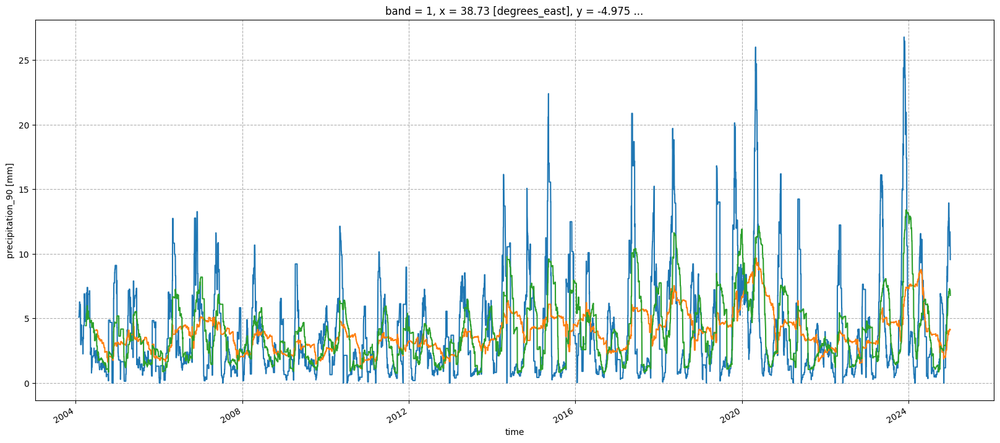

In [554]:

plt.figure(figsize=(20,8))
zone_4['precipitation_30'].sel(y=-5, x= 38.72, method='nearest').plot()
zone_4['precipitation_180'].sel(y=-5, x= 38.72, method='nearest').plot()
zone_4['precipitation_90'].sel(y=-5, x= 38.72, method='nearest').plot()
# timescales_var_month['tws_3'].sel(y=-5, x= 38.72, method='nearest').plot()
# plt.axhline(0, color='k', linestyle='--')
plt.grid(True, which='both', linestyle='--', alpha=1)

# # Set x-axis to show years at 2-year intervals
# plt.set_major_locator(mdates.YearLocator(base=2))  # Ticks every 2 years
# plt.set_major_formatter(mdates.DateFormatter('%Y'))

In [20]:
#TODO: ZONE 4
stats_dict = stats_dict if 'stats_dict' in globals() else {}
start = time.time()

for span in [30, 90, 180, 360]:
    # Variables to standardize: P_minus_ET and soil_moisture at each span, plus tws (once)
    variables = [f'precipitation_{span}', f'sm_{span}']
    if span == 30:  # Standardize tws only once (using the shortest span as a reference)
        variables.append('tws_ds_30')
    
    for var in variables:
        print(f"Standardizing {var}...")
        mean = zone_4[var].mean()
        std = zone_4[var].std()
        mean_val = float(mean.compute())
        std_val = float(std.compute())
        std_val = max(std_val, 1e-6)
        stats_dict[var] = {'mean': mean_val, 'std': std_val}
        print(f"Statistics for {var}: mean={mean_val:.4f}, std={std_val:.4f}")
        normalized_data = (zone_4[var] - mean_val) / std_val
        zone_4[f'{var}_standardized'] = normalized_data

end = time.time()
print(f"Completed standardization in {end - start:.2f} seconds")

Standardizing precipitation_30...
Statistics for precipitation_30: mean=1.6323, std=2.6609
Standardizing sm_30...
Statistics for sm_30: mean=0.1617, std=0.0735
Standardizing tws_ds_30...
Statistics for tws_ds_30: mean=0.0281, std=0.0815
Standardizing precipitation_90...
Statistics for precipitation_90: mean=1.6324, std=2.2501
Standardizing sm_90...
Statistics for sm_90: mean=0.1617, std=0.0692
Standardizing precipitation_180...
Statistics for precipitation_180: mean=1.6311, std=1.8394
Standardizing sm_180...
Statistics for sm_180: mean=0.1617, std=0.0635
Standardizing precipitation_360...
Statistics for precipitation_360: mean=1.6309, std=1.4366
Standardizing sm_360...
Statistics for sm_360: mean=0.1617, std=0.0581
Completed standardization in 1658.93 seconds


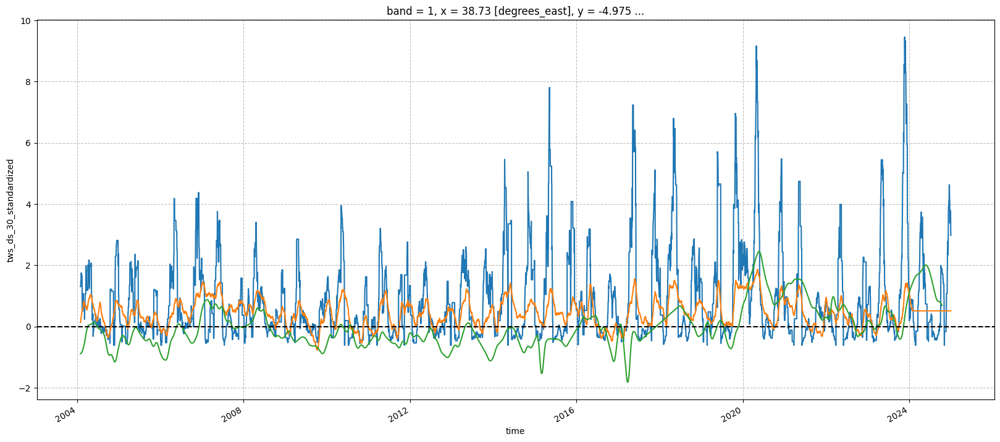

In [22]:
plt.figure(figsize=(20,8))
zone_4['precipitation_30_standardized'].sel(y=-5, x= 38.72, method='nearest').plot()
# nd.sel(y=-5, x= 38.72, method='nearest').plot()
zone_4['sm_30_standardized'].sel(y=-5, x= 38.72, method='nearest').plot()
zone_4['tws_ds_30_standardized'].sel(y=-5, x= 38.72, method='nearest').plot()
plt.axhline(0, color='k', linestyle='--')
plt.grid(True, which='both', linestyle='--', alpha=0.8)

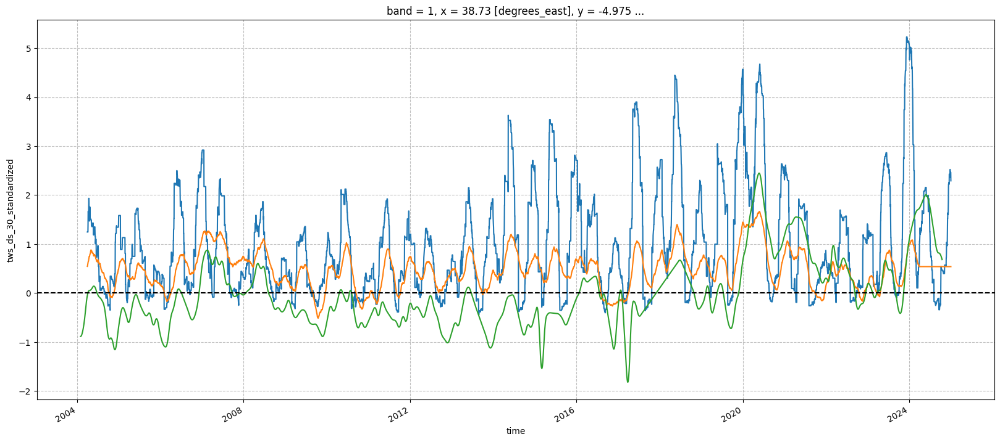

In [23]:
plt.figure(figsize=(20,8))
zone_4['precipitation_90_standardized'].sel(y=-5, x= 38.72, method='nearest').plot()
zone_4['sm_90_standardized'].sel(y=-5, x= 38.72, method='nearest').plot()
zone_4['tws_ds_30_standardized'].sel(y=-5, x= 38.72, method='nearest').plot()
plt.axhline(0, color='k', linestyle='--')
plt.grid(True, which='both', linestyle='--', alpha=0.8)

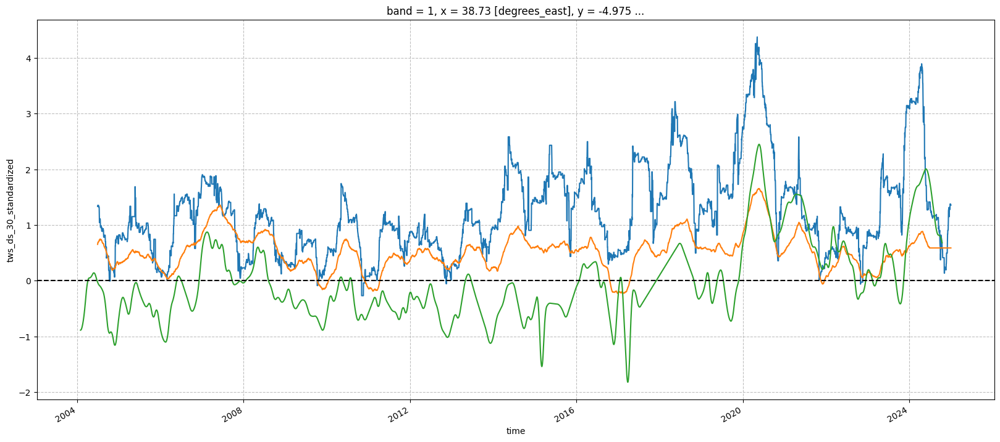

In [24]:
plt.figure(figsize=(20,8))
zone_4['precipitation_180_standardized'].sel(y=-5, x= 38.72, method='nearest').plot()
zone_4['sm_180_standardized'].sel(y=-5, x= 38.72, method='nearest').plot()
zone_4['tws_ds_30_standardized'].sel(y=-5, x= 38.72, method='nearest').plot()
plt.axhline(0, color='k', linestyle='--')
plt.grid(True, which='both', linestyle='--', alpha=0.8)

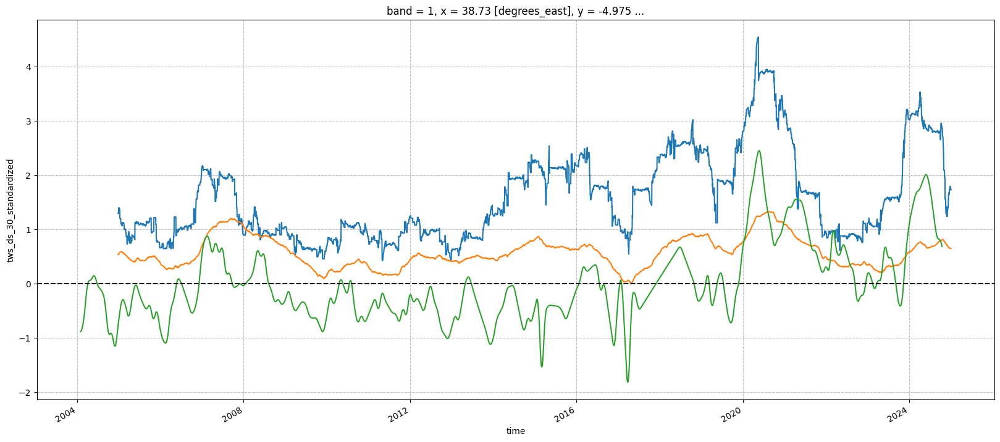

In [26]:
plt.figure(figsize=(20,8))
zone_4['precipitation_360_standardized'].sel(y=-5, x= 38.72, method='nearest').plot()
zone_4['sm_360_standardized'].sel(y=-5, x= 38.72, method='nearest').plot()
zone_4['tws_ds_30_standardized'].sel(y=-5, x= 38.72, method='nearest').plot()
plt.axhline(0, color='k', linestyle='--')
plt.grid(True, which='both', linestyle='--', alpha=0.8)

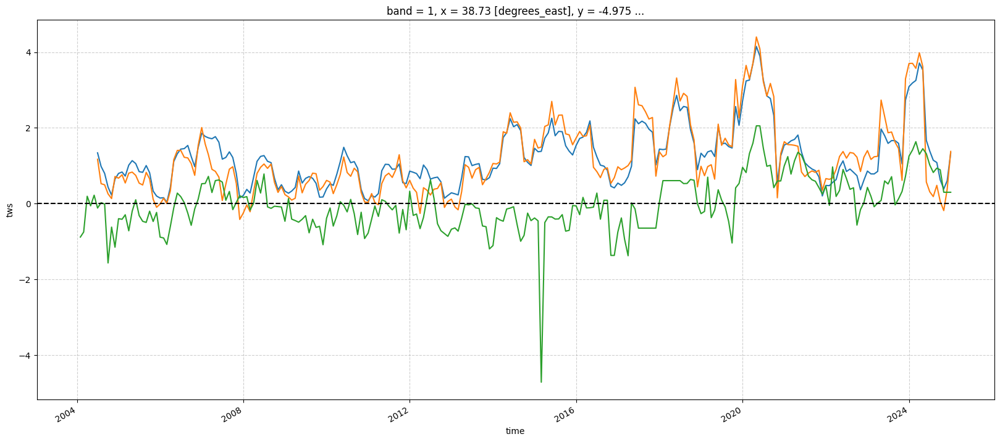

In [13]:
plt.figure(figsize=(20,8))
normalized_dict['p_3m'].sel(y=-5, x= 38.72, method='nearest').plot(label='p_3m')
normalized_dict['pet_3m'].sel(y=-5, x= 38.72, method='nearest').plot(label='p_3m')
normalized_dict['tws'].sel(y=-5, x= 38.72, method='nearest').plot(label='tws')
plt.axhline(0, color='k', linestyle='--')
plt.grid(True, which='both', linestyle='--', alpha=0.6)
plt.show()

# # Set x-axis to show years at 2-year intervals
# plt.set_major_locator(mdates.YearLocator(base=2))  # Ticks every 2 years
# plt.set_major_formatter(mdates.DateFormatter('%Y'))

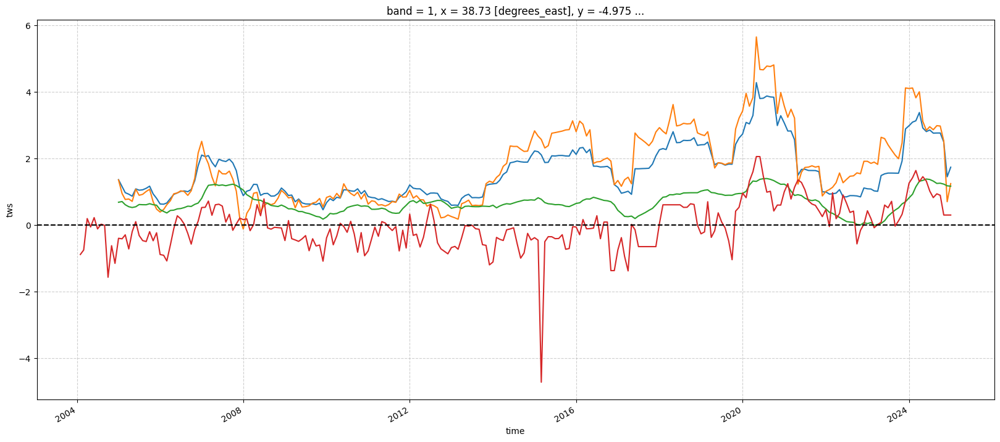

In [71]:
plt.figure(figsize=(20,8))
normalized_dict['p_3m'].sel(y=-5, x= 38.72, method='nearest').plot(label='p_3m')
normalized_dict['pet_3m'].sel(y=-5, x= 38.72, method='nearest').plot(label='p_3m')
normalized_dict['et_3m'].sel(y=-5, x= 38.72, method='nearest').plot(label='p_3m')
normalized_dict['tws'].sel(y=-5, x= 38.72, method='nearest').plot(label='tws')
plt.axhline(0, color='k', linestyle='--')
plt.grid(True, which='both', linestyle='--', alpha=0.6)
plt.show()

# # Set x-axis to show years at 2-year intervals
# plt.set_major_locator(mdates.YearLocator(base=2))  # Ticks every 2 years
# plt.set_major_formatter(mdates.DateFormatter('%Y'))

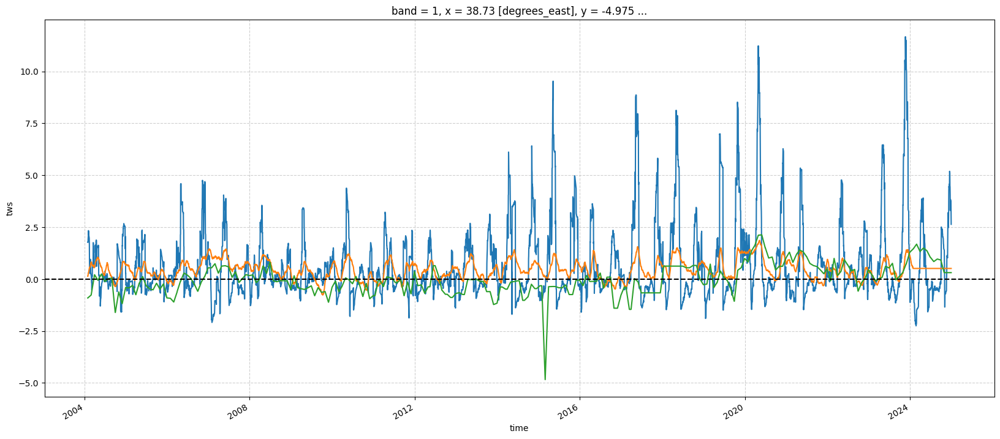

In [374]:
plt.figure(figsize=(20,8))
normalized_dict['p_et_30'].sel(y=-5, x= 38.72, method='nearest').plot(label='p-et_3month')
normalized_dict['sm_30'].sel(y=-5, x= 38.72, method='nearest').plot(label='sm_3month')
normalized_dict['tws_30'].sel(y=-5, x= 38.72, method='nearest').plot(label='tws_3month')
plt.axhline(0, color='k', linestyle='--')
plt.grid(True, which='both', linestyle='--', alpha=0.6)
plt.show()

# # Set x-axis to show years at 2-year intervals
# plt.set_major_locator(mdates.YearLocator(base=2))  # Ticks every 2 years
# plt.set_major_formatter(mdates.DateFormatter('%Y'))

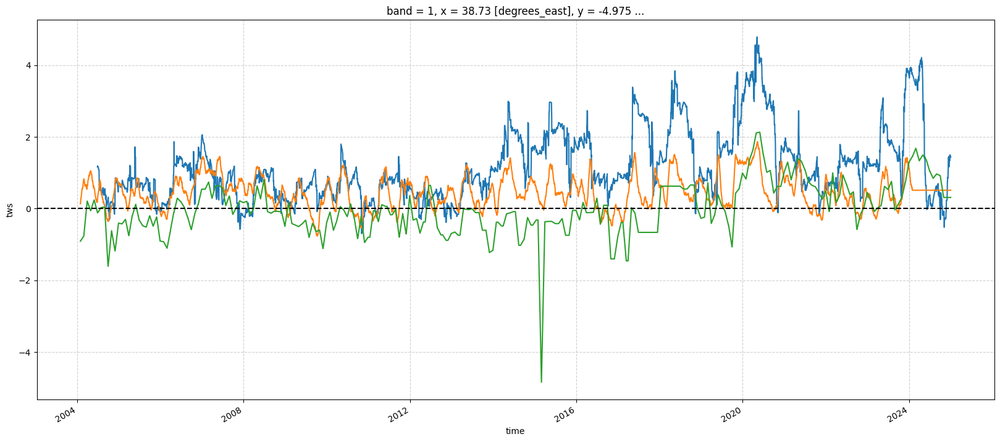

In [417]:
plt.figure(figsize=(20,8))
normalized_dict['p_et_180'].sel(y=-5, x= 38.72, method='nearest').plot(label='p-et_3month')
normalized_dict['sm_30'].sel(y=-5, x= 38.72, method='nearest').plot(label='sm_3month')
normalized_dict['tws_30'].sel(y=-5, x= 38.72, method='nearest').plot(label='tws_3month')
plt.axhline(0, color='k', linestyle='--')
plt.grid(True, which='both', linestyle='--', alpha=0.6)
plt.show()

# # Set x-axis to show years at 2-year intervals
# plt.set_major_locator(mdates.YearLocator(base=2))  # Ticks every 2 years
# plt.set_major_formatter(mdates.DateFormatter('%Y'))

##### ECDF

In [28]:
data_subset = {}
# for span in [90, 180, 360]:
variables = ['precipitation_90_standardized', 'sm_90_standardized', 'tws_ds_30_standardized']
for var in variables:
    data_subset = zone_4[variables].resample(time='1M').mean()

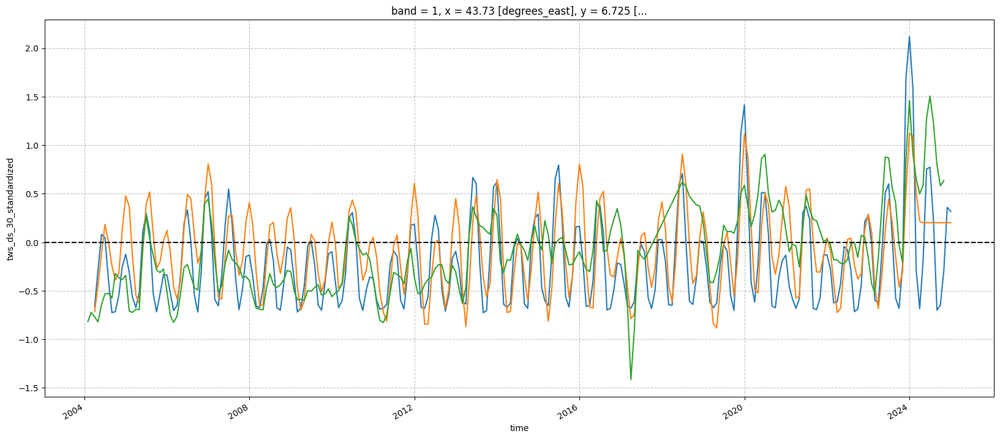

In [29]:
plt.figure(figsize=(20,8))
data_subset['precipitation_90_standardized'].sel(y=6.72, x= 43.72, method='nearest').plot()
data_subset['sm_90_standardized'].sel(y=6.72, x= 43.72, method='nearest').plot()
data_subset['tws_ds_30_standardized'].sel(y=6.72, x= 43.72, method='nearest').plot()
plt.axhline(0, color='k', linestyle='--')
plt.grid(True, which='both', linestyle='--', alpha=0.8)

In [30]:
zone_4_stacked = {}
for var in ['precipitation_90_standardized', 'sm_90_standardized', 'tws_ds_30_standardized']:
    zone_4_stacked[var] = data_subset[var].stack(points=('y', 'x'), create_index=False)

In [147]:
zone_4_stacked['precipitation_180_standardized'].isel(points=5)

<xarray.DataArray 'precipitation_180_standardized' (time: 252)>
dask.array<getitem, shape=(252,), dtype=float32, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
    band         int64 1
    x            float64 22.18
    y            float64 22.92
    spatial_ref  int64 0
    lat          float64 dask.array<chunksize=(), meta=np.ndarray>
    lon          float64 dask.array<chunksize=(), meta=np.ndarray>
  * time         (time) datetime64[ns] 2004-01-31 2004-02-29 ... 2024-12-31

In [66]:
zone_4_stacked_day = {}
for var in ['precipitation_90_standardized', 'sm_90_standardized', 'tws_ds_30_standardized']:
    zone_4_stacked_day[var] = zone_4[var].stack(points=('y', 'x'), create_index=False)

In [31]:
pet_data = zone_4_stacked['precipitation_90_standardized'].values
sm_data = zone_4_stacked['sm_90_standardized'].values
tws_data = zone_4_stacked['tws_ds_30_standardized'].values

valid_mask = (~np.isnan(pet_data) & (~np.isnan(sm_data)) & (~np.isnan(tws_data)))

pet_clean = pet_data[valid_mask]
sm_clean = sm_data[valid_mask]
tws_clean = tws_data[valid_mask]

pet_ecdf = ECDF(pet_clean)
sm_ecdf = ECDF(sm_clean)
tws_ecdf = ECDF(tws_clean)

In [67]:
pet_data_ = zone_4_stacked_day['precipitation_90_standardized'].values
sm_data_ = zone_4_stacked_day['sm_90_standardized'].values
tws_data_ = zone_4_stacked_day['tws_ds_30_standardized'].values

valid_mask = (~np.isnan(pet_data_) & (~np.isnan(sm_data_)) & (~np.isnan(tws_data_)))

pet_cle = pet_data_[valid_mask]
sm_cle = sm_data_[valid_mask]
tws_cle = tws_data_[valid_mask]

pet_ecd = ECDF(pet_cle)
sm_ecd = ECDF(sm_cle)
tws_ecd = ECDF(tws_cle)

In [73]:
len(pet_cle)

104879511

In [32]:
raw_data = np.column_stack([pet_clean, sm_clean, tws_clean])

In [33]:
# Compute Kendall's Tau for each pair
tau_pet_sm, pval_pet_sm = kendalltau(raw_data[:, 0], raw_data[:, 1])  # P-ET vs SM
tau_pet_tws, pval_pet_tws = kendalltau(raw_data[:, 0], raw_data[:, 2])  # P-ET vs TWS
tau_sm_tws, pval_sm_tws = kendalltau(raw_data[:, 1], raw_data[:, 2])  # SM vs TWS

# Print results
print("Kendall's Tau for uniform data:")
print(f"P-ET vs SM: tau = {tau_pet_sm:.3f}, p-value = {pval_pet_sm:.3e}")
print(f"P-ET vs TWS: tau = {tau_pet_tws:.3f}, p-value = {pval_pet_tws:.3e}")
print(f"SM vs TWS: tau = {tau_sm_tws:.3f}, p-value = {pval_sm_tws:.3e}")

Kendall's Tau for uniform data:
P-ET vs SM: tau = 0.635, p-value = 0.000e+00
P-ET vs TWS: tau = 0.247, p-value = 0.000e+00
SM vs TWS: tau = 0.236, p-value = 0.000e+00


In [76]:
raw_data_ = np.column_stack([pet_cle, sm_cle, tws_cle])
raw_data_.shape

(104879511, 3)

In [77]:
# Daily tau
# Compute Kendall's Tau for each pair
tau_pet_sm, pval_pet_sm = kendalltau(raw_data_[:, 0], raw_data_[:, 1])  # P-ET vs SM
tau_pet_tws, pval_pet_tws = kendalltau(raw_data_[:, 0], raw_data_[:, 2])  # P-ET vs TWS
tau_sm_tws, pval_sm_tws = kendalltau(raw_data_[:, 1], raw_data_[:, 2])  # SM vs TWS

# Print results
print("Kendall's Tau for uniform data:")
print(f"P-ET vs SM: tau = {tau_pet_sm:.3f}, p-value = {pval_pet_sm:.3e}")
print(f"P-ET vs TWS: tau = {tau_pet_tws:.3f}, p-value = {pval_pet_tws:.3e}")
print(f"SM vs TWS: tau = {tau_sm_tws:.3f}, p-value = {pval_sm_tws:.3e}")

Kendall's Tau for uniform data:
P-ET vs SM: tau = 0.629, p-value = 0.000e+00
P-ET vs TWS: tau = 0.250, p-value = 0.000e+00
SM vs TWS: tau = 0.238, p-value = 0.000e+00


In [175]:
raw_data

array([[-0.88678783, -1.1303303 , -1.03979567],
       [-0.88678783, -1.10444806, -1.04056494],
       [-0.88678783, -1.09776062, -1.04094958],
       ...,
       [-0.57103801, -0.24243328,  0.09918196],
       [-0.5414331 , -0.17965022,  0.11227293],
       [-0.55869126, -0.39105211,  0.1253639 ]])

### Sampling Strategies

In [34]:
# Full data (millions of points)
u = pet_ecdf(pet_clean)
v = sm_ecdf(sm_clean)
w = tws_ecdf(tws_clean)  # Uniform margins from ECDF

In [37]:
# Randomly sample 50,000 points without replacement
sample_size = 10000
np.random.seed(42)
indices = np.random.choice(len(u), size=sample_size, replace=False)
u_sub = u[indices]
v_sub = v[indices]
w_sub = w[indices]

# Copula data
cop_data = np.column_stack([u_sub, v_sub, w_sub])

In [38]:
# Compute Kendall's Tau for each pair
tau_pet_sm, pval_pet_sm = kendalltau(cop_data[:, 0], cop_data[:, 1])  # P-ET vs SM
tau_pet_tws, pval_pet_tws = kendalltau(cop_data[:, 0], cop_data[:, 2])  # P-ET vs TWS
tau_sm_tws, pval_sm_tws = kendalltau(cop_data[:, 1], cop_data[:, 2])  # SM vs TWS

# Print results
print("Kendall's Tau for uniform data:")
print(f"P-ET vs SM: tau = {tau_pet_sm:.3f}, p-value = {pval_pet_sm:.3e}")
print(f"P-ET vs TWS: tau = {tau_pet_tws:.3f}, p-value = {pval_pet_tws:.3e}")
print(f"SM vs TWS: tau = {tau_sm_tws:.3f}, p-value = {pval_sm_tws:.3e}")

Kendall's Tau for uniform data:
P-ET vs SM: tau = 0.635, p-value = 0.000e+00
P-ET vs TWS: tau = 0.257, p-value = 0.000e+00
SM vs TWS: tau = 0.251, p-value = 1.896e-310


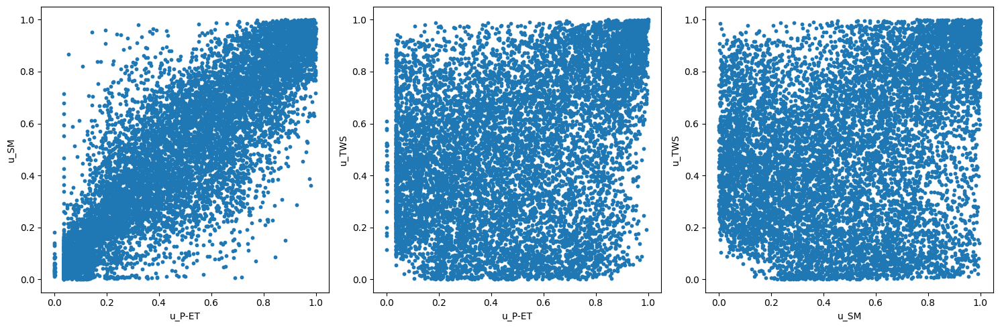

In [38]:
# Plot scatter plots of sampled data

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].scatter(cop_data[:,0], cop_data[:,1], s=10)
axes[0].set_xlabel('u_P-ET')
axes[0].set_ylabel('u_SM')
axes[1].scatter(cop_data[:, 0], cop_data[:, 2], s=10)
axes[1].set_xlabel('u_P-ET')
axes[1].set_ylabel('u_TWS')
axes[2].scatter(cop_data[:, 1], cop_data[:, 2], s=10)
axes[2].set_xlabel('u_SM')
axes[2].set_ylabel('u_TWS')
plt.tight_layout()
plt.show()

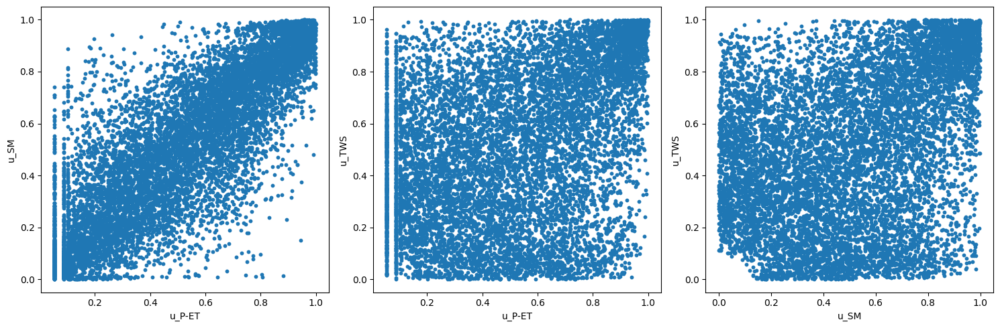

In [39]:
# Plot scatter plots of sampled data

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].scatter(cop_data[:,0], cop_data[:,1], s=10)
axes[0].set_xlabel('u_P-ET')
axes[0].set_ylabel('u_SM')
axes[1].scatter(cop_data[:, 0], cop_data[:, 2], s=10)
axes[1].set_xlabel('u_P-ET')
axes[1].set_ylabel('u_TWS')
axes[2].scatter(cop_data[:, 1], cop_data[:, 2], s=10)
axes[2].set_xlabel('u_SM')
axes[2].set_ylabel('u_TWS')
plt.tight_layout()
plt.show()

In [81]:
# Stratified

def stratified_extreme_sampling(data, sample_size=5000, tail_frac=0.1):
    low_tail_mask = np.any(data < tail_frac, axis=1)
    high_tail_mask = np.any(data > 1 - tail_frac, axis=1)
    middle_mask = ~(low_tail_mask | high_tail_mask)

    low_tail = data[low_tail_mask]
    high_tail = data[high_tail_mask]
    middle = data[middle_mask]

    # Allocate more samples to tails
    n_low = int(0.4 * sample_size)
    n_high = int(0.4 * sample_size)
    n_mid = sample_size - n_low - n_high

    np.random.seed()  # optional: comment this out for full randomness
    low_sample = low_tail[np.random.choice(len(low_tail), n_low, replace=False)]
    high_sample = high_tail[np.random.choice(len(high_tail), n_high, replace=False)]
    mid_sample = middle[np.random.choice(len(middle), n_mid, replace=False)]

    return np.vstack([low_sample, mid_sample, high_sample])



In [88]:
data = np.column_stack([u, v, w])
cop_data = stratified_extreme_sampling(data, sample_size=5000)

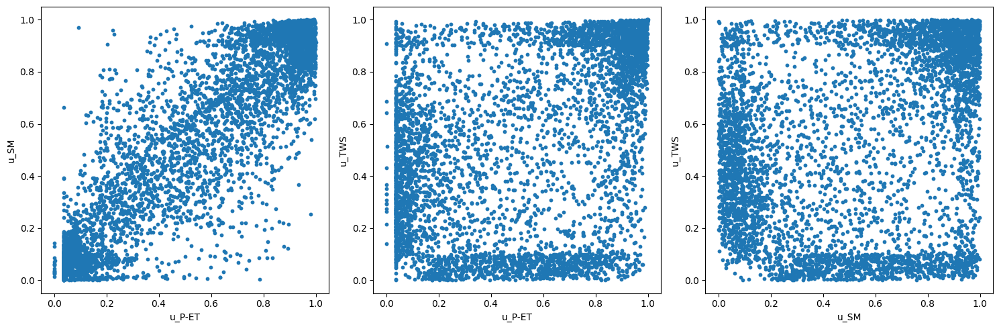

In [89]:
# Plot scatter plots of sampled data

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].scatter(cop_data[:,0], cop_data[:,1], s=10)
axes[0].set_xlabel('u_P-ET')
axes[0].set_ylabel('u_SM')
axes[1].scatter(cop_data[:, 0], cop_data[:, 2], s=10)
axes[1].set_xlabel('u_P-ET')
axes[1].set_ylabel('u_TWS')
axes[2].scatter(cop_data[:, 1], cop_data[:, 2], s=10)
axes[2].set_xlabel('u_SM')
axes[2].set_ylabel('u_TWS')
plt.tight_layout()
plt.show()

In [91]:
subregion_id = 4

copulas = {
    'Gaussian': GaussianCopula(dim=3),
    'Clayton': ClaytonCopula(dim=3),
    'Frank': FrankCopula(dim=3),
    'Gumbel': GumbelCopula(dim=3),
    # 'tCopula': StudentCopula(dim=3)
}


# Fit Copulas
results = {}
for name, copula in copulas.items():
    try:
        print(f'Fitting {name}...')
        start_time = time.time()
        copula.fit(cop_data)  #
        log_likelihood = copula.log_lik(cop_data)
        # Calculate AIC:
        if name == 't-Copula':
            num_params = copula.params[1].size
        elif name == 'Clayton' or name == 'Gumbel' or name == 'Frank':
            num_params = np.array(copula.params).size
        elif name == 'Gaussian':
            num_params = copula.params.size
        # num_params = copula.dim 
        aic = -2 * log_likelihood + 2 * num_params
        results[name] = {'copula': copula, 'log_likelihood': log_likelihood, 'AIC': aic}
        print(f"{name} Copula fitted for subregion {subregion_id}, log-likelihood: {log_likelihood:.2f}")
    except Exception as e:
        print(f"Failed to fit {name} Copula: {e}")

# Select best copula
if results:
    best_copula_name = min(results, key=lambda x: results[x]['AIC'])  # Fixed key
    best_copula = results[best_copula_name]['copula']
    print(f"Best copula (by log_likelihood): {best_copula_name} ('AIC: {results[best_copula_name]['AIC']:.2f}, 'log_likelihood: {results[best_copula_name]['log_likelihood']:.2f})")
else:
    print("No copulas were successfully fitted to the data.")


# Total runtime
end_time = time.time()
print(f"Total runtime: {end_time - start_time:.2f} seconds.")

Fitting Gaussian...
Gaussian Copula fitted for subregion 4, log-likelihood: 6004.31
Fitting Clayton...
Clayton Copula fitted for subregion 4, log-likelihood: 1817.15
Fitting Frank...
Frank Copula fitted for subregion 4, log-likelihood: 3791.27
Fitting Gumbel...
Gumbel Copula fitted for subregion 4, log-likelihood: 4038.75
Best copula (by log_likelihood): Gaussian ('AIC: -12002.63, 'log_likelihood: 6004.31)
Total runtime: 0.36 seconds.


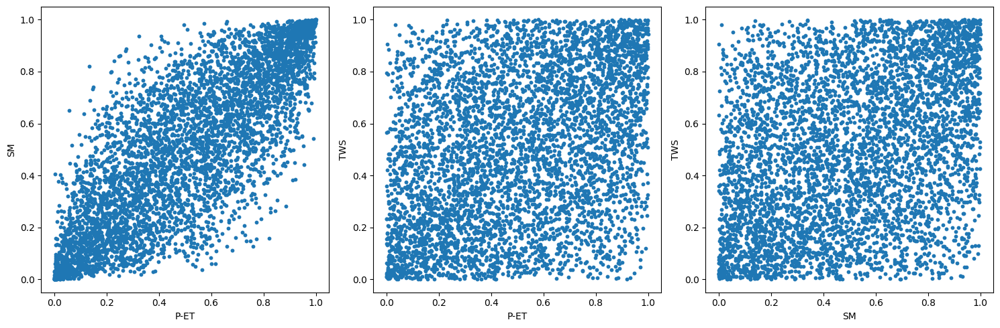

In [92]:
cop_sample = best_copula.random(5000)

# Plot scatter plots of sampled data
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].scatter(cop_sample[:,0], cop_sample[:,1], s=10)
axes[0].set_xlabel('P-ET')
axes[0].set_ylabel('SM')
axes[1].scatter(cop_sample[:, 0], cop_sample[:, 2], s=10)
axes[1].set_xlabel('P-ET')
axes[1].set_ylabel('TWS')
axes[2].scatter(cop_sample[:, 1], cop_sample[:, 2], s=10)
axes[2].set_xlabel('SM')
axes[2].set_ylabel('TWS')
plt.tight_layout()
plt.show()

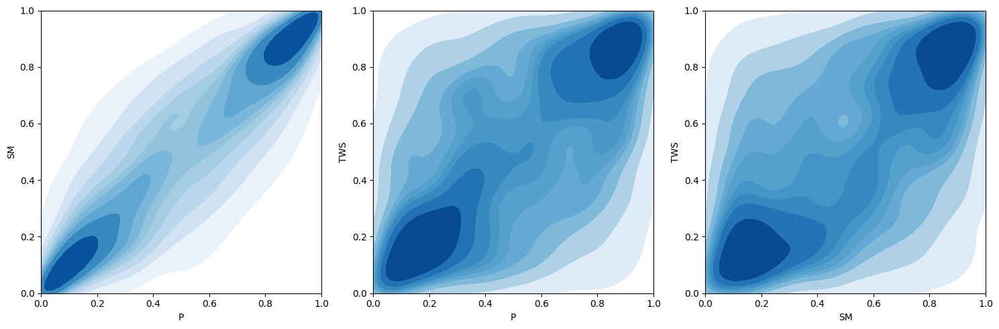

In [93]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

sns.kdeplot(x=cop_sample[:,0], y=cop_sample[:,1], cmap='Blues', fill=True, ax=axes[0])
# axes[0].scatter(cop_sample[:,0], cop_sample[:,1], s=10, alpha=0.3, color='gray')  # Optional: Add scatter points
axes[0].set_xlabel('P')
axes[0].set_ylabel('SM')
axes[0].set_xlim(0, 1)  # Uniform samples should be in [0,1]
axes[0].set_ylim(0, 1)

# Plot 2: P vs SM (assuming the third column is SM, not TWS, based on your project context)
sns.kdeplot(x=cop_sample[:,0], y=cop_sample[:,2], cmap='Blues', fill=True, ax=axes[1])
# axes[1].scatter(cop_sample[:,0], cop_sample[:,2], s=10, alpha=0.3, color='gray')
axes[1].set_xlabel('P')
axes[1].set_ylabel('TWS')  # Changed to SM (was TWS in your code)
axes[1].set_xlim(0, 1)
axes[1].set_ylim(0, 1)

# Plot 3: ET vs SM
sns.kdeplot(x=cop_sample[:,1], y=cop_sample[:,2], cmap='Blues', fill=True, ax=axes[2])
# axes[2].scatter(cop_sample[:,1], cop_sample[:,2], s=10, alpha=0.3, color='gray')
axes[2].set_xlabel('SM')
axes[2].set_ylabel('TWS')  # Changed to SM
axes[2].set_xlim(0, 1)
axes[2].set_ylim(0, 1)

# Adjust layout and display
plt.tight_layout()
plt.show()

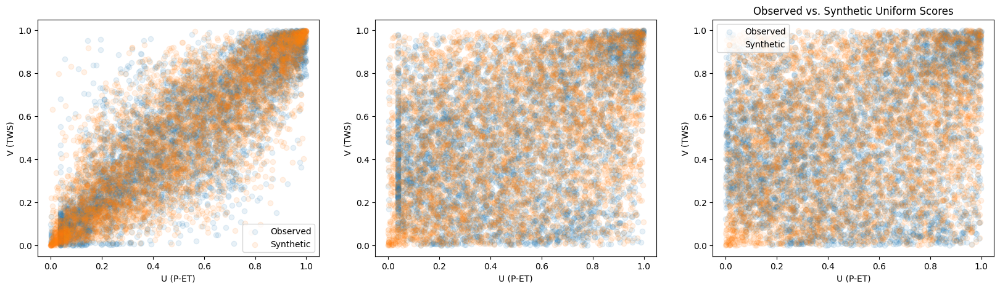

In [634]:
'Generate synthetic samples to compare with observed'
fig, axes = plt.subplots(1, 3, figsize=(20, 5))
axes[0].scatter(u_sub, v_sub, alpha=0.1, label='Observed')
axes[0].scatter(cop_sample[:,0], cop_sample[:,1], alpha=0.1, label='Synthetic')
axes[0].set_xlabel('U (P-ET)')
axes[0].set_ylabel('V (TWS)')
axes[0].legend()

axes[1].scatter(u_sub, w_sub, alpha=0.1, label='Observed')
axes[1].scatter(cop_sample[:,0], cop_sample[:,2], alpha=0.1, label='Synthetic')
axes[1].set_xlabel('U (P-ET)')
axes[1].set_ylabel('V (TWS)')
plt.legend()

axes[2].scatter(v_sub, w_sub, alpha=0.1, label='Observed')
axes[2].scatter(cop_sample[:,1], cop_sample[:,2], alpha=0.1, label='Synthetic')
axes[2].set_xlabel('U (P-ET)')
axes[2].set_ylabel('V (TWS)')

plt.legend()
plt.title('Observed vs. Synthetic Uniform Scores')
plt.show()

In [103]:
best_copula

In [102]:
smpf = best_copula.cdf(cop_sample)

In [99]:
smp

array([0.19126238, 0.25050127, 0.00046604, ..., 0.00584922, 0.0270261 ,
       0.02477967])

In [105]:
from scipy.stats import norm
di = norm.ppf(smp)

In [107]:
di.mean()

-0.879163577483781

(array([   9.,   43.,  223.,  616., 1165., 1383.,  961.,  475.,  106.,
          19.]),
 array([-4.30974044, -3.66420925, -3.01867806, -2.37314687, -1.72761568,
        -1.08208449, -0.4365533 ,  0.20897789,  0.85450908,  1.50004027,
         2.14557146]),
 <BarContainer object of 10 artists>)

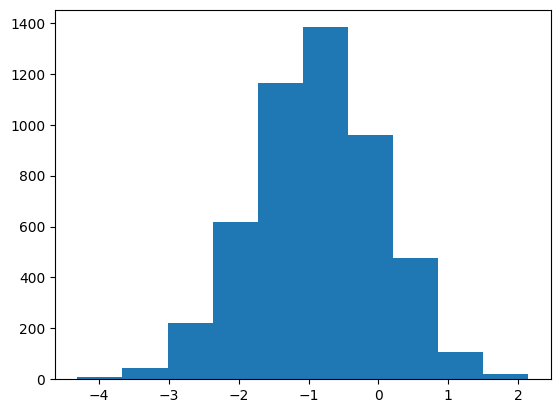

In [54]:
plt.hist(di)

(array([1675.,  904.,  650.,  475.,  405.,  327.,  246.,  159.,  118.,
          41.]),
 array([9.03316353e-06, 9.98734386e-02, 1.99737844e-01, 2.99602250e-01,
        3.99466655e-01, 4.99331061e-01, 5.99195466e-01, 6.99059871e-01,
        7.98924277e-01, 8.98788682e-01, 9.98653088e-01]),
 <BarContainer object of 10 artists>)

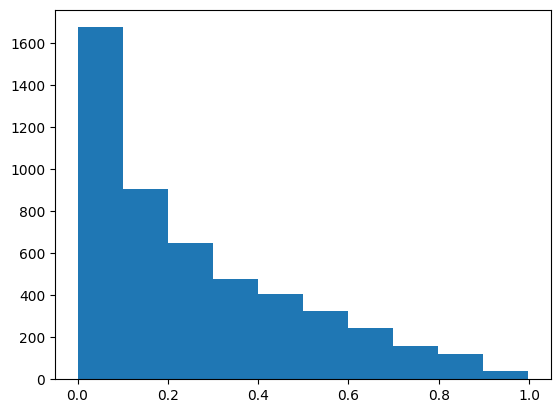

In [101]:
plt.hist(smp)

#### Vine Copula

In [99]:
import pyvinecopulib as pv

In [168]:
uniforms = {'p':u_sub, 'sm':v_sub, 'tws':w_sub}

# Convert to DataFrame for copula fitting
uniform_data = pd.DataFrame(uniforms)


In [101]:
print("Data summary:")
print(np.min(data, axis=0), np.max(data, axis=0)) 

Data summary:
[4.89255083e-04 2.89843059e-07 2.89843059e-07] [1. 1. 1.]


In [393]:
# Step 3: Compute Zone-Level ECDF and Transform to Uniform Margins
ecdf_funcs = {}
uniform_data = {}
variables =  ['p_et_30', 'sm_30', 'tws_30']
stack_time = time.time()
for var in variables:
    print(f"Computing ECDF for {var} in subregion 1...")
    # Convert to Dask array and flatten across all pixels and time steps
    
    data = zone_4_stacked[var].data  # Dask array
    data_flat = (data.flatten())
    valid_data = data_flat[~da.isnan(data_flat)]  # Compute to fit ECDF
    
    # Check for sufficient data
    if len(valid_data) < 2:
        print(f"Warning: Insufficient data for {var} in subregion 1")
        uniform_data[var] = xr.full_like(zone_4_stacked[var], np.nan)
        continue
    
    # Fit ECDF on the entire zone's data
    ecdf_model = ECDF(valid_data)
    ecdf_funcs[var] = ecdf_model
    
    # Transform the entire dataset to uniform margins
    def apply_ecdf(data, ecdf_model):
        valid_mask = ~np.isnan(data)
        result = np.full_like(data, np.nan, dtype=np.float64)
        if valid_mask.any():
            result[valid_mask] = ecdf_model(data[valid_mask])
        # Clip probabilities to avoid exactly 0 or 1
        epsilon = 1e-7
        result = np.where(np.isnan(result), np.nan,
                          np.clip(result, epsilon, 1.0 - epsilon))
        return result
    
    # Apply the ECDF to the entire dataset
    uniform_data[var] = xr.apply_ufunc(
        apply_ecdf,
        zone_4_stacked[var],
        ecdf_model,
        input_core_dims=[['time', 'points'], []],
        output_core_dims=[['time', 'points']],
        exclude_dims=set(('time', 'points')),
        dask='parallelized',
        output_dtypes=[np.float64]
    ).rename(f'u_{var.upper()[:3]}')

print("ECDF computation and transformation submitted to Dask.")
ecdf_time = time.time()
print(f"ECDF setup done in {ecdf_time - stack_time:.2f} seconds (computation pending).")

Computing ECDF for p_et_30 in subregion 1...
Computing ECDF for sm_30 in subregion 1...
Computing ECDF for tws_30 in subregion 1...
ECDF computation and transformation submitted to Dask.
ECDF setup done in 1241.04 seconds (computation pending).


In [ ]:
uniform_data

{'p_et_30': <xarray.DataArray 'u_P_E' (time: 7671, points: 407588)>
 array([[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]])
 Coordinates:
     band         int64 1
     spatial_ref  int64 0
 Dimensions without coordinates: time, points,
 'sm_30': <xarray.DataArray 'u_SM_' (time: 7671, points: 407588)>
 array([[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]])
 Coordinates:
     band         int64 1
     spatial_ref  int64 0
 Dimensions without coordinates: time, points,
 'tws_30': <xarray.DataArray 'u_TWS' (time: 7671, points: 407588)>
 arra

In [396]:
# Step 4: Prepare Data for Sampling
print("Preparing data for sampling...")
# Create a dataset with both uniform probabilities and actual (accumulated) values
pseudo_obs_ds = xr.merge([uniform_data['p_et_30'],
                         uniform_data['sm_30'],
                         uniform_data['tws_30'],
                         # monthly_var['p_et_30'].rename('accum_PRE'),
                         # monthly_var['pet_3m'].rename('accum_ET'),
                         # monthly_var['tws'].rename('accum_TWS')
                         ])
pseudo_obs_flat = pseudo_obs_ds.stack(point=('time', 'points'), create_index=False).dropna(dim='point', how='any')
pseudo_obs_ddf = pseudo_obs_flat.to_dask_dataframe()
print("Converted valid pseudo-observations to Dask DataFrame.")
prep_time = time.time()
print(f"Preparation done in {prep_time - ecdf_time:.2f} seconds.")

Preparing data for sampling...
Converted valid pseudo-observations to Dask DataFrame.
Preparation done in 544.90 seconds.


In [397]:
# Step 5: Sample for Copula Fitting
sample_fraction = 0.000055  # Adjust as needed
random_seed = 42
print(f"Sampling data ({sample_fraction*100:.2f}%) for copula fitting...")
if sample_fraction > 0 and sample_fraction <= 1.0:
    sampled_ddf = pseudo_obs_ddf.sample(frac=sample_fraction, random_state=random_seed)
    start_compute_sample = time.time()
    sampled_df_in_memory = sampled_ddf.compute()
    end_compute_sample = time.time()
    print(f"Sample computed in {end_compute_sample - start_compute_sample:.2f} seconds.")
    print(f"Sample size brought into memory: {len(sampled_df_in_memory)}")
    if len(sampled_df_in_memory) < 1000:
        print(f"Warning: Sample size ({len(sampled_df_in_memory)}) is very small...")
        if len(sampled_df_in_memory) < 50:
            raise ValueError("Sample size too small to fit copula reliably.")
else:
    raise ValueError(f"Invalid sample_fraction: {sample_fraction}...")

Sampling data (0.01%) for copula fitting...
Sample computed in 21.32 seconds.
Sample size brought into memory: 5871


In [398]:
sampled_df_in_memory

,point,band,spatial_ref,u_P_E,u_SM_,u_TWS
29380629,29380629,1,0,0.010114,0.514877,0.119028
14170835,14170835,1,0,0.703781,0.826919,0.910278
97606421,97606421,1,0,0.504032,0.015453,0.379553
44586844,44586844,1,0,0.645396,0.503331,0.421438
71937812,71937812,1,0,0.976993,0.902105,0.775429
...,...,...,...,...,...,...
69359883,69359883,1,0,0.705287,0.115541,0.799773
94207230,94207230,1,0,0.310774,0.219807,0.265752
72933365,72933365,1,0,0.682883,0.857925,0.054277
72900723,72900723,1,0,0.726532,0.194932,0.431604


In [399]:
# Uniform probabilities for Copula fitting
copula_data = sampled_df_in_memory[['u_P_E', 'u_SM_', 'u_TWS']].values
print("Copula data shape:", copula_data.shape)
print("Copula data min/max:", copula_data.min(), copula_data.max())
print("Copula data NaN count:", np.isnan(copula_data).sum())
print("First 5 rows:\n", copula_data[:5])

Copula data shape: (5871, 3)
Copula data min/max: 0.00012140628350584507 0.9999447665578848
Copula data NaN count: 0
First 5 rows:
 [[0.01011389 0.51487662 0.11902822]
 [0.70378052 0.82691871 0.91027753]
 [0.50403185 0.01545257 0.37955334]
 [0.64539616 0.50333116 0.42143834]
 [0.97699345 0.90210529 0.77542893]]


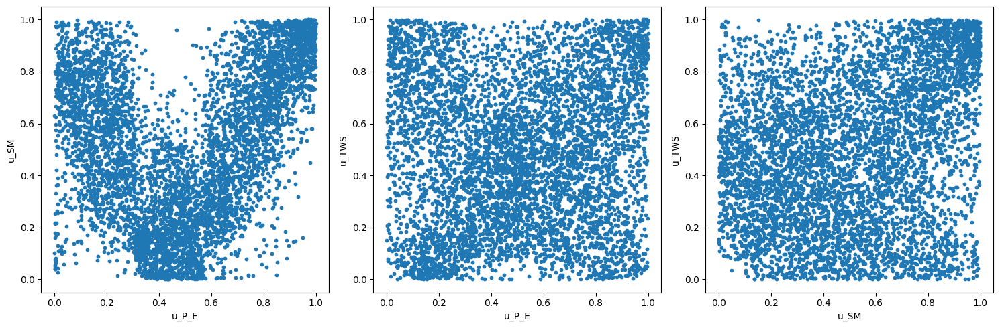

In [400]:
# Plot scatter plots of sampled data
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].scatter(copula_data[:, 0], copula_data[:, 1], s=10)
axes[0].set_xlabel('u_P_E')
axes[0].set_ylabel('u_SM')
axes[1].scatter(copula_data[:, 0], copula_data[:, 2], s=10)
axes[1].set_xlabel('u_P_E')
axes[1].set_ylabel('u_TWS')
axes[2].scatter(copula_data[:, 1], copula_data[:, 2], s=10)
axes[2].set_xlabel('u_SM')
axes[2].set_ylabel('u_TWS')
plt.tight_layout()
plt.show()

In [401]:
#  Step 7: Fit Copulas
subregion_id = 4

# Define Copulas (assuming these are from a library like 'copulae')
copulas = {
    'Gaussian': GaussianCopula(dim=3),
    'Clayton': ClaytonCopula(dim=3),
    'Frank': FrankCopula(dim=3),
    'Gumbel': GumbelCopula(dim=3),
    'tCopula': StudentCopula(dim=3)
}

# Fit Copulas
results = {}
for name, copula in copulas.items():
    try:
        print(f'Fitting {name}...')
        start_time = time.time()
        copula.fit(copula_data)  # Assuming copula_data is defined elsewhere
        log_likelihood = copula.log_lik(copula_data)
        # Calculate AIC: -2 * log_likelihood + 2 * number_of_parameters
        num_params = copula.dim  # Adjust based on your copula library's parameter count
        aic = -2 * log_likelihood + 2 * num_params
        results[name] = {'copula': copula, 'log_likelihood': log_likelihood, 'AIC': aic}
        print(f"{name} Copula fitted for subregion {subregion_id}, log-likelihood: {log_likelihood:.2f}")
    except Exception as e:
        print(f"Failed to fit {name} Copula: {e}")

# Select best copula
if results:
    best_copula_name = min(results, key=lambda x: results[x]['AIC'])  # Fixed key
    best_copula = results[best_copula_name]['copula']
    print(f"Best copula (by log_likelihood): {best_copula_name} ('AIC: {results[best_copula_name]['AIC']:.2f}, 'log_likelihood: {results[best_copula_name]['log_likelihood']:.2f})")
else:
    print("No copulas were successfully fitted to the data.")


# Total runtime
end_time = time.time()
print(f"Total runtime: {end_time - start_time:.2f} seconds.")

Fitting Gaussian...
Gaussian Copula fitted for subregion 4, log-likelihood: 450.75
Fitting Clayton...
Clayton Copula fitted for subregion 4, log-likelihood: 7.95
Fitting Frank...
Frank Copula fitted for subregion 4, log-likelihood: 234.78
Fitting Gumbel...
Gumbel Copula fitted for subregion 4, log-likelihood: 445.01
Fitting tCopula...
tCopula Copula fitted for subregion 4, log-likelihood: 499.74
Best copula (by log_likelihood): tCopula ('AIC: -993.48, 'log_likelihood: 499.74)
Total runtime: 23.20 seconds.


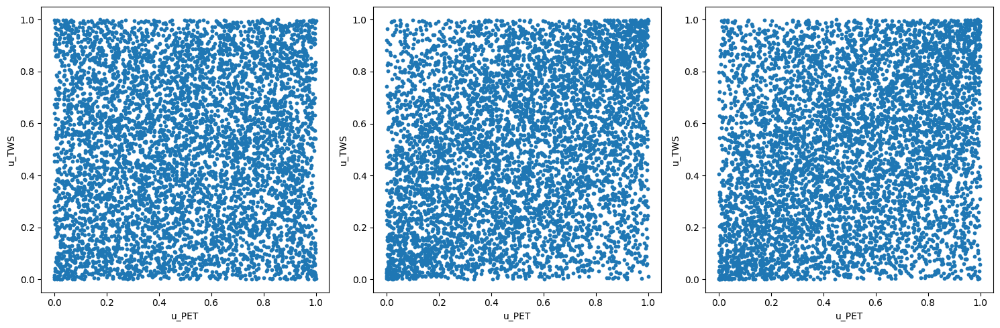

In [403]:
cop_sample = best_copula.random(6000)

# Plot scatter plots of sampled data
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].scatter(cop_sample[:,0], cop_sample[:,2], s=10)
axes[0].set_xlabel('u_PET')
axes[0].set_ylabel('u_TWS')
axes[1].scatter(cop_sample[:, 0], cop_sample[:, 1], s=10)
axes[1].set_xlabel('u_PET')
axes[1].set_ylabel('u_TWS')
axes[2].scatter(cop_sample[:, 1], cop_sample[:, 2], s=10)
axes[2].set_xlabel('u_PET')
axes[2].set_ylabel('u_TWS')
plt.tight_layout()
plt.show()

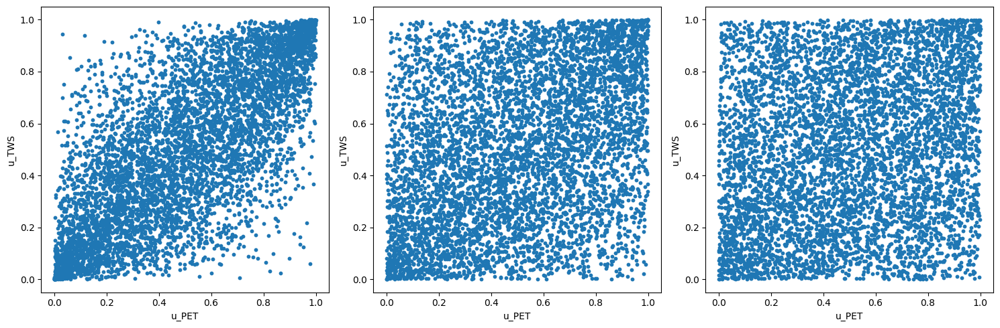

In [248]:
cop_sample = best_copula.random(6000)

# Plot scatter plots of sampled data
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].scatter(cop_sample[:,0], cop_sample[:,1], s=10)
axes[0].set_xlabel('u_PET')
axes[0].set_ylabel('u_TWS')
axes[1].scatter(cop_sample[:, 0], cop_sample[:, 2], s=10)
axes[1].set_xlabel('u_PET')
axes[1].set_ylabel('u_TWS')
axes[2].scatter(cop_sample[:, 1], cop_sample[:, 2], s=10)
axes[2].set_xlabel('u_PET')
axes[2].set_ylabel('u_TWS')
plt.tight_layout()
plt.show()

Text(37.722222222222214, 0.5, 'TWS (CDF)')

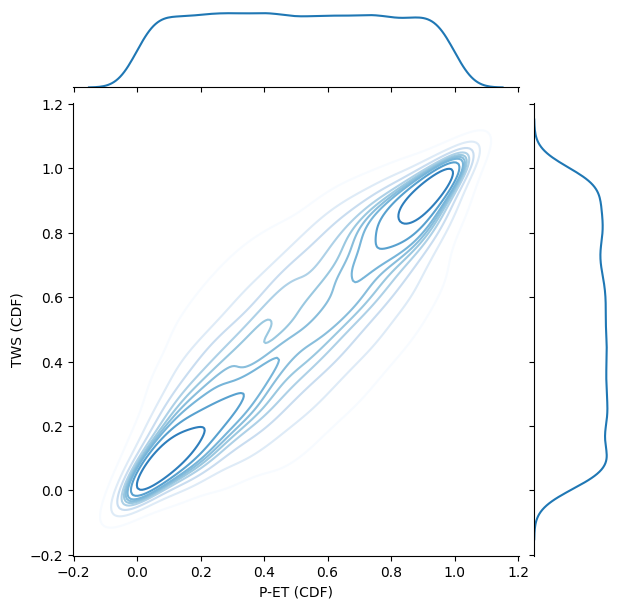

In [94]:
sns.jointplot(x=cop_sample[:,0], y=cop_sample[:,1],  kind='kde', cmap='Blues')
plt.xlabel("P-ET (CDF)")
plt.ylabel("TWS (CDF)")

### Validaition

In [202]:
# Compute uniform variables
u_p = zone_4['precipitation_180'].compute().rank(dim='time', pct=True)
u_sm = zone_4['sm_180'].compute().rank(dim='time', pct=True)
u_tws = zone_4['tws_30'].compute().rank(dim='time', pct=True)

In [225]:
gaussian_copula = GaussianCopula(dim=3)
# best_copula.cdf(np.vstack([23,4,3]).T)

In [226]:
# Define a function to compute the joint CDF
def joint_cdf(u_p, u_sm, u_tws):
    return gaussian_copula.cdf([u_p, u_sm, u_tws])

In [ ]:
# Apply the function to the uniform variables
joint_probs = xr.apply_ufunc(
    joint_cdf,
    u_p, u_sm, u_tws,
    vectorize=True,  # Apply the function element-wise
    dask='parallelized',  # Use dask for parallel computation
    output_dtypes=[float]  # Specify output type
)

In [ ]:
# Define the threshold
c = 0.2

# Identify drought conditions
drought_condition = (joint_probs < c).astype(int)

In [ ]:
# Compute the drought index as the fraction of grid points in drought
drought_index = drought_condition.mean(dim=['y', 'x'])

# Optional: Plot the drought index over time
import matplotlib.pyplot as plt
drought_index.plot()
plt.title('Drought Index for Subregion')
plt.xlabel('Time')
plt.ylabel('Fraction of Area in Drought')
plt.show()

In [ ]:
# Example: Plot drought conditions for a specific time
time_step = '2020-01-01'
drought_condition.sel(time=time_step).plot()
plt.title(f'Drought Conditions on {time_step}')
plt.show()

In [ ]:
# Define thresholds
thresholds = {
    'no_drought': 1.0,
    'mild': 0.3,
    'moderate': 0.2,
    'severe': 0.1,
    'extreme': 0.05
}

# Create severity DataArray
severity = xr.full_like(joint_probs, 0, dtype=int)
severity = xr.where(joint_probs < thresholds['mild'], 1, severity)  # Mild
severity = xr.where(joint_probs < thresholds['moderate'], 2, severity)  # Moderate
severity = xr.where(joint_probs < thresholds['severe'], 3, severity)  # Severe
severity = xr.where(joint_probs < thresholds['extreme'], 4, severity)  # Extreme
severity.name = 'drought_severity'

In [ ]:
# Compute proportions for each severity level
severity_proportions = {
    level: (severity == code).mean(dim=['y', 'x'])
    for level, code in {'no_drought': 0, 'mild': 1, 'moderate': 2, 'severe': 3, 'extreme': 4}.items()
}

# Combine into a single DataArray
drought_index = xr.Dataset(severity_proportions).to_array(dim='severity')

# Plot the time-series
import matplotlib.pyplot as plt
for level in severity_proportions:
    severity_proportions[level].plot(label=level)
plt.title('Drought Severity Proportions in Subregion')
plt.xlabel('Time')
plt.ylabel('Proportion of Area')
plt.legend()
plt.show()

### All Variables

In [10]:
variables = ['p_ema120', 'et_ema120', 'tws']  # Raw TWS

# Compute ECDF
ecdf_funcs = {}
uniform_data = {}
start = time.time()

chunk_size = 1000
for var in variables:
    print(f"Computing ECDF for {var}...")
    uniform_data[var] = xr.full_like(zone_1[var], np.nan)
    
    # Collect valid data with Dask
    data = zone_1[var].data  # Dask array
    data_flat = data.flatten()
    valid_data = data_flat[~da.isnan(data_flat)].compute()  # Compute valid data only

    if len(valid_data) < 1000:
        print(f"Warning: Insufficient data for {var} ({len(valid_data)} points)")
        uniform_data[var] = uniform_data[var]
        continue

    # Fit ECDF
    ecdf_model = ECDF(valid_data)
    ecdf_funcs[var] = ecdf_model

    

    def apply_ecdf(data, ecdf_model):
            valid_mask = ~np.isnan(data)
            result = np.full_like(data, np.nan, dtype=np.float64)
            result[valid_mask] = ecdf_model(data[valid_mask])
            epsilon = 1e-6
            result = np.clip(result, epsilon, 1.0 - epsilon, where=~np.isnan(result))
            return result

    uniform_chunk = xr.apply_ufunc(
            apply_ecdf,
            zone_1[var].compute(),
            ecdf_model,
            input_core_dims=[['time', 'points'], []],
            output_core_dims=[['time', 'points']],
            vectorize=True
        )
    # uniform_data[var].loc[dict(points=slice(start_idx, end_idx))] = uniform_chunk

uniform_ds = xr.merge([uniform_data[var].rename(f'u_{var.upper()[:3]}') for var in variables])

print("ECDF computation completed.")

end = time.time()
print(f"ECDF transformation: {end - start:.2f} seconds")

Computing ECDF for p_ema120...


/home/jovyan/.local/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3508: PerformanceWarning: Reshaping is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array.reshape(shape)

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array.reshape(shape)Explictly passing ``limit`` to ``reshape`` will also silence this warning
    >>> array.reshape(shape, limit='128 MiB')
  exec(code_obj, self.user_global_ns, self.user_ns)


Computing ECDF for et_ema120...


/home/jovyan/.local/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3508: PerformanceWarning: Reshaping is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array.reshape(shape)

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array.reshape(shape)Explictly passing ``limit`` to ``reshape`` will also silence this warning
    >>> array.reshape(shape, limit='128 MiB')
  exec(code_obj, self.user_global_ns, self.user_ns)


Computing ECDF for tws...


/home/jovyan/.local/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3508: PerformanceWarning: Reshaping is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array.reshape(shape)

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array.reshape(shape)Explictly passing ``limit`` to ``reshape`` will also silence this warning
    >>> array.reshape(shape, limit='128 MiB')
  exec(code_obj, self.user_global_ns, self.user_ns)


ECDF computation completed.
ECDF transformation: 574.32 seconds


In [11]:
uniform_ds

<xarray.Dataset>
Dimensions:      (time: 7671, points: 226127)
Coordinates:
    band         int64 1
  * time         (time) datetime64[ns] 2004-01-01 2004-01-02 ... 2024-12-31
    spatial_ref  int64 0
    lat          (points) float64 dask.array<chunksize=(57964,), meta=np.ndarray>
    lon          (points) float64 dask.array<chunksize=(75151,), meta=np.ndarray>
  * points       (points) object MultiIndex
  * y            (points) float64 23.12 23.12 23.12 ... -11.38 -11.38 -11.38
  * x            (points) float64 30.33 30.38 30.48 30.53 ... 51.28 51.33 51.38
    subregion    int64 1
Data variables:
    u_P_E        (time, points) float32 dask.array<chunksize=(7671, 19209), meta=np.ndarray>
    u_ET_        (time, points) float64 dask.array<chunksize=(7671, 19209), meta=np.ndarray>
    u_TWS        (time, points) float64 dask.array<chunksize=(7671, 19209), meta=np.ndarray>
Attributes:
    AREA_OR_POINT:             Area
    TIFFTAG_DATETIME:          2015:09:01 17:11:33
    TIFFTAG_DOCUMENTNAME:      /home/sandbox/chirps/v2.0/daily_downscaled_by_...
    TIFFTAG_IMAGEDESCRIPTION:  IDL TIFF file
    TIFFTAG_RESOLUTIONUNIT:    2 (pixels/inch)
    TIFFTAG_SOFTWARE:          IDL 8.5, Exelis Visual Information Solutions, ...
    TIFFTAG_XRESOLUTION:       100
    TIFFTAG_YRESOLUTION:       100
    units:                     mm
    grid_mapping:              spatial_ref

In [34]:
n = uniform_ds['u_P_E'].compute()
n.values.flatten()[~np.isnan(n.values.flatten())]

array([], dtype=float32)

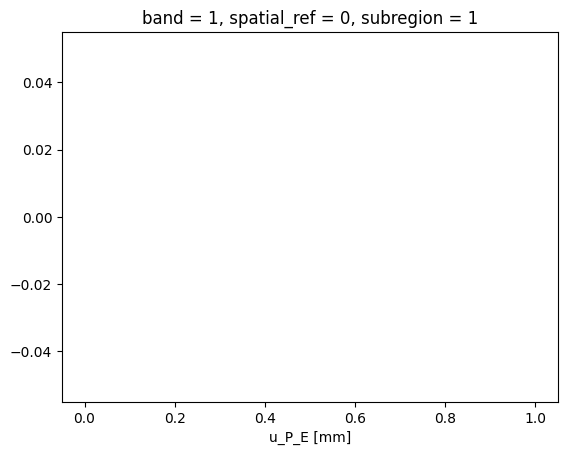

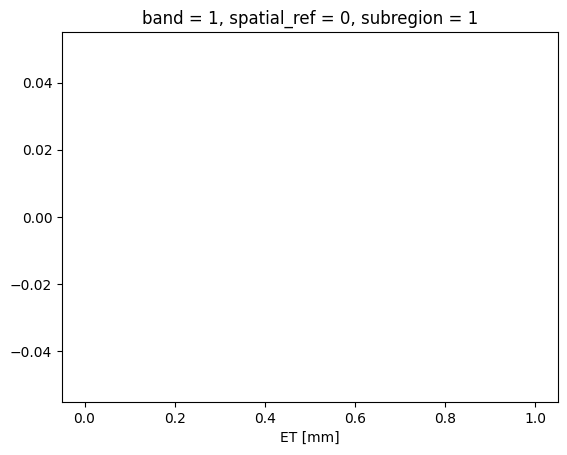

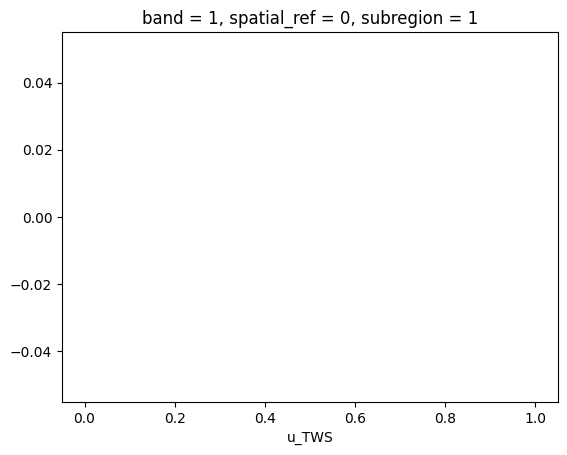

In [18]:
vr = ['u_P_E', 'u_ET_', 'u_TWS']
for var in vr:
    uniform_ds[var].compute().plot.hist(bins=50)
    plt.show()

In [22]:
# Prepare data for sampling
start = time.time()
pseudo_obs_ds = xr.merge([
    uniform_ds['u_P_E'],
    uniform_ds['u_ET_'],
    uniform_ds['u_TWS'],
    zone_1['p_ema120'].rename('accum_PRE'),
    zone_1['et_ema120'].rename('accum_ET'),
    zone_1['tws'].rename('accum_TWS')
])


In [28]:
pseudo_obs_ds = pseudo_obs_ds.unstack('points')

/home/jovyan/.local/lib/python3.8/site-packages/xarray/core/dataset.py:4903: PerformanceWarning: Reshaping is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array.reshape(shape)

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array.reshape(shape)Explictly passing ``limit`` to ``reshape`` will also silence this warning
    >>> array.reshape(shape, limit='128 MiB')
  result = result._unstack_full_reindex(


In [29]:
pseudo_obs_ds

<xarray.Dataset>
Dimensions:      (y: 671, x: 337, time: 7671)
Coordinates:
  * y            (y) float64 23.12 23.07 23.02 22.97 ... -11.28 -11.33 -11.38
  * x            (x) float64 30.33 30.38 30.48 30.53 ... 51.18 51.28 51.33 51.38
    band         int64 1
  * time         (time) datetime64[ns] 2004-01-01 2004-01-02 ... 2024-12-31
    spatial_ref  int64 0
    lat          (y, x) float64 dask.array<chunksize=(172, 337), meta=np.ndarray>
    lon          (y, x) float64 dask.array<chunksize=(223, 337), meta=np.ndarray>
    subregion    int64 1
Data variables:
    u_P_E        (time, y, x) float32 dask.array<chunksize=(7671, 57, 337), meta=np.ndarray>
    u_ET_        (time, y, x) float64 dask.array<chunksize=(7671, 57, 337), meta=np.ndarray>
    u_TWS        (time, y, x) float64 dask.array<chunksize=(7671, 57, 337), meta=np.ndarray>
    accum_PRE    (time, y, x) float32 dask.array<chunksize=(7671, 57, 337), meta=np.ndarray>
    accum_ET     (time, y, x) float64 dask.array<chunksize=(7671, 57, 337), meta=np.ndarray>
    accum_TWS    (time, y, x) float64 dask.array<chunksize=(7671, 57, 337), meta=np.ndarray>
Attributes:
    AREA_OR_POINT:             Area
    TIFFTAG_DATETIME:          2015:09:01 17:11:33
    TIFFTAG_DOCUMENTNAME:      /home/sandbox/chirps/v2.0/daily_downscaled_by_...
    TIFFTAG_IMAGEDESCRIPTION:  IDL TIFF file
    TIFFTAG_RESOLUTIONUNIT:    2 (pixels/inch)
    TIFFTAG_SOFTWARE:          IDL 8.5, Exelis Visual Information Solutions, ...
    TIFFTAG_XRESOLUTION:       100
    TIFFTAG_YRESOLUTION:       100
    units:                     mm
    grid_mapping:              spatial_ref

#### Apply EMA Zone-level

In [9]:
start = time.time()
for var in ['precipitation', 'et']:
    print(f'Applying EMA to {var} ...')
    ema = apply_ema(zone_1[var].compute(), 60)
    zone_1[var+'_60'] = ema
end = time.time()
print(f'Completed the EMA process in {end - start:2f} seconds')

Applying EMA to precipitation ...
Applying EMA to et ...
Completed the EMA process in 182.852458 seconds


In [ ]:
# Process subregions and combine into one dataset
start = time.time()
landform_classes = np.unique(variables['landform'].values[~np.isnan(variables['landform'].values)])
print('Extracted Landform classes')
subregion_list = []
with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    for subregion_id in landform_classes[:1]:
        if np.isnan(subregion_id):
            continue
        print(f"Processing subregion {subregion_id}...")

        # Extract subregion
        mask = variables['landform'] == subregion_id
        subregion_ds = variables.where(mask, drop=True)

        # Stack spatial dimensions
        stacked_ds = subregion_ds.stack(space=['y', 'x'])


        # Add subregion coordinate
        stacked_ds = stacked_ds.assign_coords(subregion=int(subregion_id)).expand_dims('subregion')
        subregion_list.append(stacked_ds)

# Combine all subregions into one dataset
all_subregions_ds= xr.concat(subregion_list, dim='subregion')

# Inspect combined dataset
print("Combined subregions dataset:")
print(all_subregions_ds)
end = time.time()

print(f'Duration: {end  - start:2f} seconds')

In [36]:
print(zone_1)

<xarray.Dataset>
Dimensions:        (time: 7671, points: 226127)
Coordinates:
    band           int64 1
  * time           (time) datetime64[ns] 2004-01-01 2004-01-02 ... 2024-12-31
    spatial_ref    int64 0
    lat            (points) float64 dask.array<chunksize=(57964,), meta=np.ndarray>
    lon            (points) float64 dask.array<chunksize=(75151,), meta=np.ndarray>
  * points         (points) object MultiIndex
  * y              (points) float64 23.12 23.12 23.12 ... -11.38 -11.38 -11.38
  * x              (points) float64 30.33 30.38 30.48 ... 51.28 51.33 51.38
    subregion      int64 1
Data variables:
    precipitation  (time, points) float32 dask.array<chunksize=(7671, 19209), meta=np.ndarray>
    et             (time, points) float64 dask.array<chunksize=(7671, 19209), meta=np.ndarray>
    tws            (time, points) float64 dask.array<chunksize=(7671, 19209), meta=np.ndarray>
    p_ema120       (time, points) float32 dask.array<chunksize=(7671, 19209), meta=np.ndarray

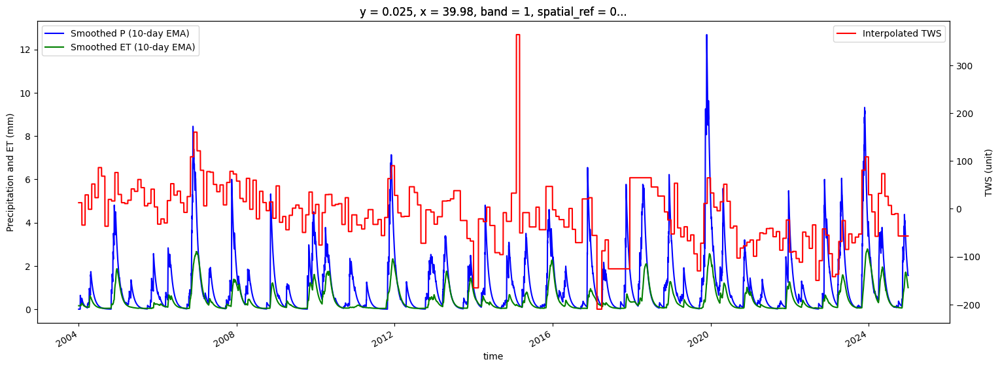

In [19]:
# Set up the figure
plt.figure(figsize=(18, 6))

# Create the first axis for ppt and et
ax1 = plt.gca()  # Get current axis
v.p_60.sel(y=0, x=40, method='nearest').plot(ax=ax1, label='Smoothed P (10-day EMA)', color='blue')
v.et_60.sel(y=0, x=40, method='nearest').plot(ax=ax1, label='Smoothed ET (10-day EMA)', color='green')

# Customize the first axis
ax1.set_ylabel('Precipitation and ET (mm)')  # Assuming ppt and et are in mm
ax1.legend(loc='upper left')

# Create the second axis for tws
ax2 = ax1.twinx()
v.tws.sel(y=0, x=40, method='nearest').plot(ax=ax2, label='Interpolated TWS', color='red')

# Customize the second axis
ax2.set_ylabel('TWS (unit)')  # Replace 'unit' with the actual unit of tws
ax2.legend(loc='upper right')

# Show the plot
plt.show()

### Stratefied sampling

In [ ]:
# GR

vars = ['p_ema120', 'et_ema120', 'tws']

# Compute ECDF and transform to uniform marginals
ecdf_funcs = {}
uniform_data = {}
start = time.time()

for var in vars:
    print(f"Computing ECDF for {var}...")
    # Extract Dask array
    data = zone_1[var].data  # Dask array
    data_flat = data.flatten()
    valid_data = data_flat[~da.isnan(data_flat)].compute()  # Compute only valid data

    # Check for sufficient data
    if len(valid_data) < 100:
        print(f"Warning: Insufficient data for {var} ({len(valid_data)} points)")
        uniform_data[var] = xr.full_like(zone_1[var], np.nan)
        continue

    # Fit ECDF
    ecdf_model = ECDF(valid_data)
    ecdf_funcs[var] = ecdf_model

    # Apply ECDF to transform to uniform marginals
    def apply_ecdf(data, ecdf_model):
        valid_mask = ~da.isnan(data)
        result = da.full_like(data, np.nan, dtype=np.float64)
        result = da.where(valid_mask, ecdf_model(data), result)
        # Clip probabilities
        epsilon = 1e-6  # Adjustable
        result = da.where(da.isnan(result), np.nan, 
                         da.clip(result, epsilon, 1.0 - epsilon))
        return result

    # Apply ECDF lazily
    uniform_data[var] = xr.apply_ufunc(
            apply_ecdf,
            zone_1[var],
            ecdf_model,
            input_core_dims=[['time', 'points'], []],
            output_core_dims=[['time', 'points']],
            exclude_dims={'time', 'points'},
            dask='parallelized',
            output_dtypes=[np.float64],
            dask_gufunc_kwargs={'allow_rechunk': True}  # Allow automatic rechunking
        ).rename(f'u_{var.upper()[:3]}')

# Merge uniform data
uniform_ds = xr.merge([uniform_data[var] for var in variables])
print("ECDF computation completed.")

end = time.time()
print(f"ECDF transformation: {end - start:.2f} seconds")

In [ ]:
# Prepare data for sampling
start = time.time()
pseudo_obs_ds = xr.merge([
    uniform_ds['u_PRE'],
    uniform_ds['u_ET'],
    uniform_ds['u_TWS'],
    zone_1['precipitation_60'].rename('accum_PRE'),
    zone_1['et_60'].rename('accum_ET'),
    zone_1['tws'].rename('accum_TWS')
])

# Stack and remove NaNs
pseudo_obs_flat = pseudo_obs_ds.stack(point=('time', 'points')).dropna(dim='point', how='any')
pseudo_obs_ddf = pseudo_obs_flat.to_dask_dataframe()

# Stratified sampling
print("Performing stratified sampling...")
sample_fraction = 0.001  # ~400,000 samples
random_seed = 42

# Define quantiles for stratification
quantile_thresholds = {
    'accum_PRE': pseudo_obs_ddf['accum_PRE'].quantile(0.1).compute(),
    'accum_ET': pseudo_obs_ddf['accum_ET'].quantile(0.9).compute(),
    'accum_TWS': pseudo_obs_ddf['accum_TWS'].quantile(0.1).compute()
}

# Create strata
extreme_mask = (
    (pseudo_obs_ddf['accum_PRE'] <= quantile_thresholds['accum_PRE']) |
    (pseudo_obs_ddf['accum_ET'] >= quantile_thresholds['accum_ET']) |
    (pseudo_obs_ddf['accum_TWS'] <= quantile_thresholds['accum_TWS'])
)
extreme_ddf = pseudo_obs_ddf[extreme_mask]
non_extreme_ddf = pseudo_obs_ddf[~extreme_mask]

# Sample
extreme_fraction = 0.5  # Oversample extremes
extreme_samples = extreme_ddf.sample(frac=extreme_fraction, random_state=random_seed)
non_extreme_samples = non_extreme_ddf.sample(frac=sample_fraction, random_state=random_seed)

# Combine
sampled_ddf = dd.concat([extreme_samples, non_extreme_samples])
sampled_df = sampled_ddf.compute()
print(f"Sample size: {len(sampled_df)}")

end = time.time()
print(f"Sampling: {end - start:.2f} seconds")

# Validate sample
print("Validating sample...")
for var in ['u_PRE', 'u_ET', 'u_TWS']:
    full_quantiles = pseudo_obs_ddf[var].quantile([0.1, 0.5, 0.9]).compute()
    sample_quantiles = sampled_df[var].quantile([0.1, 0.5, 0.9])
    print(f"{var} quantiles: Full={full_quantiles.values}, Sample={sample_quantiles.values}")

In [ ]:
import matplotlib.pyplot as plt
for var in ['accum_PRE', 'accum_ET', 'accum_TWS']:
    full_data = pseudo_obs_ddf[var].compute()
    sample_data = sampled_df[var]
    plt.ecdf(full_data, label='Full')
    plt.ecdf(sample_data, label='Sample')
    plt.title(f'ECDF of {var}')
    plt.legend()
    plt.show()

#### norma

In [ ]:
norm_time = time.time()
zone_1_stacked = {}
for var in ['precipitation_60', 'et_60', 'tws']:
    zone_1_stacked[var] = zone_1[var].stack(space=('y', 'x'), create_index=False)
        # zone_1_stacked[var] = zone_1_stacked[var].dropna(dim='space', how='all')
    # Rechunk after stack (adjust space chunk size based on memory)
    zone_1_stacked[var] = zone_1_stacked[var].chunk({'time': -1, 'space': 10000})
stack_time = time.time()
print(f"Stacking done in {stack_time - norm_time:.2f} seconds.")

In [ ]:
# Step 3: Compute Zone-Level ECDF and Transform to Uniform Margins
ecdf_funcs = {}
uniform_data = {}
variables = ['precipitation_60', 'et_60', 'tws']
for var in variables:
    print(f"Computing ECDF for {var} in subregion 1...")
    # Convert to Dask array and flatten across all pixels and time steps
    
    data = zone_1_stacked[var].data  # Dask array
    data_flat = (data.flatten())
    valid_data = data_flat[~da.isnan(data_flat)]  # Compute to fit ECDF
    
    # Check for sufficient data
    if len(valid_data) < 2:
        print(f"Warning: Insufficient data for {var} in subregion 1")
        uniform_data[var] = xr.full_like(zone_1_stacked[var], np.nan)
        continue
    
    # Fit ECDF on the entire zone's data
    ecdf_model = ECDF(valid_data)
    ecdf_funcs[var] = ecdf_model
    
    # Transform the entire dataset to uniform margins
    def apply_ecdf(data, ecdf_model):
        valid_mask = ~np.isnan(data)
        result = np.full_like(data, np.nan, dtype=np.float64)
        if valid_mask.any():
            result[valid_mask] = ecdf_model(data[valid_mask])
        # Clip probabilities to avoid exactly 0 or 1
        epsilon = 1e-7
        result = np.where(np.isnan(result), np.nan,
                          np.clip(result, epsilon, 1.0 - epsilon))
        return result
    
    # Apply the ECDF to the entire dataset
    uniform_data[var] = xr.apply_ufunc(
        apply_ecdf,
        zone_1_stacked[var],
        ecdf_model,
        input_core_dims=[['time', 'points'], []],
        output_core_dims=[['time', 'points']],
        exclude_dims=set(('time', 'points')),
        dask='parallelized',
        output_dtypes=[np.float64]
    ).rename(f'u_{var.upper()[:3]}')

print("ECDF computation and transformation submitted to Dask.")
ecdf_time = time.time()
print(f"ECDF setup done in {ecdf_time - stack_time:.2f} seconds (computation pending).")

In [ ]:
# Step 4: Prepare Data for Sampling
print("Preparing data for sampling...")
# Create a dataset with both uniform probabilities and actual (accumulated) values
pseudo_obs_ds = xr.merge([uniform_data['precipiation_60'],
                         uniform_data['et_60'],
                         uniform_data['tws'],
                         zone_1_stacked['precipitation'].rename('accum_PRE'),
                         zone_1_stacked['et'].rename('accum_ET'),
                         zone_1_stacked['tws'].rename('accum_TWS')])
pseudo_obs_flat = pseudo_obs_ds.stack(point=('time', 'space'), create_index=False).dropna(dim='point', how='any')
pseudo_obs_ddf = pseudo_obs_flat.to_dask_dataframe()
print("Converted valid pseudo-observations to Dask DataFrame.")
prep_time = time.time()
print(f"Preparation done in {prep_time - ecdf_time:.2f} seconds.")

#### Random sampling

In [ ]:
# Step 5: Sample for Copula Fitting
sample_fraction = 0.00055  # Adjust as needed
random_seed = 42
print(f"Sampling data ({sample_fraction*100:.2f}%) for copula fitting...")
if sample_fraction > 0 and sample_fraction <= 1.0:
    sampled_ddf = pseudo_obs_ddf.sample(frac=sample_fraction, random_state=random_seed)
    start_compute_sample = time.time()
    sampled_df_in_memory = sampled_ddf.compute()
    end_compute_sample = time.time()
    print(f"Sample computed in {end_compute_sample - start_compute_sample:.2f} seconds.")
    print(f"Sample size brought into memory: {len(sampled_df_in_memory)}")
    if len(sampled_df_in_memory) < 1000:
        print(f"Warning: Sample size ({len(sampled_df_in_memory)}) is very small...")
        if len(sampled_df_in_memory) < 50:
            raise ValueError("Sample size too small to fit copula reliably.")
else:
    raise ValueError(f"Invalid sample_fraction: {sample_fraction}...")



In [ ]:
# Step 7: Extract Sampled Data for Plotting and Copula Fitting
# Uniform probabilities for Copula fitting
copula_data = sampled_df_in_memory[['u_PRE', 'u_ET', 'u_TWS']].values
print("Copula data shape:", copula_data.shape)
print("Copula data min/max:", copula_data.min(), copula_data.max())
print("Copula data NaN count:", np.isnan(copula_data).sum())
print("First 5 rows:\n", copula_data[:5])

# Actual (accumulated) values for CDF plotting
actual_data = sampled_df_in_memory[['accum_PRE', 'accum_ET', 'accum_TWS']].values
print("Actual data shape:", actual_data.shape)
print("Actual data min/max:", actual_data.min(), actual_data.max())
print("Actual data NaN count:", np.isnan(actual_data).sum())

# Step 8: Plot CDFs of Sampled Actual Values
print("Plotting CDFs of sampled actual values...")
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=True)

# Compute and plot CDF for each variable
for i, var in enumerate(['accum_PRE', 'accum_ET', 'accum_TWS']):
    data = actual_data[:, i]
    # Sort data for CDF plotting
    sorted_data = np.sort(data)
    cdf = np.arange(1, len(sorted_data) + 1) / len(sorted_data)
    
    # Plot empirical CDF
    axes[i].plot(sorted_data, cdf, label='Empirical CDF', color='blue')
    
    axes[i].set_title(f'CDF of {var}')
    axes[i].set_xlabel(f'{var} (normalized units, 3-month accumulated)')
    axes[i].set_ylabel('CDF')
    axes[i].legend()
    axes[i].grid(True)

plt.tight_layout()
plt.show()
cdf_plot_time = time.time()
print(f"CDF plotting done in {cdf_plot_time - end_compute_sample:.2f} seconds.")


In [ ]:
# Step 6: Prepare Data for Copula Fitting
copula_data = sampled_df_in_memory[['u_PRE', 'u_ET', 'u_TWS']].values
print("Copula data shape:", copula_data.shape)
print("Copula data min/max:", copula_data.min(), copula_data.max())
print("Copula data NaN count:", np.isnan(copula_data).sum())
print("First 5 rows:\n", copula_data[:5])

# Check correlations
corr = np.corrcoef(copula_data.T)
print("Correlation matrix:\n", corr)

# Check variability
stds = copula_data.std(axis=0)
print("Standard deviations:", stds)
if any(stds < 1e-5):
    print("Warning: Low variability in some variables, Copula fitting may fail")
    raise ValueError("Copula data lacks variability")

#

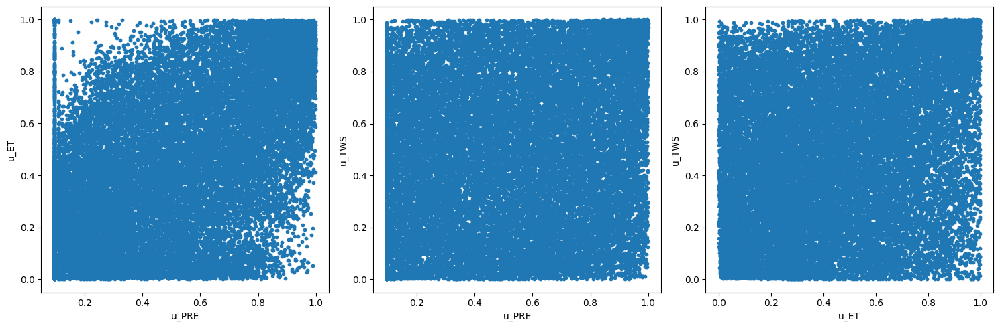

In [39]:
# Plot scatter plots of sampled data
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].scatter(copula_data[:, 0], copula_data[:, 1], s=10)
axes[0].set_xlabel('u_PRE')
axes[0].set_ylabel('u_ET')
axes[1].scatter(copula_data[:, 0], copula_data[:, 2], s=10)
axes[1].set_xlabel('u_PRE')
axes[1].set_ylabel('u_TWS')
axes[2].scatter(copula_data[:, 1], copula_data[:, 2], s=10)
axes[2].set_xlabel('u_ET')
axes[2].set_ylabel('u_TWS')
plt.tight_layout()
plt.show()

In [52]:
#  Step 7: Fit Copulas
subregion_id = 1

# Define Copulas (assuming these are from a library like 'copulae')
copulas = {
    'Gaussian': GaussianCopula(dim=3),
    'Clayton': ClaytonCopula(dim=3),
    'Frank': FrankCopula(dim=3),
    'Gumbel': GumbelCopula(dim=3),
    'tCopula': StudentCopula(dim=3)
}

# Fit Copulas
results = {}
for name, copula in copulas.items():
    try:
        print(f'Fitting {name}...')
        start_time = time.time()
        copula.fit(copula_data)  # Assuming copula_data is defined elsewhere
        log_likelihood = copula.log_lik(copula_data)
        # Calculate AIC: -2 * log_likelihood + 2 * number_of_parameters
        num_params = copula.dim  # Adjust based on your copula library's parameter count
        aic = -2 * log_likelihood + 2 * num_params
        results[name] = {'copula': copula, 'log_likelihood': log_likelihood, 'AIC': aic}
        print(f"{name} Copula fitted for subregion {subregion_id}, log-likelihood: {log_likelihood:.2f}")
    except Exception as e:
        print(f"Failed to fit {name} Copula: {e}")

# Select best copula
if results:
    best_copula_name = max(results, key=lambda x: results[x]['log_likelihood'])  # Fixed key
    best_copula = results[best_copula_name]['copula']
    print(f"Best copula (by AIC): {best_copula_name} (AIC: {results[best_copula_name]['AIC']:.2f})")
else:
    print("No copulas were successfully fitted to the data.")


# Total runtime
end_time = time.time()
print(f"Total runtime: {end_time - start_time:.2f} seconds.")

Fitting Gaussian...
Gaussian Copula fitted for subregion 1, log-likelihood: 5164.03
Fitting Clayton...
Clayton Copula fitted for subregion 1, log-likelihood: 1507.97
Fitting Frank...
Frank Copula fitted for subregion 1, log-likelihood: 3399.85
Fitting Gumbel...
Gumbel Copula fitted for subregion 1, log-likelihood: 3910.27
Fitting tCopula...
tCopula Copula fitted for subregion 1, log-likelihood: 5249.39
Best copula (by AIC): tCopula (AIC: -10492.78)
Total runtime: 394.46 seconds.


#### Z-score standardisation approach

In [12]:
# Normalize raw data by subtracting mean and dividing by standard deviation
stats_dict = {}
normalized_dict = {}
for var in ['precipitation', 'et', 'tws']:
    
    data = zone_1[var].compute()
    mean = data.mean().compute()
    std = data.std().compute()
    mean = float(mean)
    std = float(std)
    std = max(std, 1e-6)  # Avoid division by zero
    stats_dict[var] = {'mean': mean, 'std': std}  
    print(f"Statistics for {var}: mean={mean:.4f}, std={std:.4f}")

    # Normalize: (data - mean) / std
    normalized_data = (data - mean) / std
    normalized_dict[var] = normalized_data

Statistics for precipitation: mean=1.3219, std=2.1857
Statistics for et: mean=0.9219, std=1.1714
Statistics for tws: mean=5.7685, std=56.9432


<AxesSubplot: ylabel='Count'>

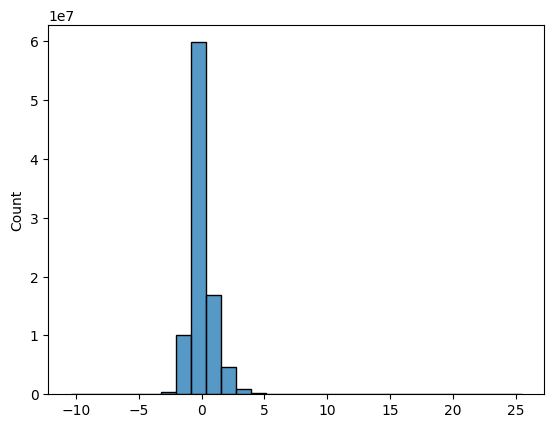

In [22]:
eta = zone_1_stacked['et'].values[~np.isnan(zone_1_stacked['et'].values)]
sns.histplot(eta, bins=30)

/home/jovyan/.local/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/home/jovyan/.local/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)


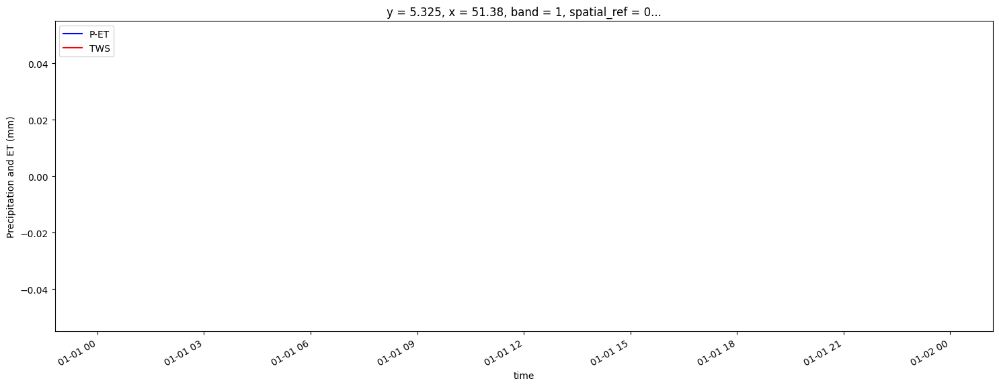

In [27]:
# Set up the figure
plt.figure(figsize=(18, 6))

# Create the first axis for ppt and et2.239800447168621, 44.209413834531375
ax1 = plt.gca()  # Get current axis
zone_1_stacked['et_ema120'].sel(y=5.30, x=57.76, method='nearest').plot(ax=ax1, label='P-ET', color='blue')
# zone_1_stacked['et'].sel(y=6.30, x=47.76, method='nearest').plot(ax=ax1, label='ET', color='green')
# zone_1_stacked['precipitation'].sel(y=6.30, x=47.76, method='nearest').plot(ax=ax1, label='Precipitation', color='yellow')
zone_1_stacked['tws'].sel(y=5.30, x=57.76, method='nearest').plot(ax=ax1, label='TWS', color='red')
# zone_1_stacked['et'].sel(y=0, x=40, method='nearest').plot(ax=ax1, label='ET', color='green')

# Customize the first axis
ax1.set_ylabel('Precipitation and ET (mm)')  # Assuming ppt and et are in mm
ax1.legend(loc='upper left')

# Create the second axis for tws
# ax2 = ax1.twinx()
# zone_1_stacked['tws'].sel(y=2.23, x=44.20, method='nearest').plot(ax=ax2, label='TWS', color='red')

# # Customize the second axis
# ax2.set_ylabel('TWS (unit)')  # Replace 'unit' with the actual unit of tws
# ax2.legend(loc='upper right')
# plt.ylim(-4, 8)
# Show the plot
plt.show()

/home/jovyan/.local/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


<AxesSubplot: ylabel='Count'>

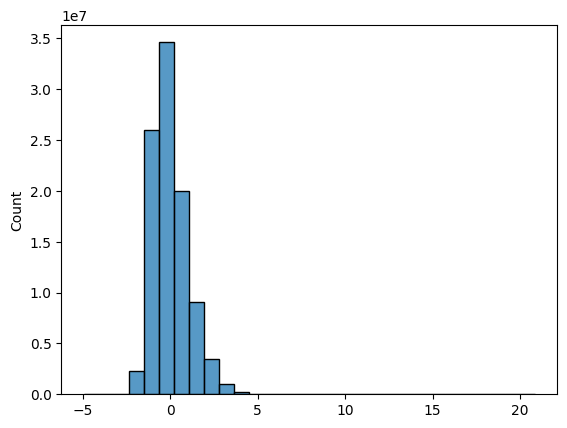

In [28]:
pa = zone_1_stacked['p_ema120'].values[~np.isnan(zone_1_stacked['p_ema120'].values)]
sns.histplot(pa, bins=30)

### Using `Raw data`

##### Uniform `np.linspace` Sampling

### Develop the Index

In [ ]:

# common_mask = (tws_cdf.notnull() & precip_cdf.notnull() & et_cdf.notnull()).values
    
data_for_cdf = pd.DataFrame({
        'tws': tws_cdf,
        'precip': precip_cdf,
        'et': et_cdf
})
joint_cdf = best_copula.cdf(data_for_cdf)
joint_cdf = np.clip(joint_cdf, 0.001, 0.999)
drought_index = stats.norm.ppf(joint_cdf)
    
    # Create the subregion drought index
full_drought_index = xr.DataArray(
        np.full(stacked_data['tws_cdf'].shape, np.nan),
        coords={'all_points': stacked_data.coords['all_points']},
        dims=['all_points']
    )
full_drought_index.values = drought_index
    
drought_index_da = full_drought_index.unstack()
print(f"Drought index computed for subregion {subregion_id} using {best_copula.__class__.__name__}")


NameError: name 'norm' is not defined

In [ ]:
drought_index = stats.norm.ppf(joint_cdf)
    
    # Create the subregion drought index
full_drought_index = xr.DataArray(
        np.full(stacked_data['tws_anom'].shape, np.nan),
        coords={'all_points': stacked_data.coords['all_points']},
        dims=['all_points']
    )
full_drought_index.values = drought_index
    
drought_index_da = full_drought_index.unstack()
print(f"Drought index computed for subregion {subregion_id} using {best_copula.__class__.__name__}")


AttributeError: 'dict' object has no attribute 'coords'

In [ ]:
drought_index_da.values.max()

3.090232306167813

In [139]:
full_drought_index = xr.DataArray(
        np.full(stacked_dat['tws_anom'].shape, np.nan),
        coords={'all_points': stacked_dat.coords['all_points']},
        dims=['all_points']
    )
full_drought_index.values = drought_index
    
drought_index_da = full_drought_index.unstack()
print(f"Drought index computed for subregion {subregion_id} using {best_copula.__class__.__name__}")

Drought index computed for subregion 1 using GaussianCopula


In [136]:
stacked_dat = zone_1[['tws_anom', 'precip_anom', 'et_anom']].stack(all_points=['time', 'y', 'x'])

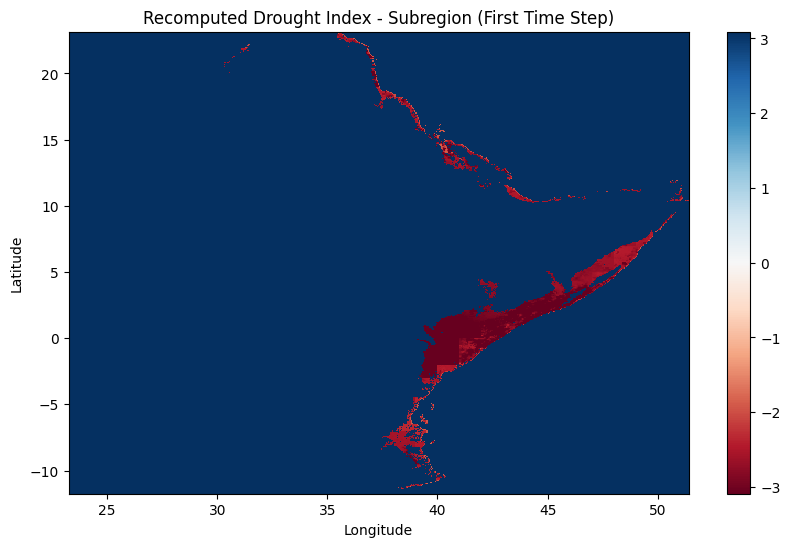

In [169]:
# Visualize
plt.figure(figsize=(10, 6))
drought_index_da.isel(time=700).plot(cmap='RdBu', )
plt.title(f"Recomputed Drought Index - Subregion (First Time Step)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()


NameError: name 'first_subregion_id' is not defined

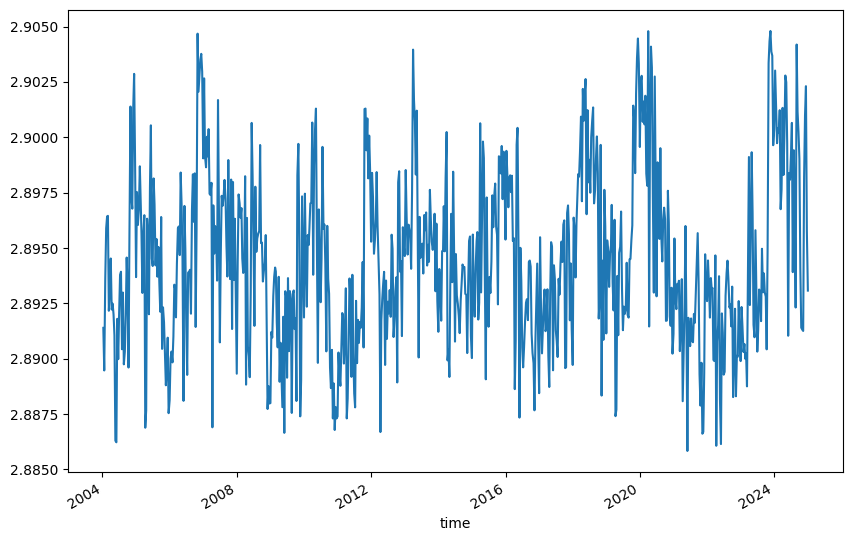

In [141]:
plt.figure(figsize=(10, 6))
drought_index_da.mean(dim=['y', 'x']).plot()
plt.title(f"Recomputed Drought Index Time Series - Subregion {first_subregion_id}")
plt.xlabel("Time")
plt.ylabel("Drought Index")
plt.ylim(-3, 3)  # Set y-axis limits to -3 and 3
plt.grid(True)
plt.show()

#### Fit Different Copulas

In [162]:
# Copula fitting for Zone 1
subregion_id = 1

# Extract ECDF values
precip_ecdf = ecdf_dict['precip_ecdf'].values
et_ecdf = ecdf_dict['et_ecdf'].values
tws_ecdf = ecdf_dict['tws_ecdf'].values

# Verify lengths
print(f"Subregion {subregion_id} ECDF lengths: precip={len(precip_ecdf)}, et={len(et_ecdf)}, tws={len(tws_ecdf)}")

# Combine into (200, 3) array
copula_data = np.vstack([precip_ecdf, et_ecdf, tws_ecdf]).T
print(f"Copula data shape: {copula_data.shape}")

Subregion 1 ECDF lengths: precip=200, et=200, tws=200
Copula data shape: (200, 3)


In [216]:
subregion_id = 1
# Define Copulas
copulas = {
        'Gaussian': GaussianCopula(dim=3),
        'Clayton': ClaytonCopula(dim=3),
        'Frank': FrankCopula(dim=3),
        'Gumbel': GumbelCopula(dim=3),
        'tCopula': StudentCopula(dim=3)
}

# Fit Copulas
results = {}
for name, copula in copulas.items():
    try:
        print(f'Fitting {name}...')
        copula.fit(copula_data)
        log_likelihood = copula.log_lik(copula_data)
        fit_results[name] = {'copula': copula, 'log_likelihood': log_likelihood}
        print(f"{name} Copula fitted for subregion {subregion_id}, log-likelihood: {log_likelihood:.2f}")
    except Exception as e:
        print(f"Failed to fit {name} Copula: {e}")
    
    # Select best Copula (highest log-likelihood)
#     best_copula_name = max(fit_results, key=lambda k: fit_results[k]['log_likelihood'])
#     best_copula = fit_results[best_copula_name]['copula']
#     print(f"Best Copula for subregion Zone: {best_copula_name}")

#     print(f"Skipping Copula fitting for this zone due to invalid ECDFs")
#     #     log_lik = copula.log_lik(copula_data)
    #     if name in ['Clayton', 'Gumbel', 'Frank']:
    #             n_params = np.array(copula.params).size
    #     elif name == 'Gaussian':
    #         n_params = copula.params.size
    #         aic = -2 * log_lik + 2 * n_params
    #         bic = -2 * log_lik + np.log(copula_data.shape[0]) * n_params
    #         results[name] = {
    #             "Log-Likelihood": log_lik,
    #             "AIC": aic,
    #             "BIC": bic,
    #             "Parameters": copula.params,
    #             "copula": copula
    #         }
    #         print(f"{name} Copula: Log-Likelihood={log_lik:.2f}, AIC={aic:.2f}, BIC={bic:.2f}")
    # except Exception as e:
    #         print(f"Error fitting {name} copula: {e}")
    #         results[name] = {
    #             "Log-Likelihood": -np.inf,
    #             "AIC": np.inf,
    #             "BIC": np.inf,
    #             "Parameters": None,
    #             "copula": None
    #         }
# Select best Copula (highest log-likelihood)
best_copula_name = max(results, key=lambda x: results[x]['Log-Likelihood'])
best_copula = results[best_copula_name]['copula']
print(f"Best copula (by AIC): {best_copula_name} (AIC: {results[best_copula_name]['AIC']:.2f})")
#     return best_copula, results

# print(f"Best Copula for subregion Zone: {best_copula_name}")

Fitting Gaussian...
Gaussian Copula fitted for subregion 1, log-likelihood: 0.29
Fitting Clayton...
Failed to fit Clayton Copula: theta must be positive when dim > 2
Fitting Frank...
Failed to fit Frank Copula: theta must be positive when dim > 2
Fitting Gumbel...


/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:165: UserWarning: For the Gumbel copula, tau must be >= 0. Replacing negative values by 0.
  warnings.warn(warning_message)


Gumbel Copula fitted for subregion 1, log-likelihood: 0.00
Fitting tCopula...
tCopula Copula fitted for subregion 1, log-likelihood: -2.38


ValueError: max() arg is an empty sequence

In [ ]:
# Select best Copula
if fit_results:
    best_copula_name = max(fit_results, key=lambda k: fit_results[k]['log_likelihood'])
    best_copula = fit_results[best_copula_name]['copula']
    print(f"Best Copula for subregion {subregion_id}: {best_copula_name}")
    
    # Joint drought probability (P(U1 < 0.2, U2 < 0.2, U3 < 0.2))
    joint_prob = best_copula.cdf([0.2, 0.2, 0.2])
    print(f"Subregion {subregion_id} joint drought probability: {joint_prob:.4f}")
else:
    print(f"No successful Copula fits for subregion {subregion_id}")

No successful Copula fits for subregion 1


In [205]:
ecdf_dict = {'functions': {}}  # Store ECDF functions separately
samples_dict = {}             # Store uniform samples (for copula)

for var in ['precip_anom', 'et_anom', 'tws_anom']:
    stacked = zone_1[var].compute().values.flatten()
    stacked = stacked[~np.isnan(stacked)]
    
    if len(stacked) == 0:
        print(f"Warning: No valid data for {var} in Zone")
        # Default values (if no data)
        samples_dict[f'{var}_uniform'] = np.full(200, np.nan)
    else:
        print(f"Subregion Zone - {var} valid points: {len(stacked)}")
        ecdf_func = ECDF(stacked)
        ecdf_dict['functions'][f'{var}_ecdf'] = ecdf_func  # Store the ECDF callable
        
        # Generate 200 uniform samples by applying ECDF to raw data
        if len(stacked) >= 200:
            # Case 1: Sample 200 points from existing data
            subset_idx = np.random.choice(len(stacked), 200, replace=False)
            samples = stacked[subset_idx]
        else:
            # Case 2: If fewer than 200 points, reuse data (with replacement)
            subset_idx = np.random.choice(len(stacked), 200, replace=True)
            samples = stacked[subset_idx]
        
        # Transform to uniform margins [0, 1]
        samples_dict[f'{var}_uniform'] = ecdf_func(samples)

# Convert to xarray Dataset for convenience
uniform_samples_ds = xr.Dataset(
    {k: xr.DataArray(v, dims=['sample']) for k, v in samples_dict.items()}
)
print("Uniform samples for copula:")
print(uniform_samples_ds)

Subregion Zone - precip_anom valid points: 96562548
Subregion Zone - et_anom valid points: 93279332
Subregion Zone - tws_anom valid points: 48801181
Uniform samples for copula:
<xarray.Dataset>
Dimensions:              (sample: 200)
Dimensions without coordinates: sample
Data variables:
    precip_anom_uniform  (sample) float64 0.1042 0.2876 0.01063 ... 0.137 0.6762
    et_anom_uniform      (sample) float64 0.4595 0.7938 ... 0.1124 0.03543
    tws_anom_uniform     (sample) float64 0.9625 0.02484 ... 0.6908 0.4306


In [ ]:
copula_data = np.column_stack([
    ecdf_dict['precip_ecdf'].values,
    ecdf_dict['et_ecdf'].values,
    ecdf_dict['tws_ecdf'].values
])

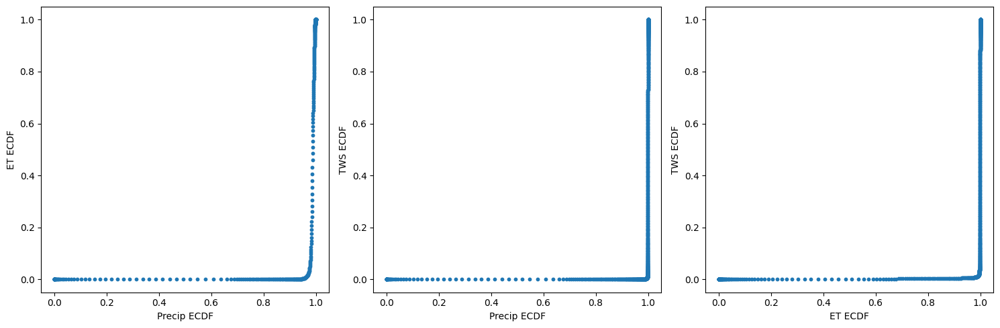

In [92]:
# Visualize dependence
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].scatter(copula_data[:, 0], copula_data[:, 1], s=10)
axes[0].set_xlabel('Precip ECDF')
axes[0].set_ylabel('ET ECDF')
axes[1].scatter(copula_data[:, 0], copula_data[:, 2], s=10)
axes[1].set_xlabel('Precip ECDF')
axes[1].set_ylabel('TWS ECDF')
axes[2].scatter(copula_data[:, 1], copula_data[:, 2], s=10)
axes[2].set_xlabel('ET ECDF')
axes[2].set_ylabel('TWS ECDF')
plt.tight_layout()
plt.show()

In [130]:
sample = best_copula.random(2000)

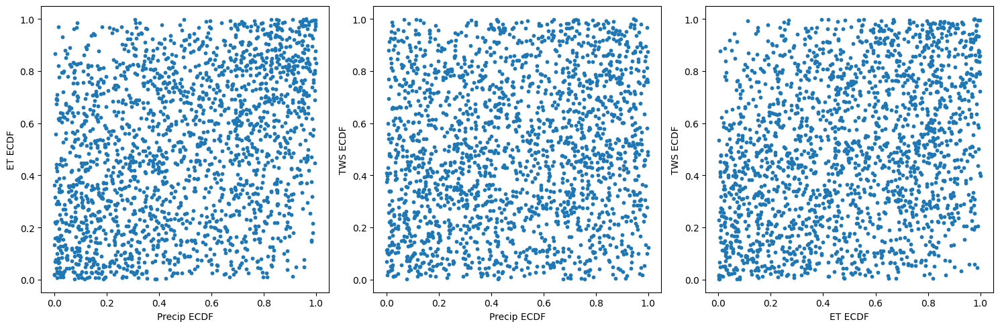

In [131]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].scatter(sample[:,0], sample[:,1], s=10)
axes[0].set_xlabel('Precip ECDF')
axes[0].set_ylabel('ET ECDF')
axes[1].scatter(sample[:,0], sample[:,2], s=10)
axes[1].set_xlabel('Precip ECDF')
axes[1].set_ylabel('TWS ECDF')
axes[2].scatter(sample[:,1], sample[:,2], s=10)
axes[2].set_xlabel('ET ECDF')
axes[2].set_ylabel('TWS ECDF')
plt.tight_layout()
plt.show()

####  Simulate and Validate Copula

Subregion Zone - precip_anom valid points: 96562548
Subregion Zone - et_anom valid points: 93279332
Subregion Zone - tws_anom valid points: 48801181


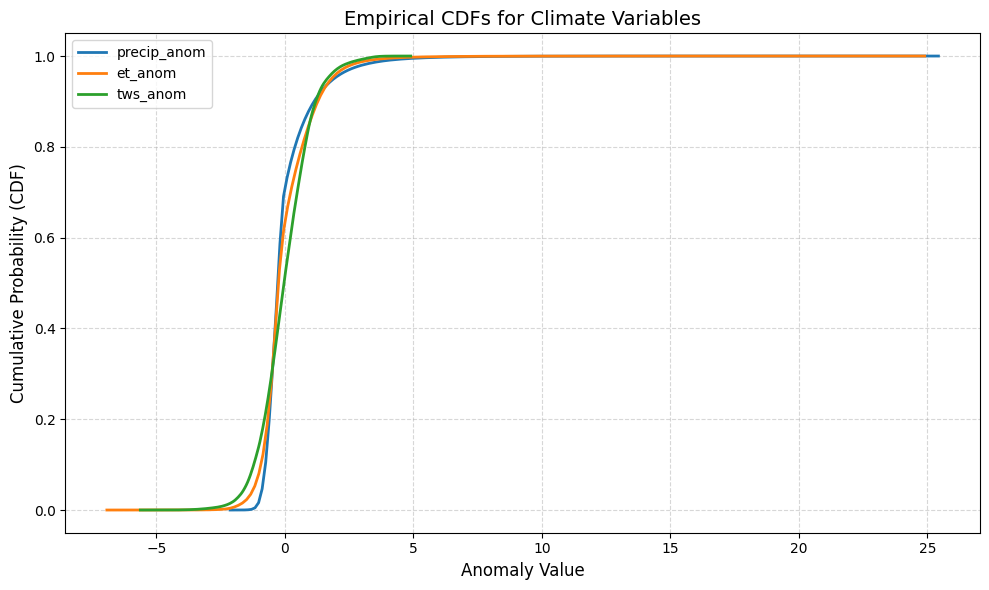

In [174]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import plotly.express as px
from statsmodels.distributions.empirical_distribution import ECDF

# ----------------------------------------------------------------------------
# Step 1: Load your data and compute ECDFs + uniform samples
# ----------------------------------------------------------------------------
# Assuming zone_1 is your xarray Dataset with variables: precip_anom, et_anom, tws_anom

ecdf_dict = {'functions': {}}  # Store ECDF functions
samples_dict = {}              # Store uniform samples (for copula)

for var in ['precip_anom', 'et_anom', 'tws_anom']:
    stacked = zone_1[var].compute().values.flatten()
    stacked = stacked[~np.isnan(stacked)]  # Remove NaNs
    
    if len(stacked) == 0:
        print(f"Warning: No valid data for {var} in Zone")
        samples_dict[f'{var}_uniform'] = np.full(200, np.nan)
    else:
        print(f"Subregion Zone - {var} valid points: {len(stacked)}")
        ecdf_func = ECDF(stacked)
        ecdf_dict['functions'][f'{var}_ecdf'] = ecdf_func
        
        # Generate 200 uniform samples
        if len(stacked) >= 200:
            subset_idx = np.random.choice(len(stacked), 200, replace=False)
            samples = stacked[subset_idx]
        else:
            subset_idx = np.random.choice(len(stacked), 200, replace=True)
            samples = stacked[subset_idx]
        
        samples_dict[f'{var}_uniform'] = ecdf_func(samples)

# Convert to xarray Dataset
uniform_samples_ds = xr.Dataset(
    {k: xr.DataArray(v, dims=['sample']) for k, v in samples_dict.items()}
)

# ----------------------------------------------------------------------------
# Step 2: Generate points for plotting CDFs
# ----------------------------------------------------------------------------
plot_data = {}
for var in ['precip_anom', 'et_anom', 'tws_anom']:
    if f'{var}_ecdf' in ecdf_dict['functions']:
        ecdf_func = ecdf_dict['functions'][f'{var}_ecdf']
        stacked = zone_1[var].compute().values.flatten()
        stacked = stacked[~np.isnan(stacked)]
        x_points = np.linspace(np.min(stacked), np.max(stacked), 200)
        y_values = ecdf_func(x_points)
        plot_data[var] = (x_points, y_values)

# ----------------------------------------------------------------------------
# Step 3: Plot CDFs (Matplotlib)
# ----------------------------------------------------------------------------
plt.figure(figsize=(10, 6))
for var, (x, y) in plot_data.items():
    plt.plot(x, y, label=var, linewidth=2)

plt.xlabel('Anomaly Value', fontsize=12)
plt.ylabel('Cumulative Probability (CDF)', fontsize=12)
plt.title('Empirical CDFs for Climate Variables', fontsize=14)
plt.legend(fontsize=10)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.savefig('cdfs_matplotlib.png', dpi=300)  # Save high-res version
plt.show()

### ECDF with `Chunks`

In [ ]:
# Compute 200-point ECDFs
ecdf_ds_list = []
for subregion_id in landform_classes[:2]:
    if np.isnan(subregion_id):
        continue
    print(f"Computing ECDF for subregion {subregion_id}...")
    subregion_data = all_subregions_ds.sel(subregion=int(subregion_id))
    
    ecdf_dict = {}
    for var in ['precip_anom', 'et_anom', 'tws_anom']:
        stacked = subregion_data[var].values.flatten()
        stacked = stacked[~np.isnan(stacked)]
        
        if len(stacked) == 0:
            print(f"Warning: No valid data for {var} in subregion {subregion_id}")
            ecdf_values = np.full(200, np.nan)
            anom_points = np.linspace(-1, 1, 200)
        else:
            ecdf_func = ECDF(stacked)
            anom_min, anom_max = np.nanmin(stacked), np.nanmax(stacked)
            anom_points = np.linspace(anom_min, anom_max, 200)
            ecdf_values = ecdf_func(anom_points)
        
        ecdf_dict[f'{var.split("_")[0]}_ecdf'] = xr.DataArray(
            ecdf_values,
            coords={'ecdf_points': anom_points},
            dims=['ecdf_points']
        )
    
    subregion_ecdf_ds = xr.Dataset(ecdf_dict).assign_coords(subregion=int(subregion_id)).expand_dims('subregion')
    ecdf_ds_list.append(subregion_ecdf_ds)

# Combine ECDFs
all_ecdf_ds = xr.concat(ecdf_ds_list, dim='subregion')
print("ECDF dataset:")
print(all_ecdf_ds)


Computing ECDF for subregion 1.0...
Computing ECDF for subregion 2.0...


/usr/local/lib/python3.8/dist-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)


In [ ]:
# Plot ECDFs in one row (2 subregions × 3 variables = 6 subplots)
fig, axes = plt.subplots(1, 6, figsize=(30, 5), sharey=True)
for i, subregion_id in enumerate(landform_classes[:2]):
    if np.isnan(subregion_id):
        continue
    subregion_data = all_ecdf_ds.sel(subregion=int(subregion_id))
    
    for j, (var, label) in enumerate([('precip_ecdf', 'Precip'), ('et_ecdf', 'ET'), ('tws_ecdf', 'TWS')]):
        ax = axes[i * 3 + j]
        subregion_data[var].plot(ax=ax, label=label)
        ax.set_title(f"Subregion {int(subregion_id)} - {label}")
        ax.set_xlabel("Anomaly Value")
        if j == 0:
            ax.set_ylabel("ECDF")
        ax.legend()

plt.tight_layout()
plt.show()

In [ ]:
# Save ECDF dataset
ecdf_output_file = os.path.join(output_dir, 'cdfs/all_subregions_ecdf_200.nc')
all_ecdf_ds.to_netcdf(ecdf_output_file)
print(f"Saved ECDFs to {ecdf_output_file}")

#### Load the saved CDFs

In [ ]:
# Load ECDF dataset
ecdf_file = os.path.join(output_dir, 'cdfs/all_subregions_ecdf_200.nc'
all_ecdf_ds = xr.open_dataset(ecdf_file)

# Verify loaded data
print("Loaded ECDF dataset:")
print(all_ecdf_ds)

# Extract subregion IDs
subregion_ids = all_ecdf_ds['subregion'].values

# Prepare data for Copula fitting (example: subregion 1)
subregion_id = 1
precip_ecdf = all_ecdf_ds['precip_ecdf'].sel(subregion=subregion_id).values
et_ecdf = all_ecdf_ds['et_ecdf'].sel(subregion=subregion_id).values
tws_ecdf = all_ecdf_ds['tws_ecdf'].sel(subregion=subregion_id).values

# Check for NaNs
if np.any(np.isnan(precip_ecdf)) or np.any(np.isnan(et_ecdf)) or np.any(np.isnan(tws_ecdf)):
    print(f"Warning: NaNs detected in subregion {subregion_id} ECDFs, handling required")

<h3 style="text-align:center;">End of Code</h3>

In [143]:
# Get the first subregion ID and dataset
first_subregion_id = list(subregion_datasets.keys())[0]
ds = subregion_datasets[first_subregion_id]
print(f"Testing subregion: {first_subregion_id}")

Testing subregion: 1.0


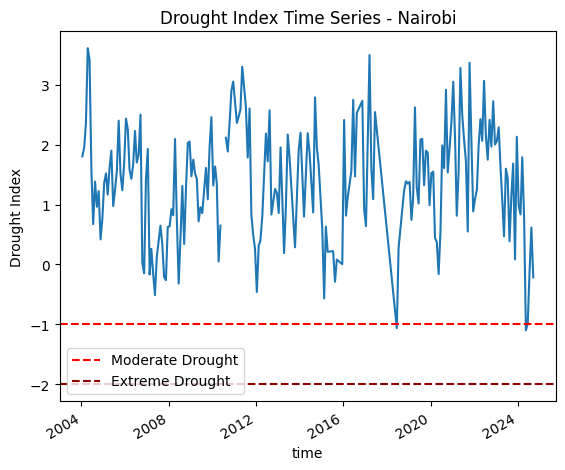

In [ ]:
drought_index_standardized.sel(y=0, x=42, method="nearest").plot()
plt.title("Drought Index Time Series - Nairobi")
plt.axhline(y=-1, color='r', linestyle='--', label="Moderate Drought")
plt.axhline(y=-2, color='darkred', linestyle='--', label="Extreme Drought")
plt.legend()
plt.show()

## Reference Subregional Approach

In [168]:
# Function to test and select the best copula
def fit_best_copula(tws_cdf, precip_cdf, et_cdf):
    uniform_data = pd.DataFrame({
        'tws': tws_cdf.values,
        'precip': precip_cdf.values,
        'et': et_cdf.values
    }).dropna()
    
    copulas = {
        'Gaussian': GaussianCopula(dim=3),
        'Clayton': ClaytonCopula(dim=3),
        'Frank': FrankCopula(dim=3),
        'Gumbel': GumbelCopula(dim=3),
        'tCopula': StudentCopula(dim=3)
    }
    
    results = {}
    for name, copula in copulas.items():
        try:
            copula.fit(uniform_data)
            log_lik = copula.log_lik(uniform_data)
            if name in ['Clayton', 'Gumbel', 'Frank']:
                n_params = np.array(copula.params).size
            elif name == 'Gaussian':
                n_params = copula.params.size
            aic = -2 * log_lik + 2 * n_params
            bic = -2 * log_lik + np.log(uniform_data.shape[0]) * n_params
            results[name] = {
                "Log-Likelihood": log_lik,
                "AIC": aic,
                "BIC": bic,
                "Parameters": copula.params,
                "copula": copula
            }
            print(f"{name} Copula: Log-Likelihood={log_lik:.2f}, AIC={aic:.2f}, BIC={bic:.2f}")
        except Exception as e:
            print(f"Error fitting {name} copula: {e}")
            results[name] = {
                "Log-Likelihood": -np.inf,
                "AIC": np.inf,
                "BIC": np.inf,
                "Parameters": None,
                "copula": None
            }
    
    best_copula_name = min(results, key=lambda x: results[x]['AIC'])
    best_copula = results[best_copula_name]['copula']
    print(f"Best copula (by AIC): {best_copula_name} (AIC: {results[best_copula_name]['AIC']:.2f})")
    return best_copula, results


In [170]:
# Function to compute drought index
def compute_copula_index(ds):
    stacked_data = ds[['tws_cdf', 'precip_cdf', 'et_cdf']].stack(all_points=['time', 'y', 'x'])
    
    # Extract CDF values
    tws_cdf = stacked_data['tws_cdf']
    precip_cdf = stacked_data['precip_cdf']
    et_cdf = stacked_data['et_cdf']
    
    best_copula, copula_results = fit_best_copula(tws_cdf, precip_cdf, et_cdf)
    
    return best_copula, copula_results

In [169]:
best_copulas = {}
copula_metrics = {}
for subregion_id, ds in subregion_datasets.items():
    # Compute ECDFs once
    tws_cdf, precip_cdf, et_cdf = compute_ecdf_statsmodels_consistent(ds)
    ds['tws_cdf'] = tws_cdf
    ds['precip_cdf'] = precip_cdf
    ds['et_cdf'] = et_cdf
    subregion_datasets[subregion_id] = ds
    
    # Fit copula using precomputed CDFs
    best_copula = fit_best_copula(tws_cdf, precip_cdf, et_cdf)
    best_copulas[subregion_id] = best_copula
    copula_metrics[subregion_id] = copula_results

ValueError: Per-column arrays must each be 1-dimensional

In [171]:
# Process all subregions and store results
best_copulas = {}
copula_metrics = {}
for subregion_id, ds in subregion_datasets.items():
    print(f"Processing subregion: {subregion_id}")
    # drought_index, best_copula, copula_results = compute_copula_index(ds)
    # ds['drought_index'] = drought_index
    best_copula, copula_results = compute_copula_index(ds)
    subregion_datasets[subregion_id] = ds
    best_copulas[subregion_id] = best_copula
    copula_metrics[subregion_id] = copula_results


Processing subregion: 1.0
                tws        precip            et
count  1.390176e+06  1.390176e+06  1.390176e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    7.193329e-07  7.193329e-07  7.193329e-07
25%    2.500004e-01  2.500004e-01  2.500004e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499996e-01  7.499996e-01  7.499996e-01
max    9.999993e-01  9.999993e-01  9.999993e-01
Gaussian Copula: Log-Likelihood=62230.99, AIC=-124455.98, BIC=-124419.55
                tws        precip            et
count  1.390176e+06  1.390176e+06  1.390176e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    7.193329e-07  7.193329e-07  7.193329e-07
25%    2.500004e-01  2.500004e-01  2.500004e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499996e-01  7.499996e-01  7.499996e-01
max    9.999993e-01  9.999993e-01  9.999993e-01
Clayton Copula: Log-Likelihood=12341.

/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:165: UserWarning: For the Gumbel copula, tau must be >= 0. Replacing negative values by 0.
  warnings.warn(warning_message)


                tws        precip            et
count  1.390176e+06  1.390176e+06  1.390176e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    7.193329e-07  7.193329e-07  7.193329e-07
25%    2.500004e-01  2.500004e-01  2.500004e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499996e-01  7.499996e-01  7.499996e-01
max    9.999993e-01  9.999993e-01  9.999993e-01


/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=23103.53, AIC=-46205.07, BIC=-46192.92
Error fitting tCopula copula: Unable to allocate 14.1 TiB for an array with shape (1390176, 1390176) and data type float64
Best copula (by AIC): Gaussian (AIC: -124455.98)
Processing subregion: 2.0
                tws        precip            et
count  1.183291e+07  1.183291e+07  1.183291e+07
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    8.451004e-08  8.451004e-08  8.451004e-08
25%    2.500000e-01  2.500000e-01  2.500000e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.500000e-01  7.500000e-01  7.500000e-01
max    9.999999e-01  9.999999e-01  9.999999e-01
Gaussian Copula: Log-Likelihood=15855.36, AIC=-31704.73, BIC=-31661.87
                tws        precip            et
count  1.183291e+07  1.183291e+07  1.183291e+07
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    8.451004e-08  8.451004e-08  8.4

/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:165: UserWarning: For the Gumbel copula, tau must be >= 0. Replacing negative values by 0.
  warnings.warn(warning_message)


                tws        precip            et
count  1.183291e+07  1.183291e+07  1.183291e+07
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    8.451004e-08  8.451004e-08  8.451004e-08
25%    2.500000e-01  2.500000e-01  2.500000e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.500000e-01  7.500000e-01  7.500000e-01
max    9.999999e-01  9.999999e-01  9.999999e-01


/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=10683.98, AIC=-21365.95, BIC=-21351.67
Error fitting tCopula copula: Unable to allocate 1019. TiB for an array with shape (11832912, 11832912) and data type float64
Best copula (by AIC): Clayton (AIC: -70997421.63)
Processing subregion: 3.0
                tws        precip            et
count  1.278634e+07  1.278634e+07  1.278634e+07
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    7.820848e-08  7.820848e-08  7.820848e-08
25%    2.500000e-01  2.500000e-01  2.500000e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.500000e-01  7.500000e-01  7.500000e-01
max    9.999999e-01  9.999999e-01  9.999999e-01
Gaussian Copula: Log-Likelihood=13447.63, AIC=-26889.25, BIC=-26846.16
                tws        precip            et
count  1.278634e+07  1.278634e+07  1.278634e+07
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    7.820848e-08  7.820848e-08 

/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=14188.07, AIC=-28374.13, BIC=-28359.77
Error fitting tCopula copula: Unable to allocate 1.16 PiB for an array with shape (12786336, 12786336) and data type float64
Best copula (by AIC): Gumbel (AIC: -28374.13)
Processing subregion: 4.0
                tws        precip            et
count  3.183624e+06  3.183624e+06  3.183624e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    3.141073e-07  3.141073e-07  3.141073e-07
25%    2.500002e-01  2.500002e-01  2.500002e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499998e-01  7.499998e-01  7.499998e-01
max    9.999997e-01  9.999997e-01  9.999997e-01
Gaussian Copula: Log-Likelihood=13175.95, AIC=-26345.91, BIC=-26306.99
                tws        precip            et
count  3.183624e+06  3.183624e+06  3.183624e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    3.141073e-07  3.141073e-07  3.14

/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=10086.22, AIC=-20170.44, BIC=-20157.46
Error fitting tCopula copula: Unable to allocate 73.7 TiB for an array with shape (3183624, 3183624) and data type float64
Best copula (by AIC): Gaussian (AIC: -26345.91)
Processing subregion: 5.0
                tws        precip            et
count  3.338712e+06  3.338712e+06  3.338712e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    2.995166e-07  2.995166e-07  2.995166e-07
25%    2.500001e-01  2.500001e-01  2.500001e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499999e-01  7.499999e-01  7.499999e-01
max    9.999997e-01  9.999997e-01  9.999997e-01
Gaussian Copula: Log-Likelihood=4805.97, AIC=-9605.95, BIC=-9566.89
                tws        precip            et
count  3.338712e+06  3.338712e+06  3.338712e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    2.995166e-07  2.995166e-07  2.99516

/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=9508.60, AIC=-19015.20, BIC=-19002.18
Error fitting tCopula copula: Unable to allocate 81.1 TiB for an array with shape (3338712, 3338712) and data type float64
Best copula (by AIC): Gumbel (AIC: -19015.20)
Processing subregion: 6.0
                tws        precip            et
count  1.136160e+06  1.136160e+06  1.136160e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    8.801569e-07  8.801569e-07  8.801569e-07
25%    2.500004e-01  2.500004e-01  2.500004e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499996e-01  7.499996e-01  7.499996e-01
max    9.999991e-01  9.999991e-01  9.999991e-01
Gaussian Copula: Log-Likelihood=2074.84, AIC=-4143.68, BIC=-4107.85
Error fitting Clayton copula: theta must be positive when dim > 2
Error fitting Frank copula: theta must be positive when dim > 2


/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:165: UserWarning: For the Gumbel copula, tau must be >= 0. Replacing negative values by 0.
  warnings.warn(warning_message)


                tws        precip            et
count  1.136160e+06  1.136160e+06  1.136160e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    8.801569e-07  8.801569e-07  8.801569e-07
25%    2.500004e-01  2.500004e-01  2.500004e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499996e-01  7.499996e-01  7.499996e-01
max    9.999991e-01  9.999991e-01  9.999991e-01


/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=1457.27, AIC=-2912.53, BIC=-2900.59
Error fitting tCopula copula: Unable to allocate 9.39 TiB for an array with shape (1136160, 1136160) and data type float64
Best copula (by AIC): Gaussian (AIC: -4143.68)
Processing subregion: 7.0
                tws        precip            et
count  1.093176e+06  1.093176e+06  1.093176e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    9.147649e-07  9.147649e-07  9.147649e-07
25%    2.500005e-01  2.500005e-01  2.500005e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499995e-01  7.499995e-01  7.499995e-01
max    9.999991e-01  9.999991e-01  9.999991e-01
Gaussian Copula: Log-Likelihood=604.36, AIC=-1202.72, BIC=-1167.00
                tws        precip            et
count  1.093176e+06  1.093176e+06  1.093176e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    9.147649e-07  9.147649e-07  9.147649e-07

/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=1151.15, AIC=-2300.29, BIC=-2288.39
Error fitting tCopula copula: Unable to allocate 8.70 TiB for an array with shape (1093176, 1093176) and data type float64
Best copula (by AIC): Gumbel (AIC: -2300.29)
Processing subregion: 8.0
                tws        precip            et
count  2.579904e+06  2.579904e+06  2.579904e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    3.876112e-07  3.876112e-07  3.876112e-07
25%    2.500002e-01  2.500002e-01  2.500002e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499998e-01  7.499998e-01  7.499998e-01
max    9.999996e-01  9.999996e-01  9.999996e-01
Gaussian Copula: Log-Likelihood=457.11, AIC=-908.22, BIC=-869.93
                tws        precip            et
count  2.579904e+06  2.579904e+06  2.579904e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    3.876112e-07  3.876112e-07  3.876112e-07
25%

/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:165: UserWarning: For the Gumbel copula, tau must be >= 0. Replacing negative values by 0.
  warnings.warn(warning_message)


                tws        precip            et
count  2.579904e+06  2.579904e+06  2.579904e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    3.876112e-07  3.876112e-07  3.876112e-07
25%    2.500002e-01  2.500002e-01  2.500002e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499998e-01  7.499998e-01  7.499998e-01
max    9.999996e-01  9.999996e-01  9.999996e-01


/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=4780.79, AIC=-9559.57, BIC=-9546.81
Error fitting tCopula copula: Unable to allocate 48.4 TiB for an array with shape (2579904, 2579904) and data type float64
Best copula (by AIC): Clayton (AIC: -15479378.20)
Processing subregion: 9.0
                 tws         precip             et
count  492696.000000  492696.000000  492696.000000
mean        0.500000       0.500000       0.500000
std         0.288675       0.288675       0.288675
min         0.000002       0.000002       0.000002
25%         0.250001       0.250001       0.250001
50%         0.500000       0.500000       0.500000
75%         0.749999       0.749999       0.749999
max         0.999998       0.999998       0.999998
Gaussian Copula: Log-Likelihood=1135.29, AIC=-2264.59, BIC=-2231.26
Error fitting Clayton copula: theta must be positive when dim > 2
Error fitting Frank copula: theta must be positive when dim > 2


/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:165: UserWarning: For the Gumbel copula, tau must be >= 0. Replacing negative values by 0.
  warnings.warn(warning_message)


                 tws         precip             et
count  492696.000000  492696.000000  492696.000000
mean        0.500000       0.500000       0.500000
std         0.288675       0.288675       0.288675
min         0.000002       0.000002       0.000002
25%         0.250001       0.250001       0.250001
50%         0.500000       0.500000       0.500000
75%         0.749999       0.749999       0.749999
max         0.999998       0.999998       0.999998


/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=960.34, AIC=-1918.68, BIC=-1907.57
Error fitting tCopula copula: Unable to allocate 1.77 TiB for an array with shape (492696, 492696) and data type float64
Best copula (by AIC): Gaussian (AIC: -2264.59)


In [142]:
for i in best_copulas.items():
    print ('Subregion - ',i[0],i[1]._name)

Subregion -  1.0 Gaussian
Subregion -  2.0 Clayton
Subregion -  3.0 Gumbel
Subregion -  4.0 Gaussian
Subregion -  5.0 Gumbel
Subregion -  6.0 Gaussian
Subregion -  7.0 Gumbel
Subregion -  8.0 Clayton
Subregion -  9.0 Gaussian


In [172]:
# 18/03/2025
for i in best_copulas.items():
    print ('Subregion - ',i[0],i[1]._name)

Subregion -  1.0 Gaussian
Subregion -  2.0 Clayton
Subregion -  3.0 Gumbel
Subregion -  4.0 Gaussian
Subregion -  5.0 Gumbel
Subregion -  6.0 Gaussian
Subregion -  7.0 Gumbel
Subregion -  8.0 Clayton
Subregion -  9.0 Gaussian


In [307]:
# Process all subregions and store results including tCopula
best_copulas = {}
copula_metrics = {}
for subregion_id, ds in subregion_datasets.items():
    print(f"Processing subregion: {subregion_id}")
    # drought_index, best_copula, copula_results = compute_copula_index(ds)
    # ds['drought_index'] = drought_index
    best_copula, copula_results = compute_copula_index(ds)
    subregion_datasets[subregion_id] = ds
    best_copulas[subregion_id] = best_copula
    copula_metrics[subregion_id] = copula_results

Processing subregion: 1.0
                tws        precip            et
count  1.390176e+06  1.390176e+06  1.390176e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    7.193329e-07  7.193329e-07  7.193329e-07
25%    2.500004e-01  2.500004e-01  2.500004e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499996e-01  7.499996e-01  7.499996e-01
max    9.999993e-01  9.999993e-01  9.999993e-01
Gaussian Copula: Log-Likelihood=62230.99, AIC=-124455.98, BIC=-124419.55
                tws        precip            et
count  1.390176e+06  1.390176e+06  1.390176e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    7.193329e-07  7.193329e-07  7.193329e-07
25%    2.500004e-01  2.500004e-01  2.500004e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499996e-01  7.499996e-01  7.499996e-01
max    9.999993e-01  9.999993e-01  9.999993e-01
Clayton Copula: Log-Likelihood=12341.

/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:165: UserWarning: For the Gumbel copula, tau must be >= 0. Replacing negative values by 0.
  warnings.warn(warning_message)


                tws        precip            et
count  1.390176e+06  1.390176e+06  1.390176e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    7.193329e-07  7.193329e-07  7.193329e-07
25%    2.500004e-01  2.500004e-01  2.500004e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499996e-01  7.499996e-01  7.499996e-01
max    9.999993e-01  9.999993e-01  9.999993e-01


/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=23103.53, AIC=-46205.07, BIC=-46192.92
Error fitting tCopula copula: Unable to allocate 14.1 TiB for an array with shape (1390176, 1390176) and data type float64
Best copula (by AIC): Gaussian (AIC: -124455.98)
Processing subregion: 2.0
                tws        precip            et
count  1.183291e+07  1.183291e+07  1.183291e+07
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    8.451004e-08  8.451004e-08  8.451004e-08
25%    2.500000e-01  2.500000e-01  2.500000e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.500000e-01  7.500000e-01  7.500000e-01
max    9.999999e-01  9.999999e-01  9.999999e-01
Gaussian Copula: Log-Likelihood=15855.36, AIC=-31704.73, BIC=-31661.87
                tws        precip            et
count  1.183291e+07  1.183291e+07  1.183291e+07
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    8.451004e-08  8.451004e-08  8.4

/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:165: UserWarning: For the Gumbel copula, tau must be >= 0. Replacing negative values by 0.
  warnings.warn(warning_message)


                tws        precip            et
count  1.183291e+07  1.183291e+07  1.183291e+07
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    8.451004e-08  8.451004e-08  8.451004e-08
25%    2.500000e-01  2.500000e-01  2.500000e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.500000e-01  7.500000e-01  7.500000e-01
max    9.999999e-01  9.999999e-01  9.999999e-01


/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=10683.98, AIC=-21365.95, BIC=-21351.67
Error fitting tCopula copula: Unable to allocate 1019. TiB for an array with shape (11832912, 11832912) and data type float64
Best copula (by AIC): Clayton (AIC: -70997421.63)
Processing subregion: 3.0
                tws        precip            et
count  1.278634e+07  1.278634e+07  1.278634e+07
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    7.820848e-08  7.820848e-08  7.820848e-08
25%    2.500000e-01  2.500000e-01  2.500000e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.500000e-01  7.500000e-01  7.500000e-01
max    9.999999e-01  9.999999e-01  9.999999e-01
Gaussian Copula: Log-Likelihood=13447.63, AIC=-26889.25, BIC=-26846.16
                tws        precip            et
count  1.278634e+07  1.278634e+07  1.278634e+07
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    7.820848e-08  7.820848e-08 

/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=14188.07, AIC=-28374.13, BIC=-28359.77
Error fitting tCopula copula: Unable to allocate 1.16 PiB for an array with shape (12786336, 12786336) and data type float64
Best copula (by AIC): Gumbel (AIC: -28374.13)
Processing subregion: 4.0
                tws        precip            et
count  3.183624e+06  3.183624e+06  3.183624e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    3.141073e-07  3.141073e-07  3.141073e-07
25%    2.500002e-01  2.500002e-01  2.500002e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499998e-01  7.499998e-01  7.499998e-01
max    9.999997e-01  9.999997e-01  9.999997e-01
Gaussian Copula: Log-Likelihood=13175.95, AIC=-26345.91, BIC=-26306.99
                tws        precip            et
count  3.183624e+06  3.183624e+06  3.183624e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    3.141073e-07  3.141073e-07  3.14

/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=10086.22, AIC=-20170.44, BIC=-20157.46
Error fitting tCopula copula: Unable to allocate 73.7 TiB for an array with shape (3183624, 3183624) and data type float64
Best copula (by AIC): Gaussian (AIC: -26345.91)
Processing subregion: 5.0
                tws        precip            et
count  3.338712e+06  3.338712e+06  3.338712e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    2.995166e-07  2.995166e-07  2.995166e-07
25%    2.500001e-01  2.500001e-01  2.500001e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499999e-01  7.499999e-01  7.499999e-01
max    9.999997e-01  9.999997e-01  9.999997e-01
Gaussian Copula: Log-Likelihood=4805.97, AIC=-9605.95, BIC=-9566.89
                tws        precip            et
count  3.338712e+06  3.338712e+06  3.338712e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    2.995166e-07  2.995166e-07  2.99516

/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=9508.60, AIC=-19015.20, BIC=-19002.18
Error fitting tCopula copula: Unable to allocate 81.1 TiB for an array with shape (3338712, 3338712) and data type float64
Best copula (by AIC): Gumbel (AIC: -19015.20)
Processing subregion: 6.0
                tws        precip            et
count  1.136160e+06  1.136160e+06  1.136160e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    8.801569e-07  8.801569e-07  8.801569e-07
25%    2.500004e-01  2.500004e-01  2.500004e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499996e-01  7.499996e-01  7.499996e-01
max    9.999991e-01  9.999991e-01  9.999991e-01
Gaussian Copula: Log-Likelihood=2074.84, AIC=-4143.68, BIC=-4107.85
Error fitting Clayton copula: theta must be positive when dim > 2
Error fitting Frank copula: theta must be positive when dim > 2


/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:165: UserWarning: For the Gumbel copula, tau must be >= 0. Replacing negative values by 0.
  warnings.warn(warning_message)


                tws        precip            et
count  1.136160e+06  1.136160e+06  1.136160e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    8.801569e-07  8.801569e-07  8.801569e-07
25%    2.500004e-01  2.500004e-01  2.500004e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499996e-01  7.499996e-01  7.499996e-01
max    9.999991e-01  9.999991e-01  9.999991e-01


/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=1457.27, AIC=-2912.53, BIC=-2900.59
Error fitting tCopula copula: Unable to allocate 9.39 TiB for an array with shape (1136160, 1136160) and data type float64
Best copula (by AIC): Gaussian (AIC: -4143.68)
Processing subregion: 7.0
                tws        precip            et
count  1.093176e+06  1.093176e+06  1.093176e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    9.147649e-07  9.147649e-07  9.147649e-07
25%    2.500005e-01  2.500005e-01  2.500005e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499995e-01  7.499995e-01  7.499995e-01
max    9.999991e-01  9.999991e-01  9.999991e-01
Gaussian Copula: Log-Likelihood=604.36, AIC=-1202.72, BIC=-1167.00
                tws        precip            et
count  1.093176e+06  1.093176e+06  1.093176e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    9.147649e-07  9.147649e-07  9.147649e-07

/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=1151.15, AIC=-2300.29, BIC=-2288.39
Error fitting tCopula copula: Unable to allocate 8.70 TiB for an array with shape (1093176, 1093176) and data type float64
Best copula (by AIC): Gumbel (AIC: -2300.29)
Processing subregion: 8.0
                tws        precip            et
count  2.579904e+06  2.579904e+06  2.579904e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    3.876112e-07  3.876112e-07  3.876112e-07
25%    2.500002e-01  2.500002e-01  2.500002e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499998e-01  7.499998e-01  7.499998e-01
max    9.999996e-01  9.999996e-01  9.999996e-01
Gaussian Copula: Log-Likelihood=457.11, AIC=-908.22, BIC=-869.93
                tws        precip            et
count  2.579904e+06  2.579904e+06  2.579904e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    3.876112e-07  3.876112e-07  3.876112e-07
25%

/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:165: UserWarning: For the Gumbel copula, tau must be >= 0. Replacing negative values by 0.
  warnings.warn(warning_message)


                tws        precip            et
count  2.579904e+06  2.579904e+06  2.579904e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    3.876112e-07  3.876112e-07  3.876112e-07
25%    2.500002e-01  2.500002e-01  2.500002e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499998e-01  7.499998e-01  7.499998e-01
max    9.999996e-01  9.999996e-01  9.999996e-01


/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=4780.79, AIC=-9559.57, BIC=-9546.81
Error fitting tCopula copula: Unable to allocate 48.4 TiB for an array with shape (2579904, 2579904) and data type float64
Best copula (by AIC): Clayton (AIC: -15479378.20)
Processing subregion: 9.0
                 tws         precip             et
count  492696.000000  492696.000000  492696.000000
mean        0.500000       0.500000       0.500000
std         0.288675       0.288675       0.288675
min         0.000002       0.000002       0.000002
25%         0.250001       0.250001       0.250001
50%         0.500000       0.500000       0.500000
75%         0.749999       0.749999       0.749999
max         0.999998       0.999998       0.999998
Gaussian Copula: Log-Likelihood=1135.29, AIC=-2264.59, BIC=-2231.26
Error fitting Clayton copula: theta must be positive when dim > 2
Error fitting Frank copula: theta must be positive when dim > 2


/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:165: UserWarning: For the Gumbel copula, tau must be >= 0. Replacing negative values by 0.
  warnings.warn(warning_message)


                 tws         precip             et
count  492696.000000  492696.000000  492696.000000
mean        0.500000       0.500000       0.500000
std         0.288675       0.288675       0.288675
min         0.000002       0.000002       0.000002
25%         0.250001       0.250001       0.250001
50%         0.500000       0.500000       0.500000
75%         0.749999       0.749999       0.749999
max         0.999998       0.999998       0.999998


/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=960.34, AIC=-1918.68, BIC=-1907.57
Error fitting tCopula copula: Unable to allocate 1.77 TiB for an array with shape (492696, 492696) and data type float64
Best copula (by AIC): Gaussian (AIC: -2264.59)


In [308]:
for i in best_copulas.items():
    print ('Subregion - ',i[0],i[1]._name)

Subregion -  1.0 Gaussian
Subregion -  2.0 Clayton
Subregion -  3.0 Gumbel
Subregion -  4.0 Gaussian
Subregion -  5.0 Gumbel
Subregion -  6.0 Gaussian
Subregion -  7.0 Gumbel
Subregion -  8.0 Clayton
Subregion -  9.0 Gaussian


In [423]:
# Save the final dataset
final_ds = combined_ds.copy()
final_ds.to_netcdf(os.path.join(dataset, 'drought_index_gha_base.nc'))  # Base dataset without drought index
print("Base dataset saved as 'drought_index_gha_base.nc'")

Base dataset saved as 'drought_index_gha_base.nc'


In [155]:
subregion_datasets

{1.0: <xarray.Dataset>
 Dimensions:      (time: 219, y: 671, x: 337)
 Coordinates:
   * time         (time) datetime64[ns] 2004-01-15T12:00:00 ... 2024-10-15T12:...
   * y            (y) float64 23.12 23.07 23.02 22.97 ... -11.28 -11.33 -11.38
   * x            (x) float64 30.33 30.38 30.48 30.53 ... 51.18 51.28 51.33 51.38
     lat          (y) float64 23.12 23.07 23.02 22.97 ... -11.28 -11.33 -11.38
     lon          (x) float64 30.33 30.38 30.48 30.53 ... 51.18 51.28 51.33 51.38
     band         int64 1
     spatial_ref  int64 0
     month        (time) int64 1 2 3 4 5 6 7 8 9 10 11 ... 1 2 3 4 5 6 7 8 9 10
 Data variables:
     tws          (y, x, time) float64 nan nan nan nan nan ... nan nan nan nan
     precip       (time, y, x) float64 nan nan nan nan nan ... nan nan nan nan
     et           (time, y, x) float64 nan nan nan nan nan ... nan nan nan nan
     landform     (y, x) float64 nan nan nan nan nan nan ... nan nan nan nan nan
     tws_anom     (y, x, time) float64 nan nan

In [157]:
# Lookup and apply functions
def lookup_best_copula(subregion_id):
    if subregion_id not in best_copulas:
        raise ValueError(f"Subregion {subregion_id} not found in processed data.")
    
    best_copula = best_copulas[subregion_id]
    metrics = copula_metrics[subregion_id]
    best_copula_name = min(metrics, key=lambda x: metrics[x]['AIC'])
    
    print(f"Subregion {subregion_id}:")
    print(f"Best Copula: {best_copula_name}")
    print(f"Log-Likelihood: {metrics[best_copula_name]['Log-Likelihood']:.2f}")
    print(f"AIC: {metrics[best_copula_name]['AIC']:.2f}")
    print(f"BIC: {metrics[best_copula_name]['BIC']:.2f}")
    print(f"Parameters: {metrics[best_copula_name]['Parameters']}")
    return best_copula

In [159]:

def apply_best_copula(subregion_id):
    if subregion_id not in subregion_datasets:
        raise ValueError(f"Subregion {subregion_id} not found in processed data.")
    
    ds = subregion_datasets[subregion_id]
    best_copula = best_copulas[subregion_id]
    
    stacked_data = ds[['tws_cdf', 'precip_cdf', 'et_cdf']].stack(all_points=['time', 'y', 'x'])
    tws_cdf = stacked_data['tws_cdf']
    precip_cdf = stacked_data['precip_cdf']
    et_cdf = stacked_data['et_cdf']
    
    common_mask = (tws_cdf.notnull() & precip_cdf.notnull() & et_cdf.notnull()).values
    
    data_for_cdf = pd.DataFrame({
        'tws': tws_cdf.values,
        'precip': precip_cdf.values,
        'et': et_cdf.values
    })[common_mask]
    joint_cdf = best_copula.cdf(data_for_cdf)
    joint_cdf = np.clip(joint_cdf, 0.001, 0.999)
    
    drought_index = norm.ppf(joint_cdf)
    
    full_drought_index = xr.DataArray(
        np.full(stacked_data['tws_cdf'].shape, np.nan),
        coords={'all_points': stacked_data.coords['all_points']},
        dims=['all_points']
    )
    # valid_indices = stacked_data['tws_cdf'].notnull().values
    full_drought_index.values[common_mask] = drought_index
    
    print(f"Drought index recomputed for subregion {subregion_id} using {best_copula.__class__.__name__}")
    return full_drought_index.unstack()


In [299]:
# Updated apply_best_copula
def apply_best_copula(subregion_id):
    if subregion_id not in subregion_datasets:
        raise ValueError(f"Subregion {subregion_id} not found in processed data.")
    
    ds = subregion_datasets[subregion_id]
    best_copula = best_copulas[subregion_id]
    
    # Get the subregion mask from the full dataset and ensure it’s 2D (y, x)
    subregion_mask_2d = (combined_ds['landform'] == subregion_id)
    
    # Apply the mask to limit the subregion dataset’s spatial extent
    ds_masked = ds.where(subregion_mask_2d)
    
    # Stack with consistent dimension order (assuming time, y, x)
    stacked_data = ds_masked[['tws_cdf', 'precip_cdf', 'et_cdf']].stack(all_points=['time', 'y', 'x'])
    tws_cdf = stacked_data['tws_cdf']
    precip_cdf = stacked_data['precip_cdf']
    et_cdf = stacked_data['et_cdf']
    
    # Common mask for valid data within the subregion
    common_mask = (tws_cdf.notnull() & precip_cdf.notnull() & et_cdf.notnull()).values
    
    data_for_cdf = pd.DataFrame({
        'tws': tws_cdf.values,
        'precip': precip_cdf.values,
        'et': et_cdf.values
    })[common_mask]
    
    joint_cdf = best_copula.cdf(data_for_cdf)
    joint_cdf = np.clip(joint_cdf, 0.001, 0.999)
    drought_index = norm.ppf(joint_cdf)
    
    # Create the subregion drought index
    full_drought_index = xr.DataArray(
        np.full(stacked_data['tws_cdf'].shape, np.nan),
        coords={'all_points': stacked_data.coords['all_points']},
        dims=['all_points']
    )
    full_drought_index.values[common_mask] = drought_index
    
    drought_index_da = full_drought_index.unstack()
    print(f"Drought index computed for subregion {subregion_id} using {best_copula.__class__.__name__}")
    return drought_index_da

In [177]:
# Combine drought indices into one for the full study area
def compute_full_drought_index():
    full_drought_index = xr.full_like(combined_ds['et'], np.nan)
    
    for subregion_id in subregion_datasets.keys():
        print(f"Applying best copula to subregion {subregion_id}")
        drought_index_subregion = apply_best_copula(subregion_id)
        subregion_mask = combined_ds['landform'] == subregion_id
        full_drought_index = xr.where(subregion_mask, drought_index_subregion, full_drought_index)
    
    return full_drought_index

In [225]:
def compute_full_drought_index():
    full_drought_index = xr.full_like(combined_ds['tws'], np.nan)
    full_drought_array = full_drought_index.values  # Shape: (time, y, x)
    
    for subregion_id in subregion_datasets.keys():
        print(f"Applying best copula to subregion {subregion_id}")
        drought_index_subregion = apply_best_copula(subregion_id)
        
        # Get the 2D spatial mask from the full dataset
        subregion_mask_2d = (combined_ds['landform'] == subregion_id).values
        
        # Broadcast to 3D
        time_size = full_drought_array.shape[0]
        subregion_mask_3d = np.broadcast_to(subregion_mask_2d[np.newaxis, :, :], (time_size,) + subregion_mask_2d.shape)
        
        # Verify shapes
        print(f"Subregion {subregion_id}:")
        print(f"  Full array shape: {full_drought_array.shape}")
        print(f"  Mask 3D shape: {subregion_mask_3d.shape}")
        print(f"  Drought index shape: {drought_index_subregion.shape}")
        print(f"  Number of True in mask: {subregion_mask_3d.sum()}")
        print(f"  Number of elements in drought index: {drought_index_subregion.size}")
        
        # Assign values, ensuring the number of elements matches
        if subregion_mask_3d.sum() == drought_index_subregion.size:
            full_drought_array[subregion_mask_3d] = drought_index_subregion.values.flatten()
        else:
            # If sizes don’t match, select only valid points from the subregion
            valid_mask = ~np.isnan(drought_index_subregion.values)
            if valid_mask.sum() == subregion_mask_3d.sum():
                full_drought_array[subregion_mask_3d] = drought_index_subregion.values[valid_mask]
            else:
                raise ValueError(f"Size mismatch for subregion {subregion_id}: mask has {subregion_mask_3d.sum()} True values, but drought index has {drought_index_subregion.size} elements, with {valid_mask.sum()} non-NaN")

    full_drought_index.values = full_drought_array
    return full_drought_index

In [301]:
# Updated compute_full_drought_index
def compute_full_drought_index():
    # Ensure full_drought_index matches combined_ds['tws'] shape (time, y, x)
    full_drought_index = xr.full_like(combined_ds['et'], np.nan)
    full_drought_array = full_drought_index.values  # Expected shape: (219, 698, 591)
    
    for subregion_id in subregion_datasets.keys():
        print(f"Applying best copula to subregion {subregion_id}")
        drought_index_subregion = apply_best_copula(subregion_id)
        
        # 2D mask from the full dataset
        subregion_mask_2d = (combined_ds['landform'] == subregion_id).values
        
        # Broadcast to 3D, ensuring time is the first dimension
        time_size = combined_ds['tws'].shape[0]  # e.g., 219
        subregion_mask_3d = np.broadcast_to(subregion_mask_2d[np.newaxis, :, :], (time_size,) + subregion_mask_2d.shape)
        
        # Debug shapes
        print(f"Subregion {subregion_id}:")
        print(f"  Full array shape: {full_drought_array.shape}")
        print(f"  Mask 3D shape: {subregion_mask_3d.shape}")
        print(f"  Drought index shape: {drought_index_subregion.shape}")
        print(f"  Number of True in mask: {subregion_mask_3d.sum()}")
        print(f"  Number of elements in drought index: {drought_index_subregion.size}")
        print(f"  Non-NaN in drought index: {np.isfinite(drought_index_subregion.values).sum()}")
        
        # Assign only non-NaN values from the subregion
        valid_mask = np.isfinite(drought_index_subregion.values)
        if subregion_mask_3d.sum() == valid_mask.sum():
            full_drought_array[subregion_mask_3d] = drought_index_subregion.values[valid_mask]
        else:
            raise ValueError(f"Size mismatch for subregion {subregion_id}: mask has {subregion_mask_3d.sum()} True values, "
                            f"but drought index has {valid_mask.sum()} non-NaN values")

    full_drought_index.values = full_drought_array
    return full_drought_index

In [ ]:
final_ds.to_netcdf('drought_index_gha_full.nc')
print("Full drought index dataset saved as 'drought_index_gha_full.nc'")

In [ ]:
# Visualize
plt.figure(figsize=(12, 8))
full_drought_index.isel(time=0).plot(cmap='RdBu_r', vmin=-3, vmax=3)
plt.title("Full Study Area Drought Index (First Time Step)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

### Testing Individual Subregions

In [451]:
# Example usage
first_subregion_id = list(subregion_datasets.keys())[0]
best_copula = lookup_best_copula(first_subregion_id)
new_drought_index = apply_best_copula(first_subregion_id)

Subregion 1.0:
Best Copula: Gaussian
Log-Likelihood: 62230.99
AIC: -124455.98
BIC: -124419.55
Parameters: [0.06915876 0.28476279 0.00718228]
Drought index recomputed for subregion 1.0 using GaussianCopula


In [309]:
best_copula

In [325]:
ran = best_copula.random(1300000)

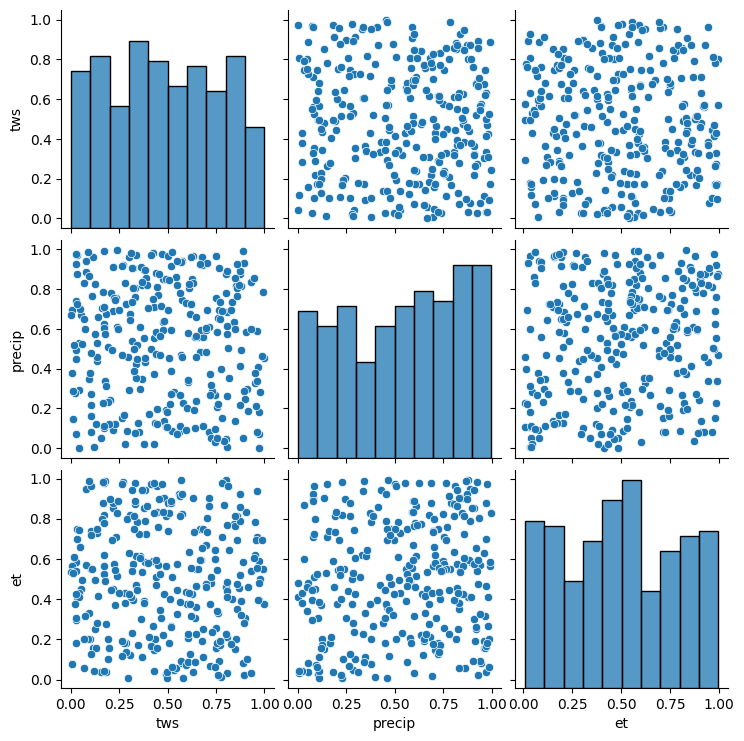

In [337]:
sns.pairplot(ran[:300])
plt.show()

In [176]:
# Example usage
first_subregion_id = list(subregion_datasets.keys())[0]
best_copula = lookup_best_copula(first_subregion_id)
new_drought_index = apply_best_copula(first_subregion_id)

Subregion 1.0:
Best Copula: Gaussian
Log-Likelihood: 62230.99
AIC: -124455.98
BIC: -124419.55
Parameters: [0.06915878 0.28476277 0.00718232]
Drought index recomputed for subregion 1.0 using GaussianCopula


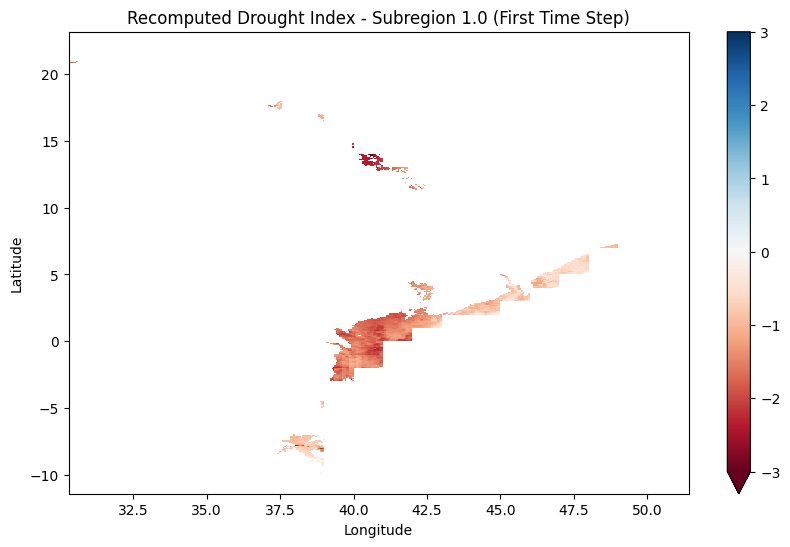

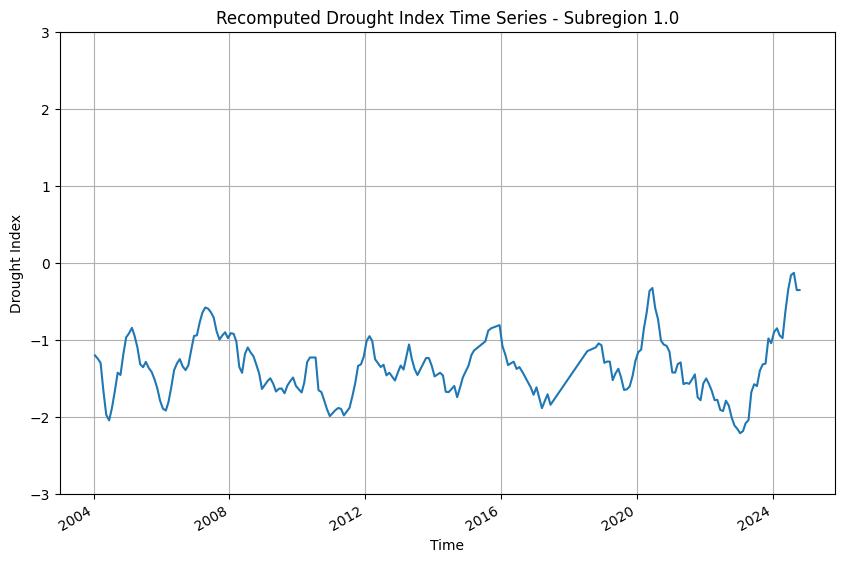

In [190]:
# Visualize
plt.figure(figsize=(10, 6))
new_drought_index.isel(time=1).plot(cmap='RdBu', vmin=-3, vmax=3)
plt.title(f"Recomputed Drought Index - Subregion {first_subregion_id} (First Time Step)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

plt.figure(figsize=(10, 6))
apply_ema(new_drought_index, span=6).mean(dim=['y', 'x']).plot()
plt.title(f"Recomputed Drought Index Time Series - Subregion {first_subregion_id}")
plt.xlabel("Time")
plt.ylabel("Drought Index")
plt.ylim(-3, 3)  # Set y-axis limits to -3 and 3
plt.grid(True)
plt.show()

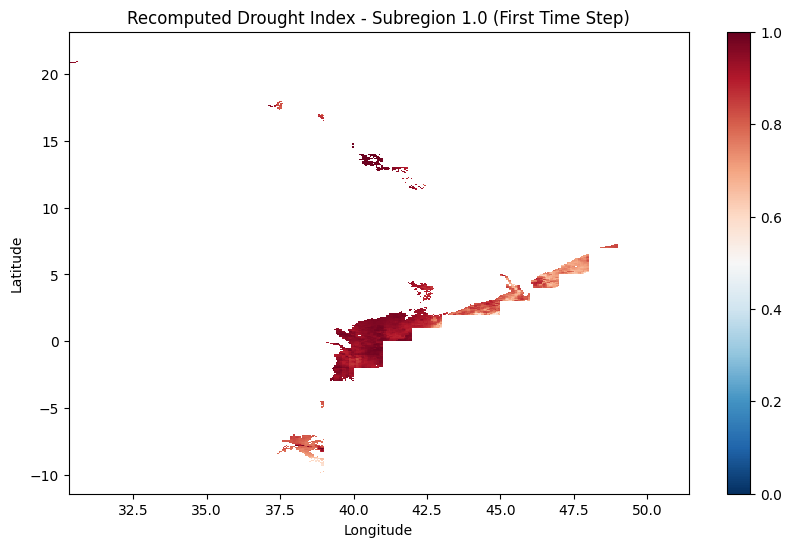

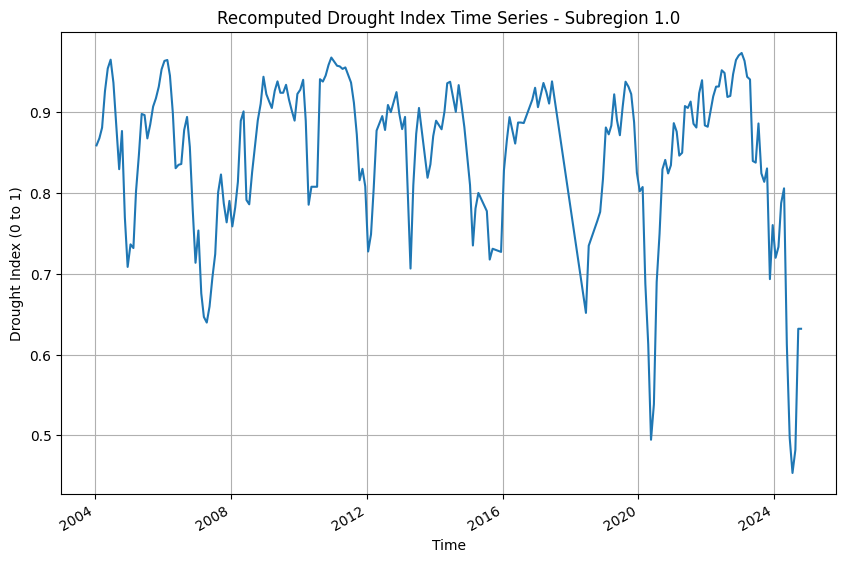

In [495]:
# Visualize
plt.figure(figsize=(10, 6))
new_drought_index.isel(time=1).plot(cmap='RdBu_r', vmin=0, vmax=1)
plt.title(f"Recomputed Drought Index - Subregion {first_subregion_id} (First Time Step)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

plt.figure(figsize=(10, 6))
apply_ema(new_drought_index, span=3).mean(dim=['y', 'x']).plot()
plt.title(f"Recomputed Drought Index Time Series - Subregion {first_subregion_id}")
plt.xlabel("Time")
plt.ylabel("Drought Index (0 to 1)")
plt.grid(True)
plt.show()

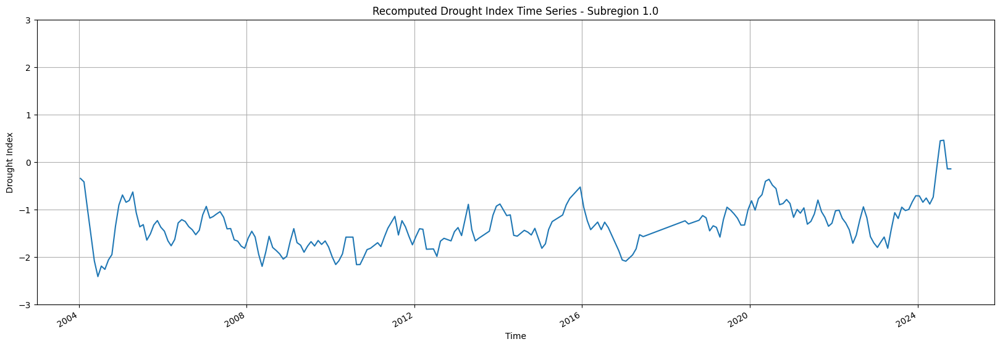

In [218]:
plt.figure(figsize=(20, 6))
apply_ema(new_drought_index, span=6).sel(y=5, x=47.5, method="nearest").plot()
plt.title(f"Recomputed Drought Index Time Series - Subregion {first_subregion_id}")
plt.xlabel("Time")
plt.ylabel("Drought Index")
plt.ylim(-3, 3)  # Set y-axis limits to -3 and 3
plt.grid(True)
plt.show()

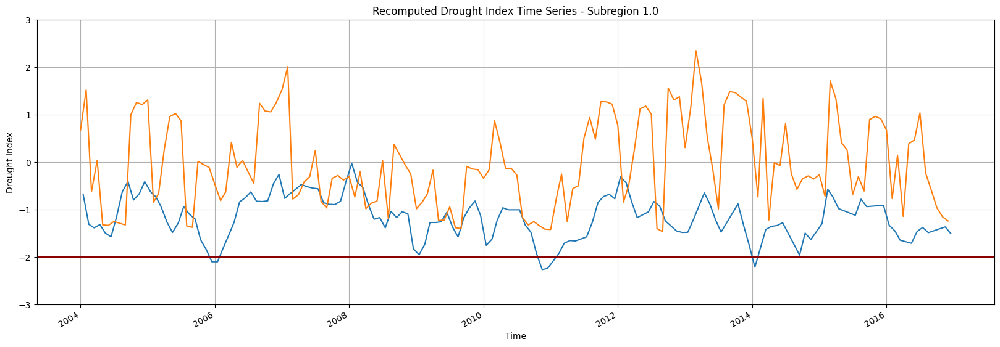

In [221]:
plt.figure(figsize=(20, 6))
apply_ema(new_drought_index.sel(time=slice('2004-01-01', '2016-12-31')), span=3).sel(y=0, x=40, method="nearest").plot(label="GHDI")
spei03.sel(lat=5, lon=47.5, method="nearest").plot(label="SPEI-03")
plt.title(f"Recomputed Drought Index Time Series - Subregion {first_subregion_id}")
plt.xlabel("Time")
plt.ylabel("Drought Index")
plt.ylim(-3, 3)  # Set y-axis limits to -3 and 3
plt.axhline(y=-2, color='darkred')
plt.grid(True)
plt.show()

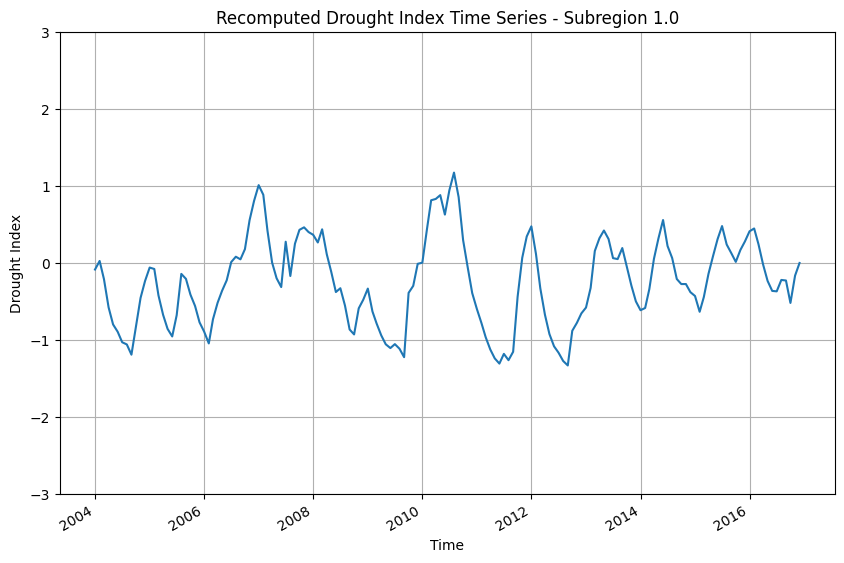

In [214]:
plt.figure(figsize=(10, 6))
# apply_ema(new_drought_index, span=6).sel(y=0, x=40, method="nearest").plot(label="GHDI")
apply_ema(spei03, span=6).sel(lat=0, lon=40, method="nearest").plot(label="SPEI-03")
plt.title(f"Recomputed Drought Index Time Series - Subregion {first_subregion_id}")
plt.xlabel("Time")
plt.ylabel("Drought Index")
plt.ylim(-3, 3)  # Set y-axis limits to -3 and 3
plt.grid(True)
plt.show()

In [202]:
spei03 = xr.open_dataset(os.path.join(dataset, 'validation_datasets/spei03.nc')).spei.sel(time=slice('2004-01-01', None))
spei03

<xarray.DataArray 'spei' (time: 156, lat: 1800, lon: 2080)>
[584064000 values with dtype=float32]
Coordinates:
  * lat      (lat) float32 47.97 47.92 47.88 47.83 ... -41.88 -41.92 -41.97
  * lon      (lon) float32 -27.98 -27.92 -27.88 -27.83 ... 75.88 75.93 75.97
  * time     (time) datetime64[ns] 2004-01-01 2004-02-01 ... 2016-12-01
Attributes:
    units:      z value
    long_name:  Standardized Precipitation Evapotranspiration Index

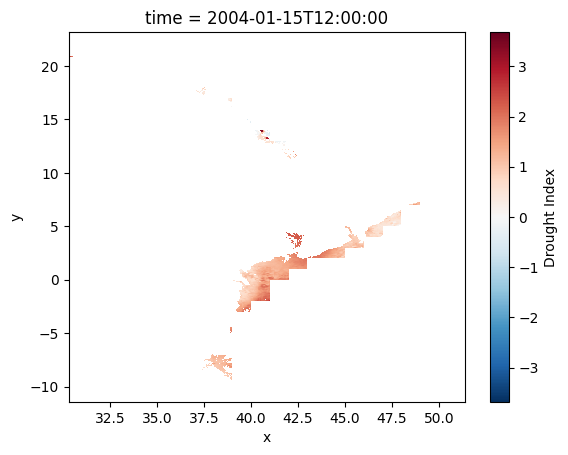

In [474]:
stand.isel(time=0).plot()

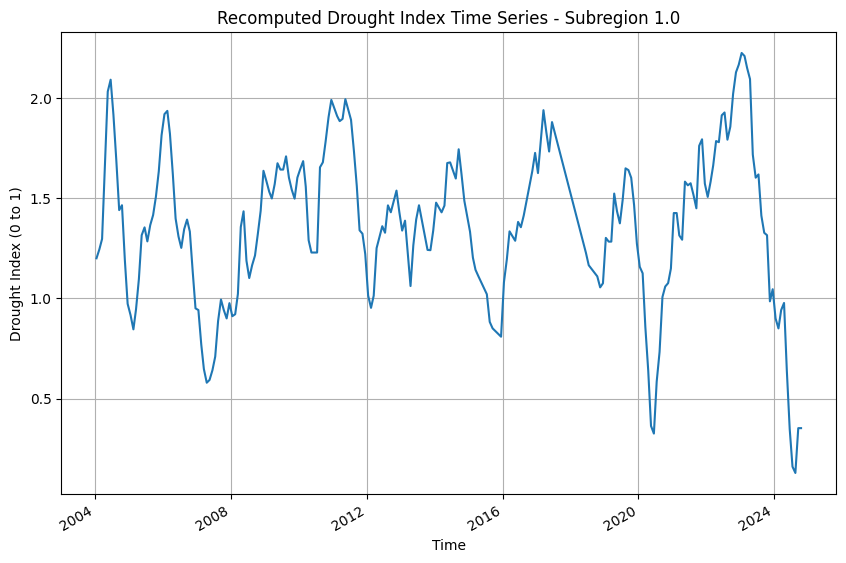

In [493]:
plt.figure(figsize=(10, 6))
apply_ema(stand, span=6).mean(dim=['y', 'x']).plot()
plt.title(f"Recomputed Drought Index Time Series - Subregion {first_subregion_id}")
plt.xlabel("Time")
plt.ylabel("Drought Index (0 to 1)")
plt.grid(True)
plt.show()

In [497]:
# Example usage
fteen_subregion_id = list(subregion_datasets.keys())[13]
best_copula_14 = lookup_best_copula(fteen_subregion_id)
new_drought_index_14 = apply_best_copula(fteen_subregion_id)

Subregion 14.0:
Best Copula: Gaussian
Log-Likelihood: 1115.14
AIC: -2224.28
BIC: -2190.98
Parameters: [-0.02276805 -0.04167455  0.04874515]
Drought index recomputed for subregion 14.0 using GaussianCopula


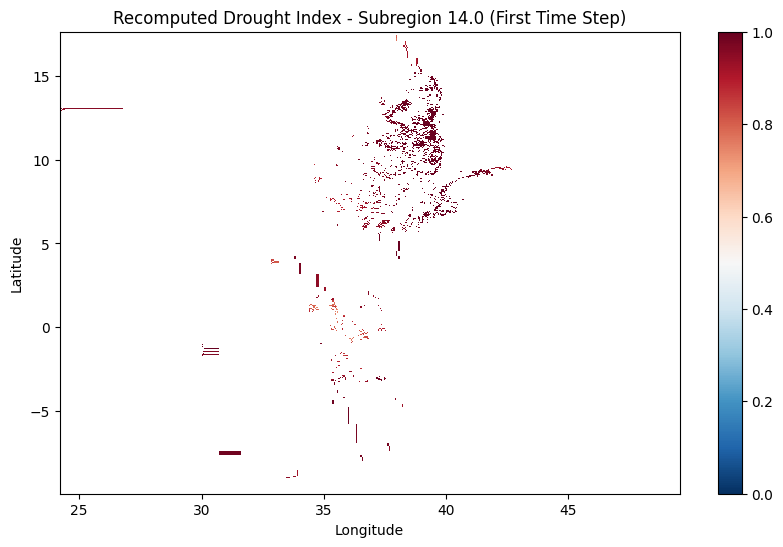

In [482]:
plt.figure(figsize=(10, 6))
new_drought_index_14.isel(time=1).plot(cmap='RdBu_r', vmin=0, vmax=1)
plt.title(f"Recomputed Drought Index - Subregion {fteen_subregion_id} (First Time Step)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

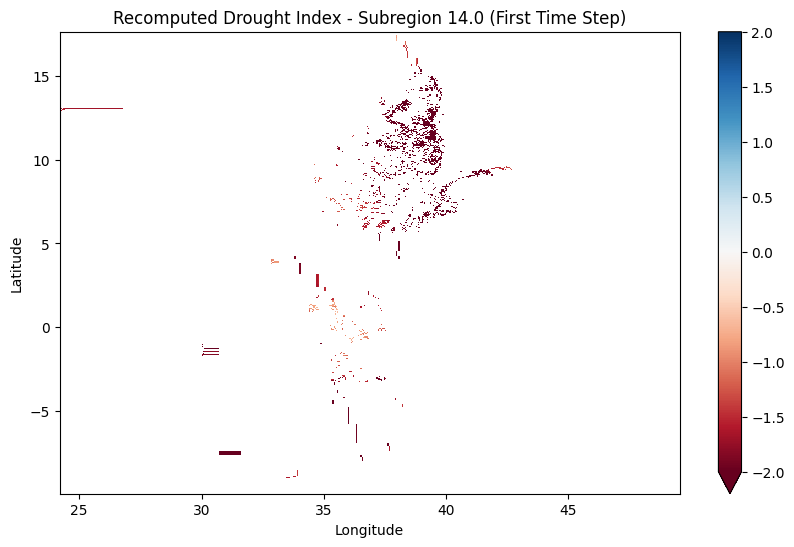

In [509]:
plt.figure(figsize=(10, 6))
new_drought_index_14.isel(time=1).plot(cmap='RdBu',  vmin=-2, vmax=2)
plt.title(f"Recomputed Drought Index - Subregion {fteen_subregion_id} (First Time Step)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

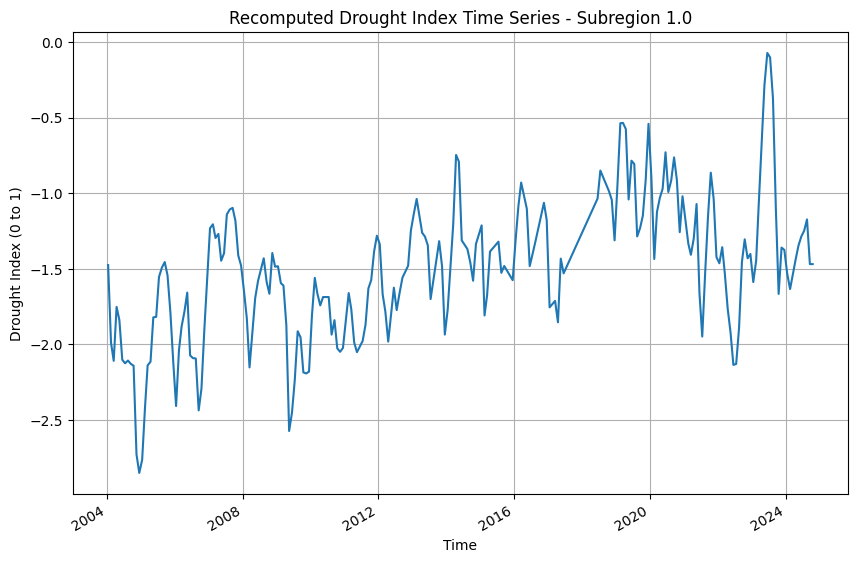

In [502]:
plt.figure(figsize=(10, 6))
apply_ema(new_drought_index_14, span=3).mean(dim=['y', 'x']).plot()
plt.title(f"Recomputed Drought Index Time Series - Subregion {first_subregion_id}")
plt.xlabel("Time")
plt.ylabel("Drought Index (0 to 1)")
plt.grid(True)
plt.show()

In [510]:
new = new_drought_index_14.combine_first(new_drought_index)

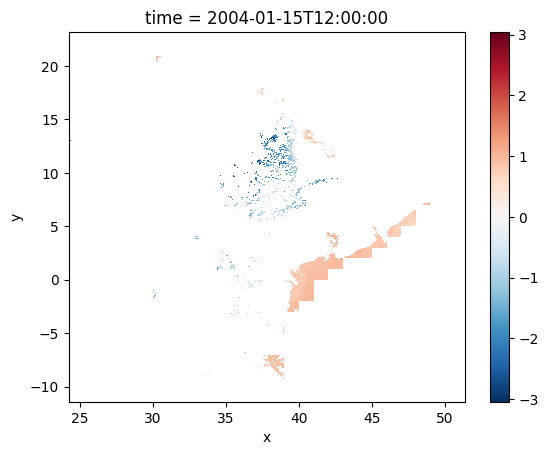

In [511]:
new.isel(time=0).plot()

In [516]:
drought_list = []
for subregion_id in subregion_datasets:
    drought_list.append(apply_best_copula(subregion_id))
    
drought_list

Drought index recomputed for subregion 1.0 using GaussianCopula
Drought index recomputed for subregion 2.0 using ClaytonCopula
Drought index recomputed for subregion 3.0 using GumbelCopula
Drought index recomputed for subregion 4.0 using GaussianCopula
Drought index recomputed for subregion 5.0 using GumbelCopula
Drought index recomputed for subregion 6.0 using GaussianCopula
Drought index recomputed for subregion 7.0 using GumbelCopula
Drought index recomputed for subregion 8.0 using GumbelCopula
Drought index recomputed for subregion 9.0 using GaussianCopula
Drought index recomputed for subregion 10.0 using GumbelCopula
Drought index recomputed for subregion 11.0 using GaussianCopula
Drought index recomputed for subregion 12.0 using GumbelCopula
Drought index recomputed for subregion 13.0 using ClaytonCopula
Drought index recomputed for subregion 14.0 using GaussianCopula
Drought index recomputed for subregion 15.0 using GaussianCopula


[<xarray.DataArray (time: 219, y: 671, x: 337)>
 array([[[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],
 
        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],
 
        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
 ...
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],
 
        [[nan, nan, nan, ..., nan, nan, nan],
        

In [224]:
drought_list = []
for subregion_id in subregion_datasets:
    drought_list.append(apply_best_copula(subregion_id))

Drought index recomputed for subregion 1.0 using GaussianCopula
Drought index recomputed for subregion 2.0 using ClaytonCopula
Drought index recomputed for subregion 3.0 using GumbelCopula
Drought index recomputed for subregion 4.0 using GaussianCopula
Drought index recomputed for subregion 5.0 using GumbelCopula
Drought index recomputed for subregion 6.0 using GaussianCopula
Drought index recomputed for subregion 7.0 using GumbelCopula
Drought index recomputed for subregion 8.0 using ClaytonCopula
Drought index recomputed for subregion 9.0 using GaussianCopula


In [257]:
on = drought_list[0].combine_first(drought_list[1])

In [269]:
on = on.combine_first(drought_list[8])

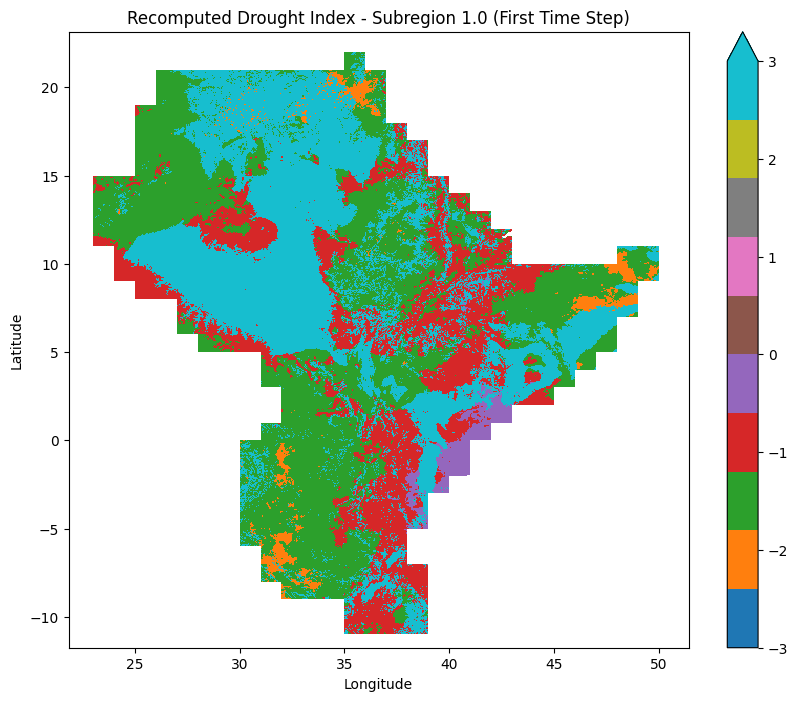

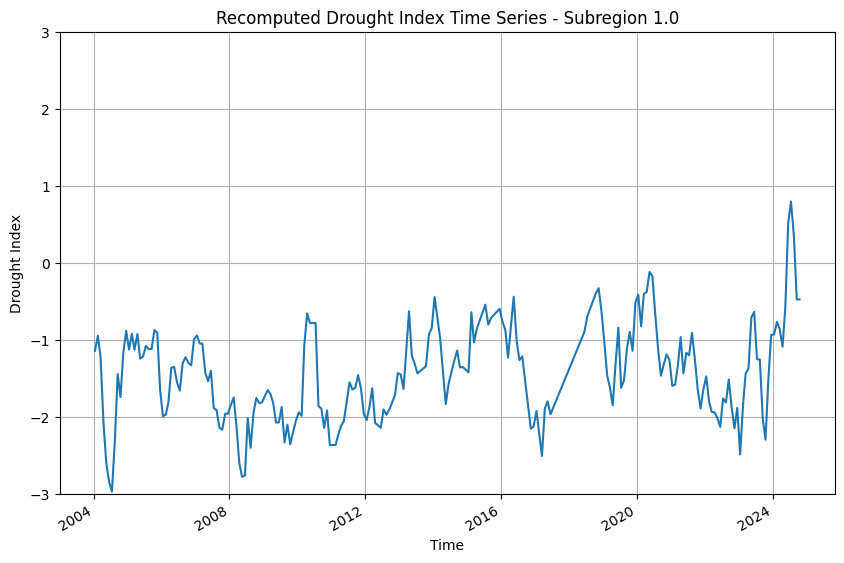

In [286]:
# Visualize
plt.figure(figsize=(10, 8))
on.sel(time=slice("2007-01-01", "2007-12-31")).mean(dim="time").plot(cmap='tab10', vmin=-3, vmax=3)
plt.title(f"Recomputed Drought Index - Subregion {first_subregion_id} (First Time Step)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

plt.figure(figsize=(10, 6))
apply_ema(on, span=3).sel(y=6, x=45, method="nearest").plot()
plt.title(f"Recomputed Drought Index Time Series - Subregion {first_subregion_id}")
plt.xlabel("Time")
plt.ylabel("Drought Index")
plt.ylim(-3, 3)  # Set y-axis limits to -3 and 3
plt.grid(True)
plt.show()

In [304]:
on.to_netcdf(os.path.join(dataset, 'results/ghdi.nc'))

In [485]:
full_ghdi

<xarray.Dataset>
Dimensions:      (time: 219, y: 698, x: 591)
Coordinates:
  * time         (time) datetime64[ns] 2004-01-15T12:00:00 ... 2024-10-15T12:...
    lat          (y) float64 23.12 23.07 23.02 22.97 ... -11.63 -11.68 -11.73
    lon          (x) float64 21.88 21.93 21.98 22.03 ... 51.23 51.28 51.33 51.38
    band         int64 1
  * y            (y) float64 23.12 23.07 23.02 22.97 ... -11.63 -11.68 -11.73
  * x            (x) float64 21.88 21.93 21.98 22.03 ... 51.23 51.28 51.33 51.38
    spatial_ref  int64 0
Data variables:
    tws          (y, x, time) float64 nan nan nan nan nan ... nan nan nan nan
    precip       (time, y, x) float64 nan nan nan nan nan ... nan nan nan nan
    et           (time, y, x) float64 nan nan nan nan nan ... nan nan nan nan
    landform     (y, x) float64 nan nan nan nan nan nan ... nan nan nan nan nan

#### Copula Analysis with copulae Module

In [136]:
# Function to test and select the best copula
def fit_best_copula(tws_cdf, precip_cdf, et_cdf):
    # Combine CDFs into a DataFrame (copulae expects a 2D array)
    data = np.vstack([tws_cdf, precip_cdf, et_cdf]).T
    data_df = pd.DataFrame(data, columns=['tws', 'precip', 'et'])
    
    # List of copulas to test
    copulas = {
        'Gaussian': GaussianCopula(dim=3),
        'Clayton': ClaytonCopula(dim=3),
        'Frank': FrankCopula(dim=3),
        'Gumbel': GumbelCopula(dim=3)
    }
    
    # Dictionary to store fit results
    fit_results = {}
    
    # Fit each copula and compute AIC
    for name, copula in copulas.items():
        try:
            copula.fit(data_df)
            log_likelihood = copula.log_lik(data_df)
            n_params = len(copula.params)  # Number of parameters in the copula
            aic = -2 * log_likelihood + 2 * n_params  # AIC formula
            fit_results[name] = {'copula': copula, 'aic': aic}
        except Exception as e:
            print(f"Error fitting {name} copula: {e}")
            fit_results[name] = {'copula': None, 'aic': np.inf}
    
    # Select the best copula (lowest AIC)
    best_copula_name = min(fit_results, key=lambda x: fit_results[x]['aic'])
    best_copula = fit_results[best_copula_name]['copula']
    print(f"Best copula for subregion: {best_copula_name} (AIC: {fit_results[best_copula_name]['aic']})")
    
    return best_copula

In [227]:
best_copulas

{1.0: <copulae.elliptical.gaussian.GaussianCopula at 0x7f8c6223cc10>,
 2.0: <copulae.archimedean.clayton.ClaytonCopula at 0x7f8c62406670>,
 3.0: <copulae.archimedean.gumbel.GumbelCopula at 0x7f8c622450d0>,
 4.0: <copulae.elliptical.gaussian.GaussianCopula at 0x7f8c6244afa0>,
 5.0: <copulae.archimedean.gumbel.GumbelCopula at 0x7f8c6228e0a0>,
 6.0: <copulae.elliptical.gaussian.GaussianCopula at 0x7f8c62217340>,
 7.0: <copulae.archimedean.gumbel.GumbelCopula at 0x7f8c622b12e0>,
 8.0: <copulae.archimedean.clayton.ClaytonCopula at 0x7f8c621dc7c0>,
 9.0: <copulae.elliptical.gaussian.GaussianCopula at 0x7f8c621dc400>}

In [134]:
# Function to compute drought index using the best copula
def compute_copula_index(ds):
    # Stack CDFs and drop NaNs
    stacked_data = xr.Dataset({
        'tws_cdf': ds['tws_cdf'],
        'precip_cdf': ds['precip_cdf'],
        'et_cdf': ds['et_cdf']
    }).stack(all_points=['time', 'y', 'x']).dropna(dim='all_points')
    
    # Extract CDF values
    tws_cdf = stacked_data['tws_cdf'].values
    precip_cdf = stacked_data['precip_cdf'].values
    et_cdf = stacked_data['et_cdf'].values
    
    # Fit the best copula
    best_copula = fit_best_copula(tws_cdf, precip_cdf, et_cdf)
    
    # Compute joint CDF using the best copula
    data_for_cdf = pd.DataFrame({
        'tws': tws_cdf,
        'precip': precip_cdf,
        'et': et_cdf
    })
    joint_cdf = best_copula.cdf(data_for_cdf)
    
    # Drought index: Invert joint CDF (higher values = worse drought)
    drought_index = 1 - joint_cdf
    
    # Reconstruct as DataArray
    return xr.DataArray(
        drought_index,
        coords={'all_points': stacked_data.coords['all_points']},
        dims=['all_points']
    ).unstack(), best_copula



In [137]:
# Apply to each subregion and store the best copula
best_copulas = {}  # To store the best copula for each subregion
for subregion_id, ds in subregion_datasets.items():
    ds['drought_index'], best_copula = compute_copula_index(ds)
    subregion_datasets[subregion_id] = ds
    best_copulas[subregion_id] = best_copula
    
    # Example output
    print(f"Subregion {subregion_id} drought index computed.")

# Example: Check drought index for the first subregion
print(subregion_datasets[first_subregion_id]['drought_index'])

                tws        precip            et
count  1.390176e+06  1.390176e+06  1.390176e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    7.193329e-07  7.193329e-07  7.193329e-07
25%    2.500004e-01  2.500004e-01  2.500004e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499996e-01  7.499996e-01  7.499996e-01
max    9.999993e-01  9.999993e-01  9.999993e-01
                tws        precip            et
count  1.390176e+06  1.390176e+06  1.390176e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    7.193329e-07  7.193329e-07  7.193329e-07
25%    2.500004e-01  2.500004e-01  2.500004e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499996e-01  7.499996e-01  7.499996e-01
max    9.999993e-01  9.999993e-01  9.999993e-01
Error fitting Clayton copula: object of type 'float' has no len()
                tws        precip            et
count  1.390176e+06  1

/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:165: UserWarning: For the Gumbel copula, tau must be >= 0. Replacing negative values by 0.
  warnings.warn(warning_message)


                tws        precip            et
count  1.390176e+06  1.390176e+06  1.390176e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    7.193329e-07  7.193329e-07  7.193329e-07
25%    2.500004e-01  2.500004e-01  2.500004e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499996e-01  7.499996e-01  7.499996e-01
max    9.999993e-01  9.999993e-01  9.999993e-01


/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Error fitting Gumbel copula: object of type 'float' has no len()
Best copula for subregion: Gaussian (AIC: -124455.97989720064)


IOStream.flush timed out


Subregion 1.0 drought index computed.
                tws        precip            et
count  1.183291e+07  1.183291e+07  1.183291e+07
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    8.451004e-08  8.451004e-08  8.451004e-08
25%    2.500000e-01  2.500000e-01  2.500000e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.500000e-01  7.500000e-01  7.500000e-01
max    9.999999e-01  9.999999e-01  9.999999e-01
                tws        precip            et
count  1.183291e+07  1.183291e+07  1.183291e+07
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    8.451004e-08  8.451004e-08  8.451004e-08
25%    2.500000e-01  2.500000e-01  2.500000e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.500000e-01  7.500000e-01  7.500000e-01
max    9.999999e-01  9.999999e-01  9.999999e-01
Error fitting Clayton copula: object of type 'float' has no len()



KeyboardInterrupt



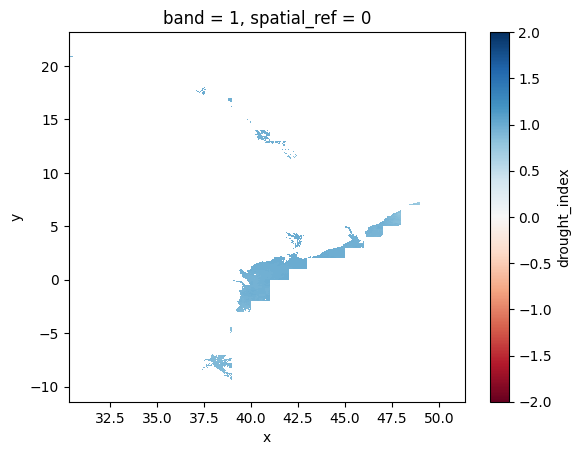

In [142]:
subregion_datasets[first_subregion_id]['drought_index'].sel(time=slice("2011-01-01", "2011-05-31")).mean(dim="time").plot(
    robust=True, cmap="RdBu", vmin=-2, vmax=2)

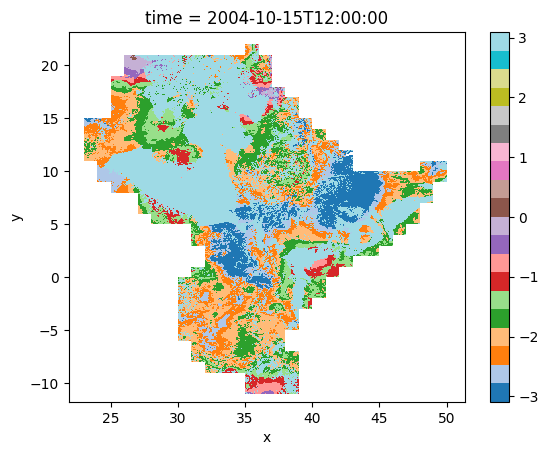

In [358]:
on.isel(time=9).plot(cmap='tab20')

In [350]:
# Example drought index (replace with your actual data)
dates = pd.date_range(start='2004-01-01', end='2023-01-01', freq='M')
drought_index = pd.Series(np.random.uniform(0, 1, len(dates)), index=dates)

In [351]:
drought_threshold = 0.4  # From your example for moderate drought
min_duration_months = 3  # Minimum duration for a drought event
recovery_period_months = 1  # Minimum period to confirm recovery

In [353]:
drought_events = []
in_drought = False
start_idx = None
current_run = []

for i, value in enumerate(on):
    if value < drought_threshold and not in_drought:
        start_idx = i
        in_drought = True
        current_run = [value]
    elif value < drought_threshold and in_drought:
        current_run.append(value)
    elif value >= drought_threshold and in_drought:
        # Check if the run meets the minimum duration
        if len(current_run) >= min_duration:
            # Calculate run sum (severity as cumulative deficit)
            run_sum = np.sum(drought_threshold - np.array(current_run))
            # Check recovery period
            if i + recovery_period <= len(drought_index):
                end_check = drought_index[i:i + recovery_period]
                if all(end_check >= drought_threshold):
                    end_idx = i - 1  # End of the drought run
                    drought_events.append({
                        'Start_Index': start_idx,
                        'End_Index': end_idx,
                        'Duration': len(current_run),  # In time steps
                        'Severity': run_sum  # Cumulative deficit
                    })
        in_drought = False
        current_run = []

# Convert to DataFrame for easier analysis
import pandas as pd
drought_df = pd.DataFrame(drought_events)
print(drought_df)

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

In [17]:
ghdi = (os.path.join(dataset, 'results/ghdi.nc'))
ghdi

'../../datasets/results/ghdi.nc'